In [29]:
import os
import math
import dill
from itertools import permutations

import numpy as np
import scipy as sp
from matplotlib import pyplot as plt
from matplotlib import gridspec
import pandas as pd
from pingouin import mixed_anova, anova, pairwise_tukey, pairwise_ttests
from statsmodels.regression.mixed_linear_model import MixedLM
from scipy.ndimage import gaussian_filter1d
import matplotlib
import seaborn as sns


import suite2p as s2p

import TwoPUtils as tpu
import STX3KO_analyses as stx
from STX3KO_analyses import utilities_ES as u #change if not ella 

ko_mice = stx.ymaze_sess_deets.ko_vr_mice
ctrl_mice = stx.ymaze_sess_deets.ctrl_vr_mice
ctrl_sessions = stx.ymaze_sess_deets.CTRL_sessions
ko_sessions = stx.ymaze_sess_deets.KO_sessions

sparse_mice = stx.ymaze_sess_deets.sparse_mice

plt.rcParams['pdf.fonttype']=42

fig_dir = "C:/Users/esay/data/Stx3/YMazeResults/behavior/rerun"

%matplotlib inline

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [25]:
dt = 15.46*2

### Lick Raster

In [26]:

def plot_lick_raster_ES(sess, x, mat, day =0, ax=None, fig=None, vals = None, smooth=True ,arm=None, label=True, sig=0.5, cmap='winter'):

    if ax is None:
        fig, axs = plt.subplots(2, 2, figsize=(3, 3), sharex=True,
                            gridspec_kw={'height_ratios':[3,1]})
        ax_raster, ax_summary = axs
    elif isinstance(ax, (tuple, list)):
        ax_raster, ax_summary = ax

    xpos = sess.vr_data['posx']
    ntrials = mat.shape[0]
    mouse = sess.mouse

    trial_types = sess.trial_info['LR']

    # plot reward zones
    if arm ==1:
        ax_raster.axvspan(sess.rzone_early['tfront']*10, sess.rzone_early['tback']*10, color='blue', alpha=0.1)#, label='L zone')
        ax_summary.axvspan(sess.rzone_early['tfront']*10, sess.rzone_early['tback']*10, color='blue', alpha=0.1)#, label='L zone')
    elif arm == -1:
        ax_raster.axvspan(sess.rzone_late['tfront']*10, sess.rzone_late['tback']*10, color='green', alpha=0.1)# label='R zone')
        ax_summary.axvspan(sess.rzone_late['tfront']*10, sess.rzone_late['tback']*10, color='green', alpha=0.1)# label='R zone')
    else:
        ax_raster.axvspan(sess.rzone_early['tfront']*10, sess.rzone_early['tback']*10, color='blue', alpha=0.1)#, label='L zone')
        ax_raster.axvspan(sess.rzone_late['tfront']*10, sess.rzone_late['tback']*10, color='green', alpha=0.1)
        ax_summary.axvspan(sess.rzone_early['tfront']*10, sess.rzone_early['tback']*10, color='blue', alpha=0.1)#, label='L zone')
        ax_summary.axvspan(sess.rzone_late['tfront']*10, sess.rzone_late['tback']*10, color='green', alpha=0.1)
        
    cm = matplotlib.colormaps.get_cmap(cmap)
    # cm = LinearSegmentedColormap.from_list('MgK', ['magenta', 'white', 'black'])
    
    if smooth:
        mat = gaussian_filter1d(mat, sig, axis=1)
        
    # convert to NaN for clean plots
    # mat[mat==0]=np.nan

    #find ommission trials
    # omis = ~(np.nansum(sess.trial_matrices['rewards'],axis=-1)>0)
    stx.behavior.trial_metrics.get_probes_and_omissions(sess)
    omis = sess.trial_info['probes'] 
    # omis = omis[::-1]
    
    
    # for ind, trial_id in enumerate(np.arange(mat.shape[0] - 1, -1, -1)):
    #     if omis[ind]:
    #         ax_raster.fill_between(x, mat[ind, :] + trial_id, y2=trial_id, color='magenta',linewidth=0)#, edgecolor='hotpink')
    #     else:
    #         ax_raster.fill_between(x, mat[ind, :] + trial_id, y2=trial_id,
    #                     color=cm(np.float64(vals[ind])), linewidth=0)

    n_total = 140  # or sess.trial_info.shape[0] if consistent
    n_present = mat.shape[0]
    n_missing = n_total - n_present
    
    # Create aligned y indices (top-down)
    y_indices = np.arange(n_total - 1, -1, -1)
    
    for i in range(n_present):
        trial_id = y_indices[i]
        if omis[i]:
            ax_raster.fill_between(x, mat[i, :] + trial_id, y2=trial_id,
                                   color='magenta', linewidth=0)
        else:
            ax_raster.fill_between(x, mat[i, :] + trial_id, y2=trial_id,
                                   color=cm(np.float64(vals[i])), linewidth=0)



    if label:
        ax_raster.set_ylabel('Trials')
    # formatting
    ax_raster.spines[['top', 'right']].set_visible(False)
    ax_raster.set_title(f"{mouse} Day: {day+1}")
    ax_raster.set_ylim(top=140, bottom=0)
    # ax_raster.invert_yaxis()
    
    yticks = np.arange(0, 140, 20)
    ax_raster.set_yticks(yticks)
    ax_raster.set_yticklabels((140 - yticks).astype(int))
    # ax_raster.set_xlabel('Pos (cm)')


    trial_types = np.array(trial_types)

    # left trials
    left_mask = trial_types == -1
    if left_mask.sum() > 0:
        mean_left = mat[left_mask].mean(axis=0)
        sem_left = mat[left_mask].std(axis=0) / np.sqrt(left_mask.sum())
        ax_summary.plot(x, dt*mean_left, color="blue", lw=1.5, label="Left")
        ax_summary.fill_between(x, dt*(mean_left - sem_left), dt*(mean_left + sem_left),
                                color="blue", alpha=0.3)



    # right trials
    right_mask = trial_types == 1
    if right_mask.sum() > 0:
        mean_right = mat[right_mask].mean(axis=0)
        sem_right = mat[right_mask].std(axis=0) / np.sqrt(right_mask.sum())
        ax_summary.plot(x, dt*mean_right, color="green", lw=1.5, label="Right")
        ax_summary.fill_between(x, dt*(mean_right - sem_right), dt*(mean_right + sem_right),
                                color="green", alpha=0.3)



    ax_summary.set_ylabel("Lick rate")
    ax_summary.set_xlabel("Pos (cm)")
    ax_summary.spines[['top','right']].set_visible(False)



    return fig, ax


In [23]:
fig_dir = 'C:/Users/esay/data/Stx3/YMazeResults/behavior/lick_analysis'

{'date': '29_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 8, 'novel_arm': -1, 'ravel_ind': 0}
{'date': '01_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 5, 'novel_arm': -1, 'ravel_ind': 2}
{'date': '04_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': -1, 'ravel_ind': 5}


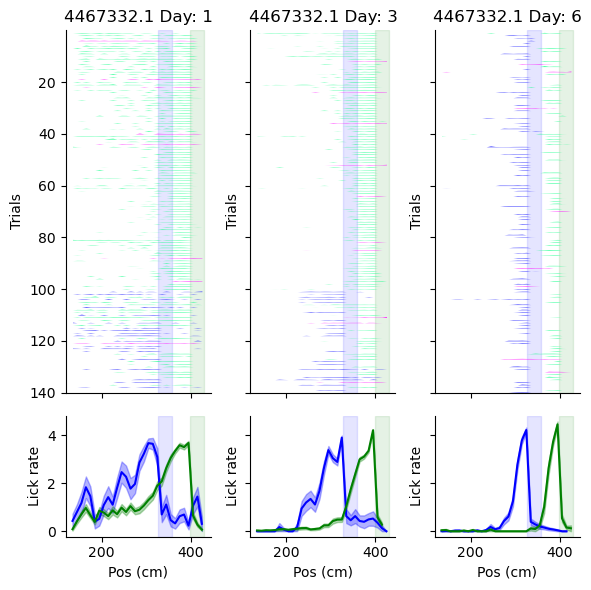

In [28]:
days =[0,2,5]
mouse = ctrl_mice[2]
# mouse = '4467975.1'
fig,axs = plt.subplots(2, len(days), figsize=(2*len(days), 6), sharey = 'row',
                      gridspec_kw = {"height_ratios":[3,1]},sharex='col')



for i, day in enumerate(days):
    sess = u.load_vr_day(mouse,day)
    sess.add_timeseries(rewards=sess.vr_data['reward'])
    sess.add_pos_binned_trial_matrix('rewards')
    x = sess.trial_matrices['bin_centers']
    mat = sess.trial_matrices['licks']
    vals = sess.trial_info['LR']
    plot_lick_raster_ES(sess, x*10,mat ,day = day,ax=(axs[0,i],axs[1,i]),fig=fig,smooth = False, vals = vals)
fig.tight_layout()
fig.savefig(os.path.join(fig_dir, f"lick_raster_and_summary{mouse}.pdf"))

### Trials per block (seaborn heatmap)

{'date': '29_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 0}
{'date': '29_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': 1, 'ravel_ind': 0}
{'date': '29_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 8, 'novel_arm': -1, 'ravel_ind': 0}
{'date': '29_11_2020', 'scene': 'YMaze_LNovel', 'session': 2, 'scan': 18, 'novel_arm': 1, 'ravel_ind': 1}
{'date': '29_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': -1, 'ravel_ind': 0}
{'date': '14_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 0}
{'date': '14_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': -1, 'ravel_ind': 0}
{'date': '14_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 0}
{'date': '15_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 0}
{'date': '30_11_2020', 'scene': 'YMaze_LNovel', 's

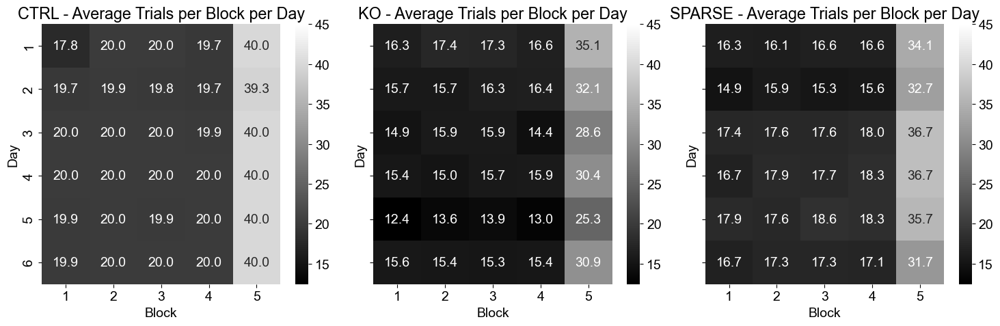

In [84]:
days = range(0, 6)          
max_blocks = 5              
groups = {'CTRL': ctrl_mice, 'KO': ko_mice, 'SPARSE':sparse_mice}
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 14

def count_trials_group(group_mice):
    mat = pd.DataFrame(
        0, 
        index=[d+1 for d in days], 
        columns=[b+1 for b in range(max_blocks)]
    )
    for day in days:
        for mouse in group_mice:

            sess = u.load_vr_day(mouse, day=day)
            for block in range(max_blocks):
                mat.loc[day+1, block+1] += np.sum(sess.trial_info['block_number'] == block+1)
    return mat/len(group_mice)

trial_matrices = {grp: count_trials_group(mice) for grp, mice in groups.items()}

all_vals = np.concatenate([trial_matrices['CTRL'].values.flatten(),
                           trial_matrices['KO'].values.flatten(),
                          trial_matrices['SPARSE'].values.flatten()])
vmin = all_vals.min()
vmax = all_vals.max() +5

fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharey=True)

for ax, grp in zip(axes, groups.keys()):
    sns.heatmap(
        trial_matrices[grp], 
        annot=True, 
        fmt='.1f', 
        cmap='grey', 
        ax=ax,
        vmin = vmin, 
        vmax = vmax
    )
    ax.set_title(f'{grp} - Average Trials per Block per Day')
    ax.set_xlabel('Block')
    ax.set_ylabel('Day')

plt.tight_layout()
plt.show()
fig.savefig(os.path.join(fig_dir, 'trials_per_block.pdf'))

### Original Analysis (to reference)

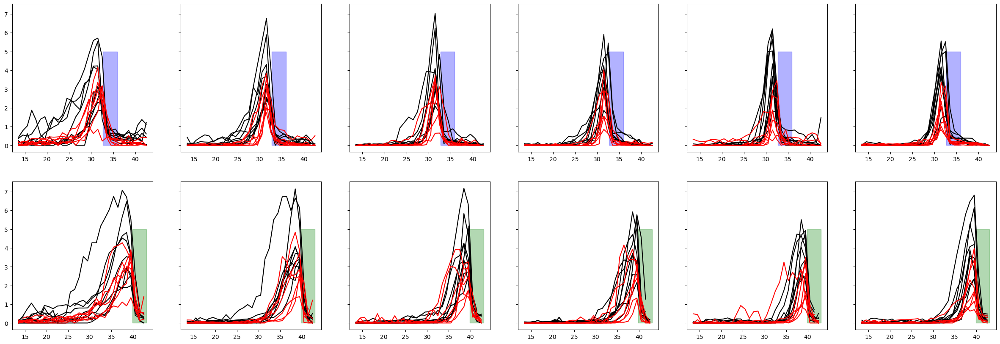

In [231]:
fig, ax = plt.subplots(2,6,figsize=[30,10], sharey=True)

ko_lr = {}
ctrl_lr = {}
for day in range(6):
    
    ctrl_lr[day]={'left':[],'right':[]}
    for i, mouse in enumerate(ctrl_mice):
        sess = u.load_vr_day(mouse,day, trial_mat_keys = ('licks','nonconsum_licks','speed'),verbose = False)
        
        ax[0,day].plot(sess.trial_matrices['bin_centers'], dt*sess.trial_matrices['licks'][sess.trial_info['LR']==-1,:].mean(axis=0),color='black')
        ax[1,day].plot(sess.trial_matrices['bin_centers'], dt*sess.trial_matrices['licks'][sess.trial_info['LR']==1,:].mean(axis=0),color='black')
        
        if i == 0:
            ax[1,day].fill_betweenx([0,5], sess.rzone_late['tfront'], sess.rzone_late['tback'],zorder=0, color='green',alpha=.3)
            ax[0,day].fill_betweenx([0,5],sess.rzone_early['tfront'], sess.rzone_early['tback'],zorder=0, color='blue',alpha=.3)
            
            t_bins = sess.trial_matrices['bin_edges'][1:]
            rzone_early = (t_bins>=sess.rzone_early['tfront']-3)*(t_bins<=sess.rzone_early['tfront'])
            rzone_late = (t_bins>=sess.rzone_late['tfront']-3)*(t_bins<=sess.rzone_late['tfront'])
            
        ctrl_lr[day]['left'].append(dt*np.nanmean(sess.trial_matrices['licks'][sess.trial_info['LR']==-1,:][:,rzone_early]))
        ctrl_lr[day]['right'].append(dt*np.nanmean(sess.trial_matrices['licks'][sess.trial_info['LR']==1,:][:,rzone_late]))
        
    ko_lr[day]={'left':[],'right':[]}
    for i, mouse in enumerate(ko_mice):
        try:
            sess = u.load_vr_day(mouse,day, verbose=False)
            trial_mask = sess.trial_info['LR']==-1
            if day==0 and i == 3:
                trial_mask[35:66]=False

            ax[0,day].plot(sess.trial_matrices['bin_centers'], dt*sess.trial_matrices['licks'][trial_mask,:].mean(axis=0),color='red')
            ax[1,day].plot(sess.trial_matrices['bin_centers'], dt*sess.trial_matrices['licks'][sess.trial_info['LR']==1,:].mean(axis=0),color='red')

            ko_lr[day]['left'].append(dt*np.nanmean(sess.trial_matrices['licks'][trial_mask,:][:,rzone_early]))
            ko_lr[day]['right'].append(dt*np.nanmean(sess.trial_matrices['licks'][sess.trial_info['LR']==1,:][:,rzone_late]))
        except:
            pass

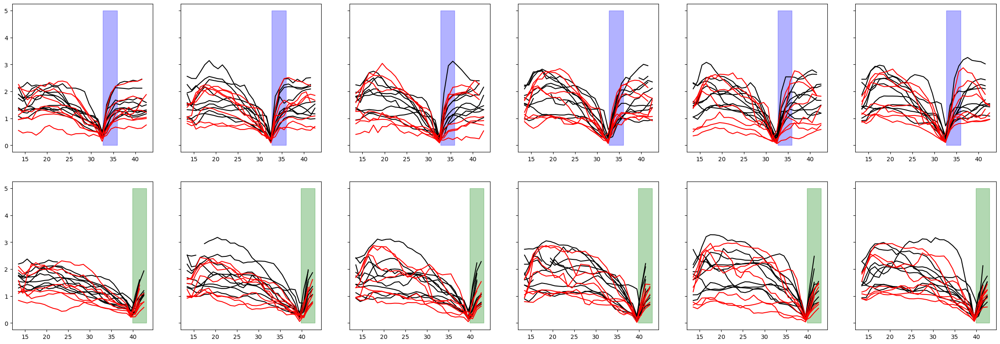

In [232]:
fig, ax = plt.subplots(2,6,figsize=[30,10], sharey=True)

ko_lr = {}
ctrl_lr = {}
for day in range(6):
    
    ctrl_lr[day]={'left':[],'right':[]}
    for i, mouse in enumerate(ctrl_mice):
        sess = u.load_vr_day(mouse,day, trial_mat_keys = ('licks','nonconsum_licks','speed'),verbose = False)
        
        ax[0,day].plot(sess.trial_matrices['bin_centers'], dt*sess.trial_matrices['speed'][sess.trial_info['LR']==-1,:].mean(axis=0),color='black')
        ax[1,day].plot(sess.trial_matrices['bin_centers'], dt*sess.trial_matrices['speed'][sess.trial_info['LR']==1,:].mean(axis=0),color='black')
        
        if i == 0:
            ax[1,day].fill_betweenx([0,5], sess.rzone_late['tfront'], sess.rzone_late['tback'],zorder=0, color='green',alpha=.3)
            ax[0,day].fill_betweenx([0,5],sess.rzone_early['tfront'], sess.rzone_early['tback'],zorder=0, color='blue',alpha=.3)
            
            t_bins = sess.trial_matrices['bin_edges'][1:]
            rzone_early = (t_bins>=sess.rzone_early['tfront']-3)*(t_bins<=sess.rzone_early['tfront'])
            rzone_late = (t_bins>=sess.rzone_late['tfront']-3)*(t_bins<=sess.rzone_late['tfront'])
            
        ctrl_lr[day]['left'].append(dt*np.nanmean(sess.trial_matrices['speed'][sess.trial_info['LR']==-1,:][:,rzone_early]))
        ctrl_lr[day]['right'].append(dt*np.nanmean(sess.trial_matrices['speed'][sess.trial_info['LR']==1,:][:,rzone_late]))
        
    ko_lr[day]={'left':[],'right':[]}
    for i, mouse in enumerate(ko_mice):
        try:
            sess = u.load_vr_day(mouse,day, verbose=False)
            trial_mask = sess.trial_info['LR']==-1
            if day==0 and i == 3:
                trial_mask[35:66]=False

            ax[0,day].plot(sess.trial_matrices['bin_centers'], dt*sess.trial_matrices['speed'][trial_mask,:].mean(axis=0),color='red')
            ax[1,day].plot(sess.trial_matrices['bin_centers'], dt*sess.trial_matrices['speed'][sess.trial_info['LR']==1,:].mean(axis=0),color='red')

            ko_lr[day]['left'].append(dt*np.nanmean(sess.trial_matrices['speed'][trial_mask,:][:,rzone_early]))
            ko_lr[day]['right'].append(dt*np.nanmean(sess.trial_matrices['speed'][sess.trial_info['LR']==1,:][:,rzone_late]))
        except:
            pass

left day 0: t:-1.347151, p:0.177932
right day 0: t:-1.347151, p:0.177932
left day 1: t:-2.309401, p:0.020921
right day 1: t:-2.309401, p:0.020921
left day 2: t:-1.058475, p:0.289839
right day 2: t:-1.828276, p:0.067508
left day 3: t:-2.598076, p:0.009375
right day 3: t:-2.116951, p:0.034264
left day 4: t:-2.886751, p:0.003892
right day 4: t:-2.886751, p:0.003892
left day 5: t:-2.598076, p:0.009375
right day 5: t:-2.886751, p:0.003892


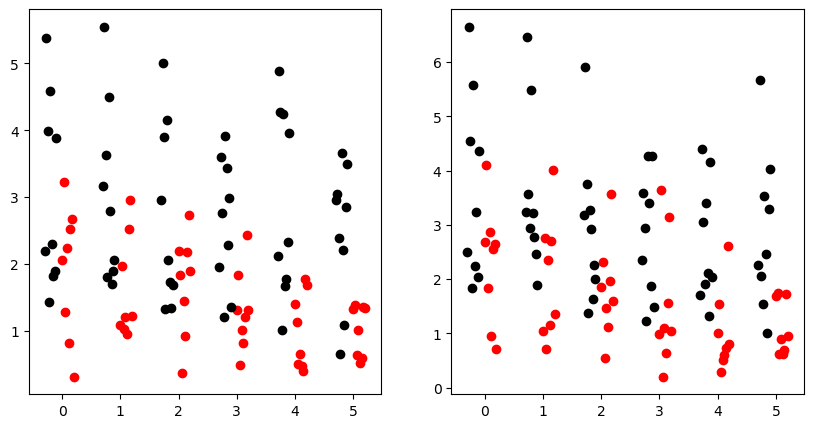

In [5]:
fig, ax = plt.subplots(1,2, figsize=[10,5])

for day in range(6):
    for ax_ind, lr in enumerate(('left', 'right')):
    
        ko = np.array(ko_lr[day][lr])
        ax[ax_ind].scatter(np.linspace(day,day+.2, num = ko.shape[0]),ko, color='red')

        ctrl = np.array(ctrl_lr[day][lr])
        ax[ax_ind].scatter(np.linspace(day-.3, day-.1, num = ctrl.shape[0]),ctrl, color='black')
    #     print(ko,ctrl)
        t,p = sp.stats.ranksums(ko,ctrl)
        print("%s day %d: t:%f, p:%f" % (lr, day,t,p))

/tmp/ipykernel_2437518/2354340833.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'mouse': mouse,
/tmp/ipykernel_2437518/2354340833.py:70: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'mouse': mouse,
/tmp/ipykernel_2437518/2354340833.py:70: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'mouse': mouse,
/tmp/ipykernel_2437518/2354340833.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'mouse': mouse,
/tmp/ipykernel_2437518/2354340833.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat ins

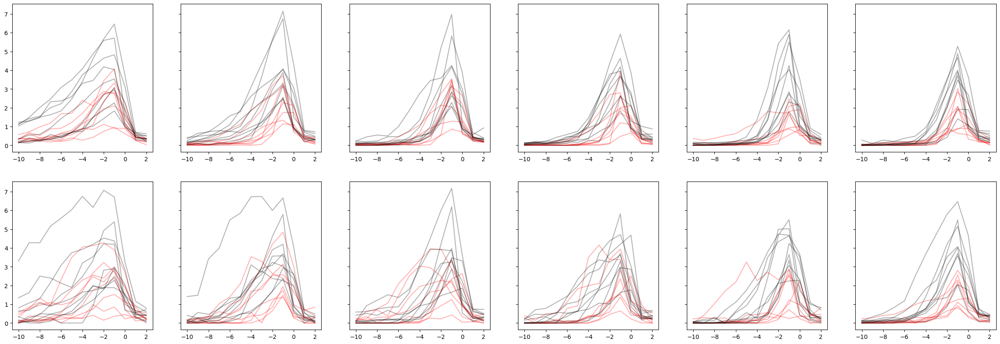

In [6]:

fig,ax = plt.subplots(2,6, figsize = [30, 10],sharey=True)


df = pd.DataFrame({'mouse':[],
                        'ko':[],
                        'day':[],
                        'day_norm': [],
                        'dz': [],
                        'ko_x_day': [],
                        'nov':[],
                        'ko_x_nov': [],
                        'lr': [],
                        'lickrate':[], 
                        'intercept': [],
                        })

key = 'nonconsum_licks'
if key in ('licks', 'nonconsum_licks'):
    alpha = dt
elif key in ('speed'):
    alpha = dt*10
else:
    alpha = 1.
ko_lr, ctrl_lr = {}, {}
for day in range(6):
    ko_lr[day] = {'fam':[],'nov':[]}
    
    x = np.arange(-10,3)
    for mouse in ko_mice:

        sess = u.load_vr_day(mouse,day, trial_mat_keys = ('licks','nonconsum_licks','licks_sum','speed'),verbose = False)
        bin_edges = sess.trial_matrices['bin_edges']
        for ax_ind, lr in enumerate([-1, 1]):
            trial_mask = sess.trial_info['LR']== lr
            
#             lick_mean = np.nanmean(sess.trial_matrices['licks_sum'][trial_mask,:].ravel())

#             mu = dt*np.nanmean(sess.trial_matrices['nonconsum_licks'][trial_mask,:], axis=0)
            
            mu = alpha*np.nanmean(sess.trial_matrices[key][trial_mask,:], axis=0)

            if sess.novel_arm ==-1:
                fam_rzone_front = np.argwhere((sess.rzone_late['tfront']<=bin_edges[1:])*(sess.rzone_late['tfront']>=bin_edges[:-1]))[0][0]
                nov_rzone_front = np.argwhere((sess.rzone_early['tfront']<=bin_edges[1:])*(sess.rzone_early['tfront']>=bin_edges[:-1]))[0][0]

            elif sess.novel_arm == 1:
                fam_rzone_front = np.argwhere((sess.rzone_early['tfront']<=bin_edges[1:])*(sess.rzone_early['tfront']>=bin_edges[:-1]))[0][0]
                nov_rzone_front = np.argwhere((sess.rzone_late['tfront']<=bin_edges[1:])*(sess.rzone_late['tfront']>=bin_edges[:-1]))[0][0]
            if lr == sess.novel_arm:
                ko_lr[day]['nov'].append(mu[nov_rzone_front-10:nov_rzone_front+3])
#                 ko_mu[day]['nov'].append(np.nanmean(mu[nov_rzone_front-3:nov_rzone_front]))
                
                _nov = np.nanmean(mu[nov_rzone_front-3:nov_rzone_front+1])
                ax[1,day].plot(x, mu[nov_rzone_front-10:nov_rzone_front+3],color='red', alpha = .3)
                df = df.append({'mouse': mouse, 
                                 'ko': 1, 
                                 'day': day,
                                 'day_norm': (day+1)/6.,
                                 'ko_x_day': (day+1)/6.,
                                 'nov': 1,
                                 'ko_x_nov': 1,
                                 'lr':ax_ind,
                                 'lickrate': _nov,
                                 'intercept': 1,
                                }, ignore_index=True)
            else:
                ko_lr[day]['fam'].append(mu[fam_rzone_front-10:fam_rzone_front+3])
                _fam = np.nanmean(mu[fam_rzone_front-3:fam_rzone_front+1])
                ax[0,day].plot(x, mu[fam_rzone_front-10:fam_rzone_front+3],color='red', alpha = .3)
                df = df.append({'mouse': mouse, 
                                 'ko': 1, 
                                 'day': day,
                                 'day_norm': (day+1)/6.,
                                 'ko_x_day': (day+1)/6.,
                                 'nov': 0,
                                 'ko_x_nov': 0,
                                 'lr': ax_ind,
                                 'lickrate': _fam,
                                 'intercept': 1,
                                }, ignore_index=True)
#                 ko_mu[day]['fam'].append(np.nanmean(mu[fam_rzone_front-3:fam_rzone_front]))
                
                    
                
       
                      

    ctrl_lr[day] = {'fam':[],'nov':[]}
    x = np.arange(-10,3)
    for mouse in ctrl_mice:
        sess = u.load_vr_day(mouse,day, trial_mat_keys = ('licks','nonconsum_licks','licks_sum','speed'),verbose = False)
        bin_edges = sess.trial_matrices['bin_edges']
        for ax_ind, lr in enumerate([-1, 1]):
            trial_mask = sess.trial_info['LR']== lr
#             lick_mean = np.nanmean(sess.trial_matrices['licks_sum'][trial_mask,:].ravel())

#             mu = dt*np.nanmean(sess.trial_matrices['nonconsum_licks'][trial_mask,:], axis=0)
            mu = alpha*np.nanmean(sess.trial_matrices[key][trial_mask,:], axis=0)

            if sess.novel_arm ==-1:

                fam_rzone_front = np.argwhere((sess.rzone_late['tfront']<=bin_edges[1:])*(sess.rzone_late['tfront']>=bin_edges[:-1]))[0][0]
                nov_rzone_front = np.argwhere((sess.rzone_early['tfront']<=bin_edges[1:])*(sess.rzone_early['tfront']>=bin_edges[:-1]))[0][0]

            elif sess.novel_arm == 1:
                fam_rzone_front = np.argwhere((sess.rzone_early['tfront']<=bin_edges[1:])*(sess.rzone_early['tfront']>=bin_edges[:-1]))[0][0]
                nov_rzone_front = np.argwhere((sess.rzone_late['tfront']<=bin_edges[1:])*(sess.rzone_late['tfront']>=bin_edges[:-1]))[0][0]

            if lr == sess.novel_arm:
                ctrl_lr[day]['nov'].append(mu[nov_rzone_front-10:nov_rzone_front+3])
#                 ctrl_mu[day]['nov'].append(np.nanmean(mu[nov_rzone_front-3:nov_rzone_front]))
                _nov = np.nanmean(mu[nov_rzone_front-3:nov_rzone_front+1])
                ax[1,day].plot(x, mu[nov_rzone_front-10:nov_rzone_front+3],color='black', alpha = .3)
                df = df.append({'mouse': mouse, 
                                 'ko': 0, 
                                 'day': day,
                                 'day_norm': (day+1)/6.,
                                 'ko_x_day': 0,
                                 'nov': 1,
                                 'ko_x_nov': 0,
                                 'lr': ax_ind,
                                 'lickrate': _nov,
                                 'intercept': 1,
                                }, ignore_index=True)
            else:
                ctrl_lr[day]['fam'].append(mu[fam_rzone_front-10:fam_rzone_front+3])
#                 ctrl_mu[day]['fam'].append(np.nanmean(mu[fam_rzone_front-3:fam_rzone_front]))
                _fam = np.nanmean(mu[fam_rzone_front-3:fam_rzone_front+1])
                ax[0,day].plot(x, mu[fam_rzone_front-10:fam_rzone_front+3],color='black', alpha = .3)
                
                df = df.append({'mouse': mouse, 
                                 'ko': 0, 
                                 'day': day,
                                 'day_norm': (day+1)/6.,
                                 'ko_x_day': 0,
                                 'nov': 0,
                                 'ko_x_nov': 0,
                                 'lr': ax_ind,
                                 'lickrate': _fam,
                                 'intercept': 1,
                                }, ignore_index=True)
        
    

# for day in range(6):
#     for ax_ind, lr in enumerate(['fam', 'nov']):
#         arr = np.array(ko_lr[day][lr])
#         mu, sem = np.nanmean(arr,axis=0), sp.stats.sem(arr, axis=0, nan_policy='omit')
#         ax[ax_ind,day].fill_between(x, mu- sem, mu+sem,color='red', alpha = .3)

#         arr = np.array(ctrl_lr[day][lr])
#         mu, sem = np.nanmean(arr,axis=0), sp.stats.sem(arr, axis=0, nan_policy='omit')
#         ax[ax_ind, day].fill_between(x, mu- sem, mu+sem,color='black', alpha = .3)
#     #     ax[ax_ind].plot(x, np.array(ko_mu[lr]).T,color='red', alpha = .3)


    
#         ax[ax_ind, day].fill_betweenx([0,5], 0, 2, zorder=-1, color='purple',alpha=.3)
#         ax[ax_ind, day].fill_betweenx([0,5], 0, 2, zorder=-1, color='purple',alpha=.3)

#         ax[ax_ind, day].set_xlabel('Position')
#         ax[ax_ind, day].set_xlabel('Position')
#         ax[ax_ind, day].set_ylabel('Lick Rate')
#         ax[ax_ind, day].spines['top'].set_visible(False)
#         ax[ax_ind, day].spines['top'].set_visible(False)
#         ax[ax_ind, day].spines['right'].set_visible(False)
#         ax[ax_ind, day].spines['right'].set_visible(False)

# fig.savefig(os.path.join(fig_dir, 'famnov_lickrate_alldays.pdf'))



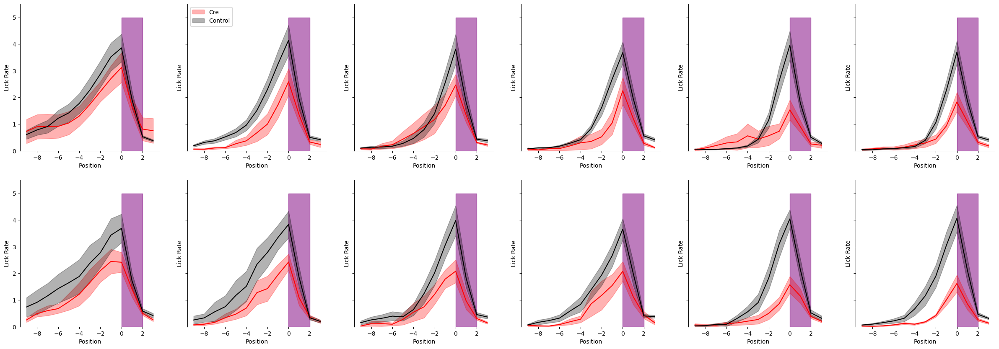

In [72]:
fig,ax = plt.subplots(2,6, figsize = [30, 10],sharey=True)


df = {'mouse':[],
      'ko':[],
      'day':[],
      'nov':[],
      'lickrate': [],
      }

key = 'nonconsum_licks'
if key in ('licks', 'nonconsum_licks'):
    alpha = dt
elif key in ('speed'):
    alpha = dt*10
else:
    alpha = 1.
ko_lr, ctrl_lr = {}, {}
for day in range(6):
    ko_lr[day] = {'fam':[],'nov':[]}
    
    x = np.arange(-10,3)
    for mouse in ko_mice:

        sess = u.load_vr_day(mouse,day, trial_mat_keys = ('licks','nonconsum_licks','licks_sum','speed'),verbose = False)
        bin_edges = sess.trial_matrices['bin_edges']
        for ax_ind, lr in enumerate([-1, 1]):
            trial_mask = sess.trial_info['LR']== lr
#             lick_mean = np.nanmean(sess.trial_matrices['licks_sum'][trial_mask,:].ravel())

#             mu = dt*np.nanmean(sess.trial_matrices['nonconsum_licks'][trial_mask,:], axis=0)
            
            mu = alpha*np.nanmean(sess.trial_matrices[key][trial_mask,:], axis=0)

            if sess.novel_arm ==-1:
                fam_rzone_front = np.argwhere((sess.rzone_late['tfront']<=bin_edges[1:])*(sess.rzone_late['tfront']>=bin_edges[:-1]))[0][0]
                nov_rzone_front = np.argwhere((sess.rzone_early['tfront']<=bin_edges[1:])*(sess.rzone_early['tfront']>=bin_edges[:-1]))[0][0]

            elif sess.novel_arm == 1:
                fam_rzone_front = np.argwhere((sess.rzone_early['tfront']<=bin_edges[1:])*(sess.rzone_early['tfront']>=bin_edges[:-1]))[0][0]
                nov_rzone_front = np.argwhere((sess.rzone_late['tfront']<=bin_edges[1:])*(sess.rzone_late['tfront']>=bin_edges[:-1]))[0][0]
            if lr == sess.novel_arm:
                ko_lr[day]['nov'].append(mu[nov_rzone_front-10:nov_rzone_front+3])
#                 ko_mu[day]['nov'].append(np.nanmean(mu[nov_rzone_front-3:nov_rzone_front]))
                
                _nov = np.nanmean(mu[nov_rzone_front-3:nov_rzone_front+1])
                df['mouse'].append(mouse)
                df['ko'].append('ko')
                df['day'].append(day)
                df['nov'].append('nov')
                df['lickrate'].append(_nov)
            
            
                # df = df.append({'mouse': mouse, 
                #                  'ko': 1, 
                #                  'day': day,
                #                  'day_norm': (day+1)/6.,
                #                  'ko_x_day': (day+1)/6.,
                #                  'nov': 1,
                #                  'ko_x_nov': 1,
                #                  'lr':ax_ind,
                #                  'lickrate': _nov,
                #                  'intercept': 1,
                #                 }, ignore_index=True)
            else:
                ko_lr[day]['fam'].append(mu[fam_rzone_front-10:fam_rzone_front+3])
                _fam = np.nanmean(mu[fam_rzone_front-3:fam_rzone_front+1])
                df['mouse'].append(mouse)
                df['ko'].append('ko')
                df['day'].append(day)
                df['nov'].append('fam')
                df['lickrate'].append(_fam)
                # df = df.append({'mouse': mouse, 
                #                  'ko': 1, 
                #                  'day': day,
                #                  'day_norm': (day+1)/6.,
                #                  'ko_x_day': (day+1)/6.,
                #                  'nov': 0,
                #                  'ko_x_nov': 0,
                #                  'lr': ax_ind,
                #                  'lickrate': _fam,
                #                  'intercept': 1,
                #                 }, ignore_index=True)
#                 ko_mu[day]['fam'].append(np.nanmean(mu[fam_rzone_front-3:fam_rzone_front]))
                
                    
                
    
                      

    ctrl_lr[day] = {'fam':[],'nov':[]}
    x = np.arange(-9,4)
    for mouse in ctrl_mice:
        sess = u.load_vr_day(mouse,day, trial_mat_keys = ('licks','nonconsum_licks','licks_sum','speed'),verbose = False)
        bin_edges = sess.trial_matrices['bin_edges']
        for ax_ind, lr in enumerate([-1, 1]):
            trial_mask = sess.trial_info['LR']== lr
#             lick_mean = np.nanmean(sess.trial_matrices['licks_sum'][trial_mask,:].ravel())

#             mu = dt*np.nanmean(sess.trial_matrices['nonconsum_licks'][trial_mask,:], axis=0)
            mu = alpha*np.nanmean(sess.trial_matrices[key][trial_mask,:], axis=0)

            if sess.novel_arm ==-1:

                fam_rzone_front = np.argwhere((sess.rzone_late['tfront']<=bin_edges[1:])*(sess.rzone_late['tfront']>=bin_edges[:-1]))[0][0]
                nov_rzone_front = np.argwhere((sess.rzone_early['tfront']<=bin_edges[1:])*(sess.rzone_early['tfront']>=bin_edges[:-1]))[0][0]

            elif sess.novel_arm == 1:
                fam_rzone_front = np.argwhere((sess.rzone_early['tfront']<=bin_edges[1:])*(sess.rzone_early['tfront']>=bin_edges[:-1]))[0][0]
                nov_rzone_front = np.argwhere((sess.rzone_late['tfront']<=bin_edges[1:])*(sess.rzone_late['tfront']>=bin_edges[:-1]))[0][0]

            if lr == sess.novel_arm:
                ctrl_lr[day]['nov'].append(mu[nov_rzone_front-10:nov_rzone_front+3])
#                 ctrl_mu[day]['nov'].append(np.nanmean(mu[nov_rzone_front-3:nov_rzone_front]))
                _nov = np.nanmean(mu[nov_rzone_front-3:nov_rzone_front+1])
                df['mouse'].append(mouse)
                df['ko'].append('ctrl')
                df['day'].append(day)
                df['nov'].append('nov')
                df['lickrate'].append(_nov)
                # df = df.append({'mouse': mouse, 
                #                  'ko': 0, 
                #                  'day': day,
                #                  'day_norm': (day+1)/6.,
                #                  'ko_x_day': 0,
                #                  'nov': 1,
                #                  'ko_x_nov': 0,
                #                  'lr': ax_ind,
                #                  'lickrate': _nov,
                #                  'intercept': 1,
                #                 }, ignore_index=True)
            else:
                ctrl_lr[day]['fam'].append(mu[fam_rzone_front-10:fam_rzone_front+3])
#                 ctrl_mu[day]['fam'].append(np.nanmean(mu[fam_rzone_front-3:fam_rzone_front]))
                _fam = np.nanmean(mu[fam_rzone_front-3:fam_rzone_front+1])
                df['mouse'].append(mouse)
                df['ko'].append('ctrl')
                df['day'].append(day)
                df['nov'].append('fam')
                df['lickrate'].append(_fam)
                # df = df.append({'mouse': mouse, 
                #                  'ko': 0, 
                #                  'day': day,
                #                  'day_norm': (day+1)/6.,
                #                  'ko_x_day': 0,
                #                  'nov': 0,
                #                  'ko_x_nov': 0,
                #                  'lr': ax_ind,
                #                  'lickrate': _fam,
                #                  'intercept': 1,
                #                 }, ignore_index=True)
            
df = pd.DataFrame(df)
        
    

for day in range(6):
    for ax_ind, lr in enumerate(['fam', 'nov']):
        arr = np.array(ko_lr[day][lr])
        mu, sem = np.nanmean(arr,axis=0), sp.stats.sem(arr, axis=0, nan_policy='omit')
        ax[ax_ind,day].fill_between(x, mu- sem, mu+sem,color='red', alpha = .3, label='Cre')
        ax[ax_ind,day].plot(x, mu,color='red', alpha = 1)

        arr = np.array(ctrl_lr[day][lr])
        mu, sem = np.nanmean(arr,axis=0), sp.stats.sem(arr, axis=0, nan_policy='omit')
        ax[ax_ind, day].fill_between(x, mu- sem, mu+sem,color='black', alpha = .3, label='Control')
    #     ax[ax_ind].plot(x, np.array(ko_mu[lr]).T,color='red', alpha = .3)
        ax[ax_ind,day].plot(x, mu,color='black', alpha = 1)

    
        ax[ax_ind, day].fill_betweenx([0,5], 0, 2, zorder=-1, color='purple',alpha=.3)
        ax[ax_ind, day].fill_betweenx([0,5], 0, 2, zorder=-1, color='purple',alpha=.3)

        ax[ax_ind, day].set_xlabel('Position')
        ax[ax_ind, day].set_xlabel('Position')
        ax[ax_ind, day].set_ylabel('Lick Rate')
        ax[ax_ind, day].spines['top'].set_visible(False)
        ax[ax_ind, day].spines['top'].set_visible(False)
        ax[ax_ind, day].spines['right'].set_visible(False)
        ax[ax_ind, day].spines['right'].set_visible(False)
        ax[ax_ind, day].set_ylim([0,5.5])
ax[0,1].legend(loc = 'upper left')

fig.savefig(os.path.join(fig_dir, 'famnov_lickrate_alldays.pdf'))

# Misc analysis

In [8]:
def plot_lick_raster_ES(sess, x, mat, day=0, ax=None, fig=None, vals=None, smooth=True, arm=None, label=True, sig=0.5, cmap='winter'):

    if ax is None:
        fig, axs = plt.subplots(2, 2, figsize=(3, 3), sharex=True,
                            gridspec_kw={'height_ratios':[3,1]})
        ax_raster, ax_summary = axs
    elif isinstance(ax, (tuple, list)):
        ax_raster, ax_summary = ax

    xpos = sess.vr_data['posx']
    ntrials = mat.shape[0]
    mouse = sess.mouse

    trial_types = sess.trial_info['LR']

    # plot reward zones
    if arm == 1:
        ax_raster.axvspan(sess.rzone_early['tfront']*10, sess.rzone_early['tback']*10, color='blue', alpha=0.1)
        ax_summary.axvspan(sess.rzone_early['tfront']*10, sess.rzone_early['tback']*10, color='blue', alpha=0.1)
    elif arm == -1:
        ax_raster.axvspan(sess.rzone_late['tfront']*10, sess.rzone_late['tback']*10, color='green', alpha=0.1)
        ax_summary.axvspan(sess.rzone_late['tfront']*10, sess.rzone_late['tback']*10, color='green', alpha=0.1)
    else:
        ax_raster.axvspan(sess.rzone_early['tfront']*10, sess.rzone_early['tback']*10, color='blue', alpha=0.1)
        ax_raster.axvspan(sess.rzone_late['tfront']*10, sess.rzone_late['tback']*10, color='green', alpha=0.1)
        ax_summary.axvspan(sess.rzone_early['tfront']*10, sess.rzone_early['tback']*10, color='blue', alpha=0.1)
        ax_summary.axvspan(sess.rzone_late['tfront']*10, sess.rzone_late['tback']*10, color='green', alpha=0.1)
        
    cm = matplotlib.colormaps.get_cmap(cmap)
    
    # Store original mat for summary calculation (before smoothing)
    mat_original = mat.copy()
    
    if smooth:
        mat = gaussian_filter1d(mat, sig, axis=1)

    # Find omission trials
    stx.behavior.trial_metrics.get_probes_and_omissions(sess)
    omis = sess.trial_info['probes']
    
    n_total = 140
    n_present = mat.shape[0]
    n_missing = n_total - n_present
    
    # Create aligned y indices (top-down)
    y_indices = np.arange(n_total - 1, -1, -1)
    
    for i in range(n_present):
        trial_id = y_indices[i]
        if omis[i]:
            ax_raster.fill_between(x, mat[i, :] + trial_id, y2=trial_id,
                                   color='magenta', linewidth=0)
        else:
            ax_raster.fill_between(x, mat[i, :] + trial_id, y2=trial_id,
                                   color=cm(np.float64(vals[i])), linewidth=0)

    if label:
        ax_raster.set_ylabel('Trials')
    
    # formatting
    ax_raster.spines[['top', 'right']].set_visible(False)
    ax_raster.set_title(f"{mouse} Day: {day+1}")
    ax_raster.set_ylim(top=140, bottom=0)
    
    yticks = np.arange(0, 140, 20)
    ax_raster.set_yticks(yticks)
    ax_raster.set_yticklabels((140 - yticks).astype(int))

    trial_types = np.array(trial_types)



    sess = u.load_vr_day(mouse, day, trial_mat_keys=('licks', 'nonconsum_licks', 'licks_sum', 'speed'), verbose=False)
    if isinstance(sess, stx.session.ConcatYMazeSession):
        sess = get_concat_total_licks(mouse, day, ko='CTRL')
    else:
        sess.timeseries['total_licks'] = np.copy(sess.timeseries['nonconsum_licks'])
        sess.add_pos_binned_trial_matrix('total_licks', use_sum=True)

    mat_total = sess.trial_matrices['total_licks']
    # left trials
    left_mask = trial_types == -1
    if left_mask.sum() > 0:
        # Sum licks in each bin for each trial, then average across trials
        mean_left = mat_total[left_mask].mean(axis=0)
        sem_left = mat_total[left_mask].std(axis=0) / np.sqrt(left_mask.sum())
        ax_summary.plot(x, mean_left, color="blue", lw=1.5, label="Left")
        ax_summary.fill_between(x, mean_left - sem_left, mean_left + sem_left,
                                color="blue", alpha=0.3)

    # right trials
    right_mask = trial_types == 1
    if right_mask.sum() > 0:
        # Sum licks in each bin for each trial, then average across trials
        mean_right = mat_total[right_mask].mean(axis=0)
        sem_right = mat_total[right_mask].std(axis=0) / np.sqrt(right_mask.sum())
        ax_summary.plot(x, mean_right, color="green", lw=1.5, label="Right")
        ax_summary.fill_between(x, mean_right - sem_right, mean_right + sem_right,
                                color="green", alpha=0.3)

    ax_summary.set_ylabel("Total licks")  # Changed from "Lick rate"
    ax_summary.set_xlabel("Pos (cm)")
    ax_summary.spines[['top','right']].set_visible(False)

    return fig, ax

### reward zone CV

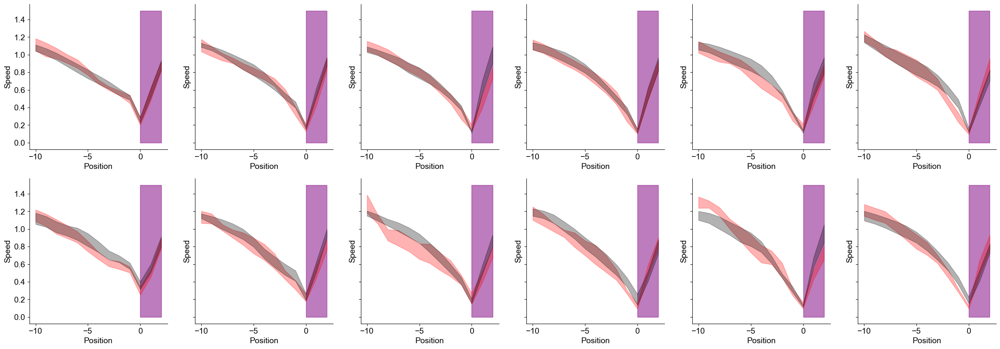

In [443]:



df = {'mouse':[],
      'ko':[],
      'day':[],
      'nov':[],
      'speed':[],
      'LR': [],
      'cov': []}

key = 'speed'
if key in ('licks', 'nonconsum_licks'):
    alpha = dt
elif key in ('speed'):
    alpha = dt*10
else:
    alpha = 1.
ko_lr, ctrl_lr = {}, {}
for day in range(6):
    ko_lr[day] = {'speed':{'fam':[],'nov':[]}, 'cov':{'fam':[], 'nov':[]}}
    
    x = np.arange(-10,3)
    for mouse in ko_mice:

        sess = u.load_vr_day(mouse,day, trial_mat_keys = ('licks','nonconsum_licks','licks_sum','speed'),verbose = False)
        bin_edges = sess.trial_matrices['bin_edges']
        for ax_ind, lr in enumerate([-1, 1]):
            trial_mask = sess.trial_info['LR']== lr
            df['LR'].append(lr)
            grand_mean = alpha*np.nanmean(sess.trial_matrices[key][trial_mask,:].ravel())
            std = np.nanstd(alpha*sess.trial_matrices[key][trial_mask,:]/grand_mean, axis=0)
            mu = np.nanmean(alpha*sess.trial_matrices[key][trial_mask,:]/grand_mean, axis=0) #/grandmean
            cov = std/mu
            # mu = 

            if sess.novel_arm ==-1:
                fam_rzone_front = np.argwhere((sess.rzone_late['tfront']<=bin_edges[1:])*(sess.rzone_late['tfront']>=bin_edges[:-1]))[0][0]
                nov_rzone_front = np.argwhere((sess.rzone_early['tfront']<=bin_edges[1:])*(sess.rzone_early['tfront']>=bin_edges[:-1]))[0][0]

            elif sess.novel_arm == 1:
                fam_rzone_front = np.argwhere((sess.rzone_early['tfront']<=bin_edges[1:])*(sess.rzone_early['tfront']>=bin_edges[:-1]))[0][0]
                nov_rzone_front = np.argwhere((sess.rzone_late['tfront']<=bin_edges[1:])*(sess.rzone_late['tfront']>=bin_edges[:-1]))[0][0]
            if lr == sess.novel_arm:
                ko_lr[day]['cov']['nov'].append(cov[nov_rzone_front-10:nov_rzone_front+3])
                ko_lr[day]['speed']['nov'].append(mu[nov_rzone_front-10:nov_rzone_front+3])
                # ko_mu[day]['nov'].append(np.nanmean(mu[nov_rzone_front-3:nov_rzone_front]))
                
                _mu = np.nanmean(mu[nov_rzone_front-3:nov_rzone_front])
                _cov = np.nanmean(cov[nov_rzone_front-3:nov_rzone_front])
                df['mouse'].append(mouse)
                df['ko'].append(True)
                df['day'].append(day)
                df['nov'].append(True)
                df['speed'].append(_mu)
                df['cov'].append(_cov)
                
            else:
                ko_lr[day]['cov']['fam'].append(cov[fam_rzone_front-10:fam_rzone_front+3])
                ko_lr[day]['speed']['fam'].append(mu[fam_rzone_front-10:fam_rzone_front+3])
                # _fam = np.nanmean(mu[fam_rzone_front-10:fam_rzone_front-1])
                
                _mu = np.nanmean(mu[fam_rzone_front-3:fam_rzone_front])
                _cov = np.nanmean(cov[fam_rzone_front-3:fam_rzone_front])
                df['mouse'].append(mouse)
                df['ko'].append(True)
                df['day'].append(day)
                df['nov'].append(False)
                df['speed'].append(_mu)
                df['cov'].append(_cov)
                
                # ko_mu[day]['fam'].append(np.nanmean(mu[fam_rzone_front-3:fam_rzone_front]))
                
                    
                
       
                      

    ctrl_lr[day] = {'speed':{'fam':[],'nov':[]}, 'cov':{'fam':[], 'nov':[]}}
    x = np.arange(-10,3)
    for mouse in ctrl_mice:
        sess = u.load_vr_day(mouse,day, trial_mat_keys = ('licks','nonconsum_licks','licks_sum','speed'),verbose = False)
        bin_edges = sess.trial_matrices['bin_edges']
        for ax_ind, lr in enumerate([-1, 1]):
            trial_mask = sess.trial_info['LR']== lr
#             lick_mean = np.nanmean(sess.trial_matrices['licks_sum'][trial_mask,:].ravel())
            df['LR'].append(lr)
            
#             mu = dt*np.nanmean(sess.trial_matrices['nonconsum_licks'][trial_mask,:], axis=0)
            grand_mean = alpha*np.nanmean(sess.trial_matrices[key][trial_mask,:].ravel())
            std = np.nanstd(alpha*sess.trial_matrices[key][trial_mask,:]/grand_mean, axis=0)
            mu = np.nanmean(alpha*sess.trial_matrices[key][trial_mask,:]/grand_mean, axis=0) #/grandmean
            cov = std/mu

            if sess.novel_arm ==-1:

                fam_rzone_front = np.argwhere((sess.rzone_late['tfront']<=bin_edges[1:])*(sess.rzone_late['tfront']>=bin_edges[:-1]))[0][0]
                nov_rzone_front = np.argwhere((sess.rzone_early['tfront']<=bin_edges[1:])*(sess.rzone_early['tfront']>=bin_edges[:-1]))[0][0]

            elif sess.novel_arm == 1:
                fam_rzone_front = np.argwhere((sess.rzone_early['tfront']<=bin_edges[1:])*(sess.rzone_early['tfront']>=bin_edges[:-1]))[0][0]
                nov_rzone_front = np.argwhere((sess.rzone_late['tfront']<=bin_edges[1:])*(sess.rzone_late['tfront']>=bin_edges[:-1]))[0][0]

            if lr == sess.novel_arm:
                ctrl_lr[day]['cov']['nov'].append(cov[nov_rzone_front-10:nov_rzone_front+3])
                ctrl_lr[day]['speed']['nov'].append(mu[nov_rzone_front-10:nov_rzone_front+3])

                

                _mu = np.nanmean(mu[nov_rzone_front-3:nov_rzone_front])
                _cov = np.nanmean(cov[nov_rzone_front-3:nov_rzone_front])
                df['mouse'].append(mouse)
                df['ko'].append(False)
                df['day'].append(day)
                df['nov'].append(True)
                df['speed'].append(_mu)
                df['cov'].append(_cov)
                
            else:
                ctrl_lr[day]['cov']['fam'].append(cov[fam_rzone_front-10:fam_rzone_front+3])
                ctrl_lr[day]['speed']['fam'].append(mu[fam_rzone_front-10:fam_rzone_front+3])

                _mu = np.nanmean(mu[fam_rzone_front-3:fam_rzone_front])
                _cov = np.nanmean(cov[fam_rzone_front-3:fam_rzone_front])
                df['mouse'].append(mouse)
                df['ko'].append(False)
                df['day'].append(day)
                df['nov'].append(False)
                df['speed'].append(_mu)
                df['cov'].append(_cov)
        
    
df = pd.DataFrame(df)

# normalized speed
fig,ax = plt.subplots(2,6, figsize = [30, 10],sharey=True)
for day in range(6):
    for ax_ind, lr in enumerate(['fam', 'nov']):
        arr = np.array(ko_lr[day]['speed'][lr])
        mu, sem = np.nanmean(arr,axis=0), sp.stats.sem(arr, axis=0, nan_policy='omit')
        ax[ax_ind,day].fill_between(x, mu- sem, mu+sem,color='red', alpha = .3)

        arr = np.array(ctrl_lr[day]['speed'][lr])
        mu, sem = np.nanmean(arr,axis=0), sp.stats.sem(arr, axis=0, nan_policy='omit')
        ax[ax_ind, day].fill_between(x, mu- sem, mu+sem,color='black', alpha = .3)
   


    
        ax[ax_ind, day].fill_betweenx([0,1.5], 0, 2, zorder=-1, color='purple',alpha=.3)
        ax[ax_ind, day].fill_betweenx([0,1.5], 0, 2, zorder=-1, color='purple',alpha=.3)

        ax[ax_ind, day].set_xlabel('Position')
        ax[ax_ind, day].set_xlabel('Position')
        ax[ax_ind, day].set_ylabel('Speed')
        ax[ax_ind, day].spines['top'].set_visible(False)
        ax[ax_ind, day].spines['top'].set_visible(False)
        ax[ax_ind, day].spines['right'].set_visible(False)
        ax[ax_ind, day].spines['right'].set_visible(False)
        
        
        
# fig,ax = plt.subplots(2,6, figsize = [30, 10],sharey=True)
# for day in range(6):
#     for ax_ind, lr in enumerate(['fam', 'nov']):
#         arr = np.array(ko_lr[day]['cov'][lr])
#         mu, sem = np.nanmean(arr,axis=0), sp.stats.sem(arr, axis=0, nan_policy='omit')
#         ax[ax_ind,day].fill_between(x, mu- sem, mu+sem,color='red', alpha = .3)

#         arr = np.array(ctrl_lr[day]['cov'][lr])
#         mu, sem = np.nanmean(arr,axis=0), sp.stats.sem(arr, axis=0, nan_policy='omit')
#         ax[ax_ind, day].fill_between(x, mu- sem, mu+sem,color='black', alpha = .3)
   


    
#         ax[ax_ind, day].fill_betweenx([0,1.5], 0, 2, zorder=-1, color='purple',alpha=.3)
#         ax[ax_ind, day].fill_betweenx([0,1.5], 0, 2, zorder=-1, color='purple',alpha=.3)

#         ax[ax_ind, day].set_xlabel('Position')
#         ax[ax_ind, day].set_xlabel('Position')
#         ax[ax_ind, day].set_ylabel('Speed COV')
#         ax[ax_ind, day].spines['top'].set_visible(False)
#         ax[ax_ind, day].spines['top'].set_visible(False)
#         ax[ax_ind, day].spines['right'].set_visible(False)
#         ax[ax_ind, day].spines['right'].set_visible(False)

        

# fig_dir = 'C:/Users/esay/data/Stx3/YMazeResults/'
fig.savefig(os.path.join(fig_dir, 'famnov_speedCOV_alldays.pdf'))

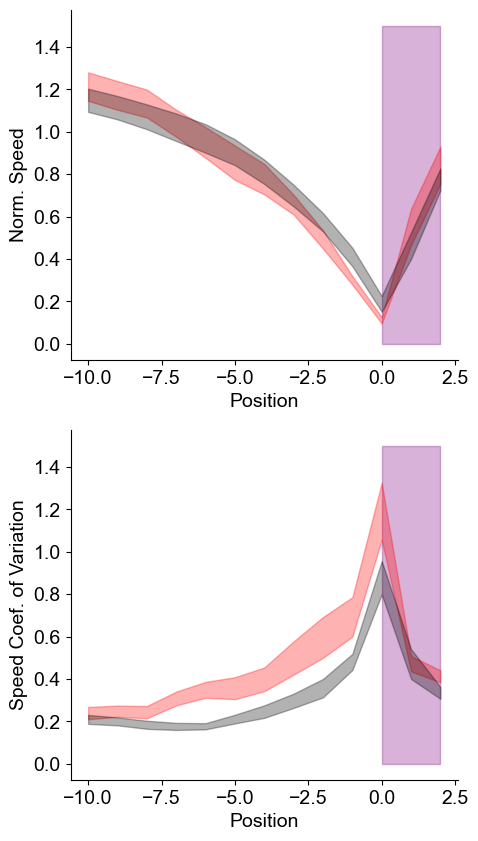

In [416]:
fig,ax = plt.subplots(2,1, figsize = [5, 10],sharey=True)
day = 5
x = np.arange(-10,3)



arr = np.array(ko_lr[day]['speed']['nov'])[:,:,np.newaxis]
# arr = np.concatenate((np.array(ko_lr[day]['speed']['fam'])[:,:,np.newaxis], np.array(ko_lr[day]['speed']['nov'])[:, :, np.newaxis]), axis=-1)
arr = arr.mean(axis=-1)
mu, sem = np.nanmean(arr,axis=0), sp.stats.sem(arr, axis=0, nan_policy='omit')

ax[0].fill_between(x, mu- sem, mu+sem,color='red', alpha = .3)

arr = np.array(ctrl_lr[day]['speed']['nov'])[:,:,np.newaxis]
# arr = np.concatenate((np.array(ctrl_lr[day]['speed']['fam'])[:,:,np.newaxis], np.array(ctrl_lr[day]['speed']['nov'])[:, :, np.newaxis]), axis=-1)
arr = arr.mean(axis=-1)
mu, sem = np.nanmean(arr,axis=0), sp.stats.sem(arr, axis=0, nan_policy='omit')

ax[0].fill_between(x, mu- sem, mu+sem,color='black', alpha = .3)
ax[0].fill_betweenx([0,1.5], 0, 2, zorder=-1, color='purple',alpha=.3)

ax[0].set_ylabel('Norm. Speed')
ax[0].set_xlabel('Position')
ax[0].spines['top'].set_visible(False)
ax[0].spines['right'].set_visible(False)

arr = np.array(ko_lr[day]['cov']['nov'])[:,:,np.newaxis]
# arr = np.concatenate((np.array(ko_lr[day]['cov']['fam'])[:,:,np.newaxis], np.array(ko_lr[day]['cov']['nov'])[:, :, np.newaxis]), axis=-1)
arr = arr.mean(axis=-1)
mu, sem = np.nanmean(arr,axis=0), sp.stats.sem(arr, axis=0, nan_policy='omit')

ax[1].fill_between(x, mu- sem, mu+sem,color='red', alpha = .3)

arr = np.array(ctrl_lr[day]['cov']['nov'])[:,:,np.newaxis]
# arr = np.concatenate((np.array(ctrl_lr[day]['cov']['fam'])[:,:,np.newaxis], np.array(ctrl_lr[day]['cov']['nov'])[:, :, np.newaxis]), axis=-1)
arr = arr.mean(axis=-1)
mu, sem = np.nanmean(arr,axis=0), sp.stats.sem(arr, axis=0, nan_policy='omit')

ax[1].fill_between(x, mu- sem, mu+sem,color='black', alpha = .3)

ax[1].fill_betweenx([0,1.5], 0, 2, zorder=-1, color='purple',alpha=.3)

ax[1].set_ylabel('Speed Coef. of Variation')
ax[1].set_xlabel('Position')
ax[1].spines['top'].set_visible(False)
ax[1].spines['right'].set_visible(False)

fig.savefig(os.path.join(fig_dir, 'day6_normspeed_COV_nov.pdf'))

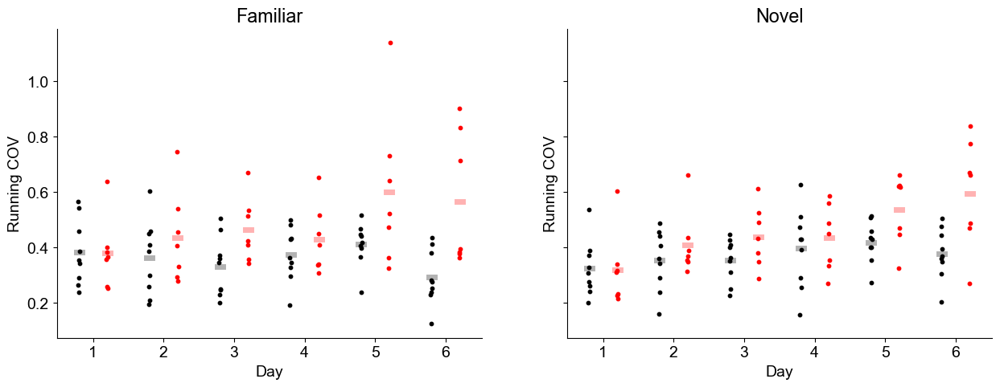

In [417]:
fig, ax = plt.subplots(1,2, figsize=[15,5], sharey=True)

lw = 5
s = 10
key = 'cov'
for day in range(6):
    
    mask = (df['ko']==False) & (df['day']==day) & (df['nov']==False)
    lr = df[key].loc[mask]._values
    ax[0].scatter(5*day -1 + np.linspace(-0.05, 0.05, num=lr.shape[0]), lr, color='black', s=s)
    ax[0].plot(5*day -1 + np.array([-0.2, .2]), lr.mean()*np.ones([2,]), color='black', linewidth=lw,alpha = .3)
    
    mask = (df['ko']==False) & (df['day']==day) & (df['nov']==True)
    lr = df[key].loc[mask]._values
    ax[1].scatter(5*day -1 + np.linspace(-0.05, 0.05, num=lr.shape[0]), lr, color='black', s=s, alpha = 1)
    ax[1].plot(5*day -1 + np.array([-0.2, .2]), lr.mean()*np.ones([2,]), color='black', linewidth=lw,alpha = .3)
    
    mask = (df['ko']==True) & (df['day']==day) & (df['nov']==False)
    lr = df[key].loc[mask]._values
    ax[0].scatter(5*day +1 + np.linspace(-0.05, 0.05, num=lr.shape[0]), lr, color='red', s=s)
    ax[0].plot(5*day + 1 + np.array([-0.2, .2]), lr.mean()*np.ones([2,]), color='red', linewidth=lw,alpha = .3)
    
    mask = (df['ko']==True) & (df['day']==day)& (df['nov']==True)
    lr = df[key].loc[mask]._values
    ax[1].scatter(5*day +1 + np.linspace(-0.05, 0.05, num=lr.shape[0]), lr, color='red', s=s, alpha=1)
    ax[1].plot(5*day + 1 + np.array([-0.2, .2]), lr.mean()*np.ones([2,]), color='red', linewidth=lw,alpha = .3)
    
ax[0].set_title('Familiar')
ax[1].set_title('Novel')
    
for a in range(2):

    ax[a].set_xticks(np.arange(0,6*5,5))
    ax[a].set_xticklabels([x for x in range(1,7)])

    ax[a].spines['top'].set_visible(False)
    ax[a].spines['right'].set_visible(False)

    ax[a].set_ylabel('Running COV')
    ax[a].set_xlabel('Day')

fig.savefig(os.path.join(fig_dir, 'famnov_speed_COV_summary.pdf'))

#### rank transformed anova 

In [446]:
df['cov_rank'] = df['cov'].rank()
df

,mouse,ko,day,nov,speed,LR,cov,cov_rank
0,4467975.1,True,0,True,0.588261,-1,0.310473,49.0
1,4467975.1,True,0,False,0.503384,1,0.358058,75.0
2,4467975.2,True,0,False,0.462253,-1,0.400183,103.0
3,4467975.2,True,0,True,0.414237,1,0.317098,51.0
4,4467975.3,True,0,True,0.672621,-1,0.226219,11.0
...,...,...,...,...,...,...,...,...
187,mCherry7,False,5,False,0.593954,1,0.433878,123.0
188,mCherry8,False,5,False,0.674706,-1,0.251906,24.0
189,mCherry8,False,5,True,0.648614,1,0.347068,66.0
190,mCherry9,False,5,True,0.359440,-1,0.367873,85.0


In [464]:
import statsmodels.formula.api as smf

model = smf.mixedlm('cov_rank ~ C(ko) + C(nov) + C(day)', df, groups=df['mouse'])

results = model.fit()
print(results.summary())



          Mixed Linear Model Regression Results
Model:             MixedLM  Dependent Variable:  cov_rank 
No. Observations:  192      Method:              REML     
No. Groups:        16       Scale:               2094.6279
Min. group size:   12       Log-Likelihood:      -989.7586
Max. group size:   12       Converged:           Yes      
Mean group size:   12.0                                   
----------------------------------------------------------
                Coef.  Std.Err.   z   P>|z|  [0.025 0.975]
----------------------------------------------------------
Intercept       56.536   12.538 4.509 0.000  31.963 81.109
C(ko)[T.True]   30.751   14.480 2.124 0.034   2.370 59.132
C(nov)[T.True]   2.021    6.606 0.306 0.760 -10.927 14.968
C(day)[T.1]     18.594   11.442 1.625 0.104  -3.832 41.019
C(day)[T.2]     21.125   11.442 1.846 0.065  -1.300 43.550
C(day)[T.3]     28.688   11.442 2.507 0.012   6.262 51.113
C(day)[T.4]     54.031   11.442 4.722 0.000  31.606 76.457
C(day)[T

                  Mixed Linear Model Regression Results
Model:                  MixedLM       Dependent Variable:       cov_rank 
No. Observations:       192           Method:                   REML     
No. Groups:             16            Scale:                    2101.2938
Min. group size:        12            Log-Likelihood:           -986.0192
Max. group size:        12            Converged:                Yes      
Mean group size:        12.0                                             
-------------------------------------------------------------------------
                              Coef.  Std.Err.   z    P>|z|  [0.025 0.975]
-------------------------------------------------------------------------
Intercept                     54.556   12.881  4.235 0.000  29.310 79.801
C(ko)[T.True]                 35.278   15.942  2.213 0.027   4.032 66.524
C(nov)[T.True]                 5.981    8.822  0.678 0.498 -11.309 23.272
C(day)[T.1]                   18.594   11.460  1.622 0.1

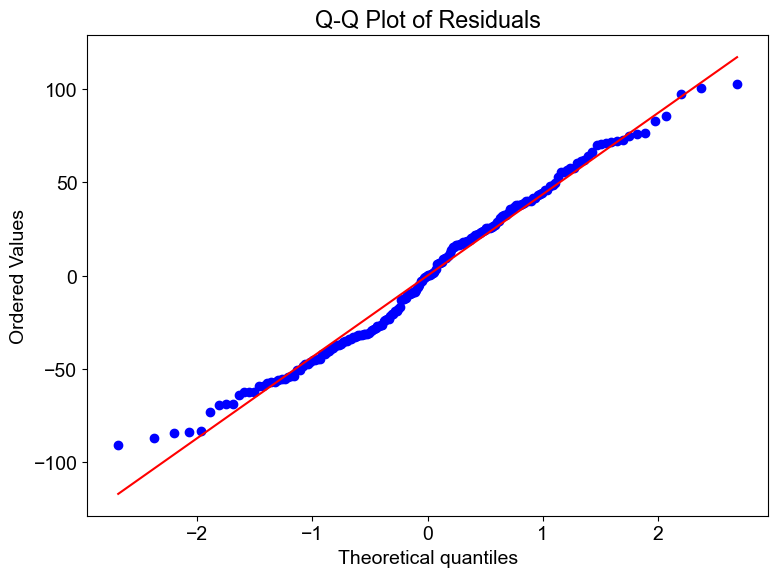

In [465]:
import statsmodels.api as sm
import scipy.stats as stats

model = smf.mixedlm('cov_rank ~ C(ko) * C(nov) + C(day)', df, groups=df['mouse'])
results = model.fit()
print(results.summary())

residuals = results.resid

fig, ax = plt.subplots(figsize=(8, 6))
stats.probplot(residuals, dist="norm", plot=ax)
ax.set_title('Q-Q Plot of Residuals')

plt.tight_layout()
plt.show()

In [437]:
# familiar
df_fam['cov_rank'] = df_fam['cov'].rank()
aov_fam = pg.mixed_anova(data=df_fam, within='day', between='ko', dv='cov_rank', subject='mouse')
print(aov_fam)

#nov
df_nov = df[df['nov'] == True].copy()
df_nov['cov_rank'] = df_nov['cov'].rank()
aov_nov = pg.mixed_anova(data=df_nov, within='day', between='ko', dv='cov_rank', subject='mouse')
print(aov_nov)

        Source           SS  DF1  DF2           MS         F     p-unc  \
0           ko  6704.931217    1   14  6704.931217  5.102946  0.040365   
1          day  4048.250000    5   70   809.650000  1.415021  0.229562   
2  Interaction  4518.977513    5   70   903.795503  1.579558  0.177176   

        np2       eps  
0  0.267129       NaN  
1  0.091795  0.643148  
2  0.101387       NaN  
        Source            SS  DF1  DF2           MS         F     p-unc  \
0           ko   4416.042328    1   14  4416.042328  2.832920  0.114508   
1          day  12252.125000    5   70  2450.425000  5.303883  0.000345   
2  Interaction   2887.800926    5   70   577.560185  1.250115  0.295339   

        np2       eps  
0  0.168296       NaN  
1  0.274757  0.632534  
2  0.081974       NaN  


#### permutation test

In [466]:

def run_cov_model(df_perm, all_mice, ctrl_mice_subset, stat_column):
    """
    Run mixed model on permuted genotype assignments
    
    Parameters:
    -----------
    df_perm : DataFrame
        Copy of your data
    all_mice : list
        All mice (ko_mice + ctrl_mice)
    ctrl_mice_subset : list
        Randomly selected subset to be labeled as 'ctrl'
    stat_column : str
        'cov' or 'cov_rank'
    
    Returns:
    --------
    float : coefficient for genotype effect
    """
    # Create genotype map: ctrl_mice_subset gets 'ctrl', rest get 'ko'
    genotype_map = {}
    for mouse in all_mice:
        if mouse in ctrl_mice_subset:
            genotype_map[mouse] = "ctrl"
        else:
            genotype_map[mouse] = "ko"
    
    # Apply the permuted genotype labels
    df_perm["ko_perm"] = df_perm["mouse"].map(genotype_map)
    df_perm["ko_perm"] = (df_perm["ko_perm"] == "ko")  # Convert to boolean if needed
    
    # Fit mixed model with permuted genotypes
    formula = f"{stat_column} ~ C(ko_perm) * C(nov) + C(day)"
    model = smf.mixedlm(formula, df_perm, groups=df_perm["mouse"])
    
    try:
        result = model.fit()
        if result.converged:
            return result.fe_params["C(ko_perm)[T.True]"]
        else:
            return np.nan
    except:
        return np.nan  # Skip failed fits


def run_cov_permutation_test(df, ko_mice, ctrl_mice, n_jobs=16):
    """
    Run permutation test for COV analysis
    
    Parameters:
    -----------
    df : DataFrame
        Your dataframe with cov_rank, mouse, ko, day, nov columns
    ko_mice : list
        List of KO mouse IDs
    ctrl_mice : list
        List of control mouse IDs
    n_jobs : int
        Number of parallel jobs
    
    Returns:
    --------
    dict : Results including true model and shuffle distribution
    """
    
    # Make sure df has the right format
    df = df.copy()
    all_mice = ko_mice + ctrl_mice
    
    result_dict = {}
    
    # Run for both raw and ranked COV
    for stat_column in ('cov', 'cov_rank'):
        
        print(f"\nRunning analysis for {stat_column}...")
        
        # Fit true model
        formula = f"{stat_column} ~ C(ko) * C(nov) + C(day)"
        model = smf.mixedlm(formula, df, groups=df["mouse"])
        model_result = model.fit()
        
        true_coef = model_result.fe_params["C(ko)[T.True]"]
        print(f"True genotype coefficient: {true_coef:.4f}")
        
        # Generate all possible genotype permutations
        # This creates all combinations of ctrl_mice assignments
        print(f"Running permutations ({len(list(itertools.combinations(all_mice, len(ctrl_mice))))} total)...")
        
        shuff_coefs = np.array(
            joblib.Parallel(n_jobs=n_jobs)(
                joblib.delayed(run_cov_model)(
                    df.copy(),
                    all_mice,
                    list(comb),  # This permuted subset becomes 'ctrl'
                    stat_column
                ) 
                for comb in itertools.combinations(all_mice, len(ctrl_mice))
            )
        )
        
        # Remove any NaN values from failed fits
        shuff_coefs = shuff_coefs[~np.isnan(shuff_coefs)]
        
        # Calculate p-value (two-tailed)
        p_value = np.mean(np.abs(shuff_coefs) >= np.abs(true_coef))
        
        print(f"Permutation p-value: {p_value:.4f}")
        print(f"Valid permutations: {len(shuff_coefs)}")
        
        result_dict[stat_column] = {
            'true_model': model_result,
            'true_coef': true_coef,
            'shuffle_coefs': shuff_coefs,
            'p_value': p_value,
            'model_summary': str(model_result.summary())
        }
    
    return result_dict


def plot_permutation_results(result_dict, save_path=None):
    """
    Plot histograms of permutation distributions
    """
    import matplotlib.pyplot as plt
    
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    
    for idx, stat_column in enumerate(['cov', 'cov_rank']):
        ax = axes[idx]
        
        shuff_coefs = result_dict[stat_column]['shuffle_coefs']
        true_coef = result_dict[stat_column]['true_coef']
        p_value = result_dict[stat_column]['p_value']
        
        # Histogram of shuffle distribution
        ax.hist(shuff_coefs, bins=50, alpha=0.7, color='gray', edgecolor='black')
        
        # Mark true coefficient
        ax.axvline(true_coef, color='red', linestyle='--', linewidth=2, 
                   label=f'True coef = {true_coef:.3f}')
        
        ax.set_xlabel('Genotype Coefficient')
        ax.set_ylabel('Frequency')
        ax.set_title(f'{stat_column}\nPermutation p = {p_value:.4f}')
        ax.legend()
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path)
    
    plt.show()


Running analysis for cov...
True genotype coefficient: 0.1204
Running permutations (11440 total)...


C:\Users\esay\.conda\envs\s2p_analysis\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


Permutation p-value: 0.0094
Valid permutations: 11437

Running analysis for cov_rank...
True genotype coefficient: 35.2778
Running permutations (11440 total)...
Permutation p-value: 0.0331
Valid permutations: 11437


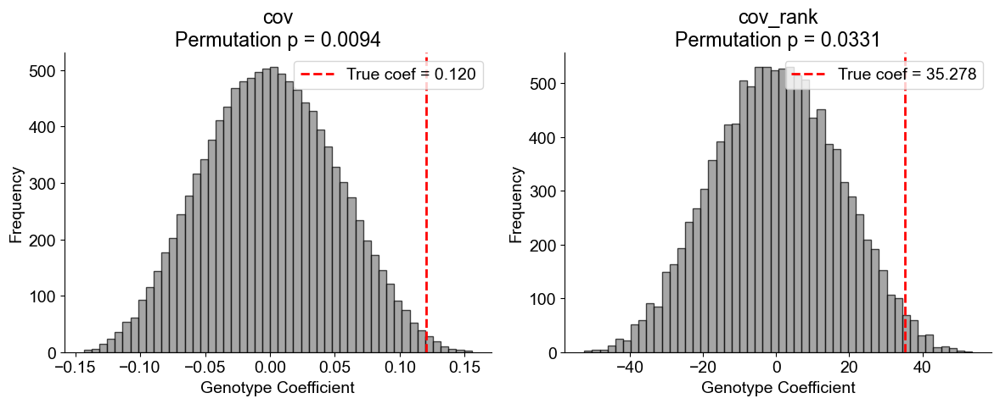


PERMUTATION TEST RESULTS

cov:
  True coefficient: 0.1204
  Permutation p-value: 0.0094

cov_rank:
  True coefficient: 35.2778
  Permutation p-value: 0.0331


In [467]:
result_dict = run_cov_permutation_test(
        df=df,  # Your dataframe
        ko_mice=ko_mice,
        ctrl_mice=ctrl_mice,
        n_jobs=16  # Adjust based on your CPU
    )
    
    # Plot results
plot_permutation_results(result_dict, save_path='cov_permutation_results.pdf')
    
    # # Save results
    # with open('cov_permutation_results.pkl', 'wb') as f:
    #     pickle.dump(result_dict, f)
    
# Print summary
print("\n" + "="*50)
print("PERMUTATION TEST RESULTS")
print("="*50)
for stat in ['cov', 'cov_rank']:
    print(f"\n{stat}:")
    print(f"  True coefficient: {result_dict[stat]['true_coef']:.4f}")
    print(f"  Permutation p-value: {result_dict[stat]['p_value']:.4f}")

### Lick accuracy 

In [4]:
def get_lick_metrics(sess):
    
    stx.behavior.trial_metrics.antic_consum_licks(sess)
    stx.behavior.trial_metrics.get_probes_and_omissions(sess)
    stx.behavior.trial_metrics.single_trial_lick_metrics(sess)

    return sess

In [153]:
def lick_metrics(sess):
    reward_mask = sess.vr_data['reward']._values > 0
    reward_start = np.argwhere(reward_mask).ravel() - 1
    # reward_end = (reward_start + int(2 * sess.scan_info['frame_rate'])).astype(np.int)
    reward_end = (reward_start + int(2 * 50)).astype(np.int64)
    
    consum_mask = np.zeros(reward_mask.shape) > 0
    for (start, end) in zip(reward_start, reward_end):
        consum_mask[start:end] = True
    
    antic_licks = np.copy(sess.vr_data['lick']._values)
    antic_licks[consum_mask] = 0
    
    nonconsum_speed = np.copy(sess.vr_data['dz']._values)
    nonconsum_speed[consum_mask] = np.nan
    
    sess.add_timeseries(antic_licks=antic_licks,
                        licks=sess.vr_data['lick']._values,
                        speed=sess.vr_data['dz']._values,
                        antic_speed=nonconsum_speed)
    sess.add_pos_binned_trial_matrix(('antic_licks', 'speed', 'antic_speed'), 't', mat_only=True)
    
    antic_lick_positions = np.zeros(sess.timeseries['licks'].shape) * np.nan
    antic_lick_mask = sess.timeseries['antic_licks'] > 0
    antic_lick_positions[antic_lick_mask] = sess.vr_data['t']._values[antic_lick_mask.ravel()]
    sess.add_timeseries(antic_lick_positions=antic_lick_positions)

    bin_lower_edges = sess.trial_matrices['bin_edges'][:-1]

    lr_early = np.nanmean(sess.trial_matrices['antic_licks'][:, (bin_lower_edges >= sess.rzone_early['t_antic']) & (
            bin_lower_edges < sess.rzone_early['tfront'] + 2)], axis=-1)
    lr_early /= np.nanmean(sess.trial_matrices['antic_licks'].ravel())
    lr_late = np.nanmean(sess.trial_matrices['antic_licks'][:, (bin_lower_edges >= sess.rzone_late['t_antic']) & (
            bin_lower_edges < sess.rzone_late['tfront'] + 2)], axis=-1)
    lr_late /= np.nanmean(sess.trial_matrices['antic_licks'].ravel())
    #     print(lr_early,lr_late)
    lr_d = (lr_early - lr_late) / (lr_early + lr_late + 1E-3)
    
    stem_speed = np.nanmean(sess.trial_matrices['antic_speed'][:,
                            sess.trial_matrices['bin_edges'][:-1] < sess.rzone_early['t_antic']].ravel())
    arm_speed = np.nanmean(
        sess.trial_matrices['antic_speed'][:, sess.trial_matrices['bin_edges'][:-1] > sess.rzone_early['t_antic']],
        axis=-1)
    arm_speed_norm = arm_speed / stem_speed
    
    accuracy = np.zeros([sess.trial_start_inds.shape[0], ])
    err = np.zeros([sess.trial_start_inds.shape[0], ])
    mean = np.zeros([sess.trial_start_inds.shape[0], ]) * np.nan
    var = np.zeros([sess.trial_start_inds.shape[0], ])
    
    for trial, (start, stop, lr) in enumerate(
            zip(sess.trial_start_inds, sess.teleport_inds, sess.trial_info['LR'])):



        pos = sess.vr_data['t'].iloc[start:stop]
        licks = sess.timeseries['antic_licks'][0, start:stop]
        lick_pos = sess.timeseries['antic_lick_positions'][0, start:stop]
        if lr == 1:
            rzone = (sess.rzone_late['t_antic'], sess.rzone_late['tfront'] + 2)
            tfront = sess.rzone_late['tfront']

        else:
            rzone = (sess.rzone_early['t_antic'], sess.rzone_early['tfront'] + 2)
            tfront = sess.rzone_late['tfront']

        rzone_mask = (pos >= rzone[0]) & (pos <= rzone[1])

        # Lick accuracy: licks in reward zone / total non-consummatory licks
        accuracy[trial] = licks[rzone_mask].sum() / (licks.sum() + 1E-3)

        # lick position variance
        if licks.sum() > 1:
            mean[trial] = np.nanmedian(lick_pos) / tfront
            var[trial] = np.nanstd(lick_pos)
            err[trial] = np.nanmean(np.abs((lick_pos - tfront) / tfront))

    sess.trial_info.update({'lickrate_rz_early': lr_early,
                            'lickrate_rz_late': lr_late,
                            'lickrate_dprime': lr_d,
                            'lick_acc': accuracy,
                            'lick_meanpos': mean,
                            'lick_varpos': var,
                            'lick_err': err,
                            'arm_speed': arm_speed,
                            'arm_speed_norm': arm_speed_norm
    
                            })
    return sess

In [154]:
def get_concat_sess(mouse, day, ko):
    if ko=='CTRL':
        d = ctrl_sessions[mouse][day]
    else:
        d = ko_sessions[mouse][day]
    sess_list = []
    vr_data = []
    for i, sess_info in enumerate(d):
        date, scene, sess_no, scan = sess_info['date'], sess_info['scene'], sess_info['session'], sess_info['scan']
        pkldir = os.path.join('C://Users/esay/data/Stx3/YMazeSessPkls/', mouse,  date, f'{scene}_{sess_no}.pkl')
        
        _sess = stx.session.YMazeSession.from_file(pkldir, verbose=False)
        _sess = get_lick_metrics(_sess)

        sess_list.append(_sess)
        print(sess_list)
        
        data = _sess.vr_data
        df = data.copy()

        vr_data.append(df)
    vr = pd.concat(vr_data, ignore_index = True)
    sess = stx.session.ConcatYMazeSession(sess_list, None, day_inds=[0 for i in range(len(d))], trial_info_keys = ['LR', 'block_number', 'lick_acc'],
                                          trial_mat_keys=('speed','antic_licks'),
                                          timeseries_keys=('licks', 'speed','antic_licks'),
                                          run_place_cells=False)
    sess.vr_data = vr
    print(len(sess.vr_data))
    
    return sess


{'date': '29_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 0}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '29_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': 1, 'ravel_ind': 0}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '29_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 8, 'novel_arm': -1, 'ravel_ind': 0}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '29_11_2020', 'scene': 'YMaze_LNovel', 'session': 2, 'scan': 18, 'novel_arm': 1, 'ravel_ind': 1}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '29_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': -1, 'ravel_ind': 0}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '14_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 0}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '14_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': -1, 'ravel_ind': 0}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '14_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 0}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '15_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 0}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


({'date': '28_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 0}, {'date': '28_09_2020', 'scene': 'YMaze_LNovel', 'session': 6, 'scan': 14, 'novel_arm': -1, 'ravel_ind': 1})


c:\users\esay\repos\twoputils\TwoPUtils\sess.py:100: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:232: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.1/28_09_2020/YMaze_LNovel/YMaze_LNovel_001_003.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:241: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.1/28_09_2020/YMaze_LNovel/YMaze_LNovel_001_003.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)
c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


c:\users\esay\repos\twoputils\TwoPUtils\sess.py:100: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:232: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.1/28_09_2020/YMaze_LNovel/YMaze_LNovel_006_014.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:241: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.1/28_09_2020/YMaze_LNovel/YMaze_LNovel_006_014.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)
c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


[<STX3KO_analyses.session.YMazeSession object at 0x0000022486A908E0>, <STX3KO_analyses.session.YMazeSession object at 0x000002248CB52110>]
34199
{'date': '28_09_2020', 'scene': 'YMaze_LNovel', 'session': 3, 'scan': 8, 'novel_arm': 1, 'ravel_ind': 0}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '28_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': -1, 'ravel_ind': 0}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '28_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 5, 'novel_arm': 1, 'ravel_ind': 0}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '28_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': -1, 'ravel_ind': 0}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '18_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 0}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '18_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': 1, 'ravel_ind': 0}
{'date': '30_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 7, 'novel_arm': -1, 'ravel_ind': 1}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '30_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': 1, 'ravel_ind': 1}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '30_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': -1, 'ravel_ind': 1}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


({'date': '30_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': 1, 'ravel_ind': 2}, {'date': '30_11_2020', 'scene': 'YMaze_LNovel', 'session': 3, 'scan': 9, 'novel_arm': 1, 'ravel_ind': 3})


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


[<STX3KO_analyses.session.YMazeSession object at 0x000002248CB52110>, <STX3KO_analyses.session.YMazeSession object at 0x000002248DA49C60>]
33190
{'date': '30_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 6, 'novel_arm': -1, 'ravel_ind': 1}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '15_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 1}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '15_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': -1, 'ravel_ind': 1}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '15_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 1}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '16_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 1}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '29_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 2}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '29_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 1}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '29_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': -1, 'ravel_ind': 1}
{'date': '29_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 1}
{'date': '29_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 1}
{'date': '19_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': -1, 'ravel_ind': 1}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '19_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': 1, 'ravel_ind': 1}
{'date': '01_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': -1, 'ravel_ind': 2}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '01_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': 1, 'ravel_ind': 2}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '01_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 5, 'novel_arm': -1, 'ravel_ind': 2}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '01_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': 1, 'ravel_ind': 4}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '01_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': -1, 'ravel_ind': 2}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '16_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': 1, 'ravel_ind': 2}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '16_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 2}
{'date': '16_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': 1, 'ravel_ind': 2}
{'date': '17_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': 1, 'ravel_ind': 2}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '30_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': -1, 'ravel_ind': 3}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '30_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': 1, 'ravel_ind': 2}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '30_09_2020', 'scene': 'YMaze_LNovel', 'session': 2, 'scan': 7, 'novel_arm': -1, 'ravel_ind': 2}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '30_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 2}
{'date': '30_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 5, 'novel_arm': -1, 'ravel_ind': 2}
{'date': '20_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 1, 'novel_arm': -1, 'ravel_ind': 2}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '20_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': 1, 'ravel_ind': 2}
{'date': '02_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 3}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


({'date': '02_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 6, 'novel_arm': 1, 'ravel_ind': 3}, {'date': '02_12_2020', 'scene': 'YMaze_LNovel', 'session': 2, 'scan': 12, 'novel_arm': 1, 'ravel_ind': 4})


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


[<STX3KO_analyses.session.YMazeSession object at 0x0000022492E32E60>, <STX3KO_analyses.session.YMazeSession object at 0x000002248751C4C0>]
27495
{'date': '02_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 6, 'novel_arm': -1, 'ravel_ind': 3}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '02_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': 1, 'ravel_ind': 5}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '02_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': -1, 'ravel_ind': 3}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '17_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': 1, 'ravel_ind': 3}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '17_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': -1, 'ravel_ind': 3}
{'date': '17_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 3}
{'date': '19_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 3}
{'date': '01_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': -1, 'ravel_ind': 4}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '01_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': 1, 'ravel_ind': 3}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '01_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 7, 'novel_arm': -1, 'ravel_ind': 3}
{'date': '01_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': 1, 'ravel_ind': 3}
{'date': '01_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 7, 'novel_arm': -1, 'ravel_ind': 3}
{'date': '21_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': -1, 'ravel_ind': 3}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '21_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': 1, 'ravel_ind': 3}
{'date': '03_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 8, 'novel_arm': -1, 'ravel_ind': 4}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '03_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 5}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '03_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 4}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '03_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 6}
{'date': '03_12_2020', 'scene': 'YMaze_LNovel', 'session': 2, 'scan': 4, 'novel_arm': -1, 'ravel_ind': 4}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '18_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 1, 'novel_arm': 1, 'ravel_ind': 4}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '18_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': -1, 'ravel_ind': 4}
{'date': '18_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': 1, 'ravel_ind': 4}
{'date': '20_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 4}
{'date': '02_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 5}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '02_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 9, 'novel_arm': 1, 'ravel_ind': 4}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '02_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 4}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '02_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': 1, 'ravel_ind': 4}
{'date': '02_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 4}
{'date': '22_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 4}
{'date': '23_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': 1, 'ravel_ind': 4}
{'date': '04_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': -1, 'ravel_ind': 5}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '04_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 6}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '04_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': -1, 'ravel_ind': 5}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '04_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 7}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '05_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': -1, 'ravel_ind': 5}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '19_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 5, 'novel_arm': 1, 'ravel_ind': 5}
{'date': '19_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': -1, 'ravel_ind': 5}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '20_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': 1, 'ravel_ind': 5}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '21_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': 1, 'ravel_ind': 5}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '03_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 6}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '03_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 8, 'novel_arm': 1, 'ravel_ind': 5}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '03_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 6, 'novel_arm': -1, 'ravel_ind': 5}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '03_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': 1, 'ravel_ind': 5}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '03_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 5, 'novel_arm': -1, 'ravel_ind': 5}
{'date': '23_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': -1, 'ravel_ind': 5}
{'date': '23_10_2021', 'scene': 'YMaze_LNovel', 'session': 2, 'scan': 2, 'novel_arm': 1, 'ravel_ind': 5}


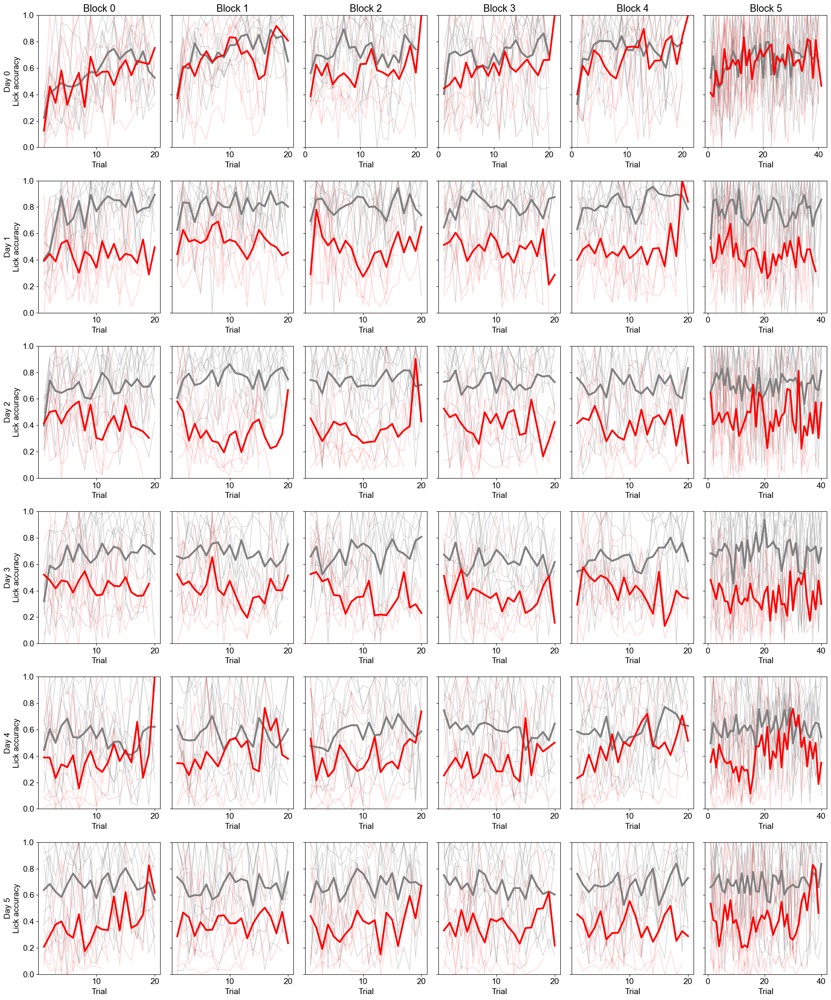

In [155]:

days = range(6)  
blocks = [0,1, 2, 3, 4, 5]

fig, axes = plt.subplots(len(days), len(blocks), figsize=(20, 4*len(days)), sharey=True)

for i, day in enumerate(days):
    all_data = {'ko': [], 'ctrl': []}

    for group, mice in zip(['CTRL','KO'], [ctrl_mice, ko_mice]):
        for mouse in mice:
            
            sess = u.load_vr_day(mouse, day)

            if isinstance(sess, stx.session.ConcatYMazeSession):
                sess = get_concat_sess(mouse, day, group)
            else:
                sess = lick_metrics(sess)
            
    
            for t in blocks:
                block_mask = sess.trial_info['block_number'] == t
                _lick_acc = np.asarray(sess.trial_info['lick_acc'])[block_mask]
    
                if mouse in ko_mice:
                    all_data['ko'].append((t, _lick_acc))
                elif mouse in ctrl_mice:
                    all_data['ctrl'].append((t, _lick_acc))
    
        for j, t in enumerate(blocks):
            ax = axes[i, j] if len(days) > 1 else axes[j]
    
            for block, arr in all_data['ctrl']:
                if block == t:
                    ax.plot(np.arange(1, len(arr)+1), arr, color='grey', alpha=0.2, lw=1)
            for block, arr in all_data['ko']:
                if block == t:
                    ax.plot(np.arange(1, len(arr)+1), arr, color='red', alpha=0.2, lw=1)
    
            # group mean
            max_trials = 0
            for group in ['ctrl', 'ko']:
                group_data = [arr for block, arr in all_data[group] if block == t]
                if group_data:
                    max_trials = max(max_trials, max(len(arr) for arr in group_data))
    
            for group, col in zip(['ctrl', 'ko'], ['grey', 'red']):
                group_data = [arr for block, arr in all_data[group] if block == t]
                if not group_data:
                    continue
                mean_vals = []
                for trial_idx in range(max_trials):
                    trial_vals = [arr[trial_idx] for arr in group_data if trial_idx < len(arr)]
                    if trial_vals:
                        mean_vals.append(np.mean(trial_vals))
                    else:
                        mean_vals.append(np.nan)
                ax.plot(np.arange(1, max_trials+1), mean_vals, color=col, lw=3, label=f'{group.upper()} mean')
    
            # cosmetics
            if i == 0:
                ax.set_title(f"Block {t}")
            if j == 0:
                ax.set_ylabel(f"Day {day}\nLick accuracy")
            ax.set_xlabel("Trial")
            ax.set_ylim([0, 1])   

plt.tight_layout()
plt.show()


In [177]:

# Only the first 10 trials per block 
records = []

days = range(6)
blocks = [0,1,2,3,4,5]
left_right = [-1,1]

for group, mice in zip(['CTRL','KO'], [ctrl_mice, ko_mice]):
    for mouse in mice:
        for day in days:
            sess = u.load_vr_day(mouse, day)

            if isinstance(sess, stx.session.ConcatYMazeSession):
                sess = get_concat_sess(mouse, day, group)
            else:
                sess = lick_metrics(sess)
            
            # for t in blocks:
            for LR in left_right:
                # block_mask = sess.trial_info['block_number'] == t
                if LR==sess.novel_arm:
                    LR_mask = sess.trial_info['LR'] == LR 
                    lick_acc = np.asarray(sess.trial_info['lick_acc'])[LR_mask]
                else:
                    continue
                # lick_acc = np.asarray(sess.trial_info['lick_acc'])[block_mask]
                
                # Take only the first 5 trials
                lick_acc = lick_acc[:5]
                
                records.append({
                    'mouse': mouse,
                    'group': group,
                    'day': day,
                    'block': t,
                    'lick_acc': lick_acc,
                    'lick_acc_mean': np.mean(lick_acc)
                })

# Convert to DataFrame
all_data_df = pd.DataFrame(records)



{'date': '29_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 0}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '30_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 7, 'novel_arm': -1, 'ravel_ind': 1}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '01_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': -1, 'ravel_ind': 2}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '02_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 3}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '03_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 8, 'novel_arm': -1, 'ravel_ind': 4}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '04_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': -1, 'ravel_ind': 5}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '29_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': 1, 'ravel_ind': 0}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '30_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': 1, 'ravel_ind': 1}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '01_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': 1, 'ravel_ind': 2}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


({'date': '02_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 6, 'novel_arm': 1, 'ravel_ind': 3}, {'date': '02_12_2020', 'scene': 'YMaze_LNovel', 'session': 2, 'scan': 12, 'novel_arm': 1, 'ravel_ind': 4})


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


[<STX3KO_analyses.session.YMazeSession object at 0x00000224957C7460>, <STX3KO_analyses.session.YMazeSession object at 0x0000022486AD7610>]
27495
{'date': '03_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 5}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '04_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 6}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '29_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 8, 'novel_arm': -1, 'ravel_ind': 0}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '30_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': -1, 'ravel_ind': 1}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '01_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 5, 'novel_arm': -1, 'ravel_ind': 2}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '02_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 6, 'novel_arm': -1, 'ravel_ind': 3}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '03_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 4}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '04_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': -1, 'ravel_ind': 5}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '29_11_2020', 'scene': 'YMaze_LNovel', 'session': 2, 'scan': 18, 'novel_arm': 1, 'ravel_ind': 1}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


({'date': '30_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': 1, 'ravel_ind': 2}, {'date': '30_11_2020', 'scene': 'YMaze_LNovel', 'session': 3, 'scan': 9, 'novel_arm': 1, 'ravel_ind': 3})


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


[<STX3KO_analyses.session.YMazeSession object at 0x0000022495379930>, <STX3KO_analyses.session.YMazeSession object at 0x0000022496B05B10>]
33190
{'date': '01_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': 1, 'ravel_ind': 4}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '02_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': 1, 'ravel_ind': 5}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '03_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 6}
{'date': '04_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 7}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '29_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': -1, 'ravel_ind': 0}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '30_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 6, 'novel_arm': -1, 'ravel_ind': 1}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '01_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': -1, 'ravel_ind': 2}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '02_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': -1, 'ravel_ind': 3}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '03_12_2020', 'scene': 'YMaze_LNovel', 'session': 2, 'scan': 4, 'novel_arm': -1, 'ravel_ind': 4}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '05_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': -1, 'ravel_ind': 5}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '14_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 0}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '15_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 1}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '16_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': 1, 'ravel_ind': 2}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '17_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': 1, 'ravel_ind': 3}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '18_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 1, 'novel_arm': 1, 'ravel_ind': 4}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '19_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 5, 'novel_arm': 1, 'ravel_ind': 5}
{'date': '14_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': -1, 'ravel_ind': 0}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '15_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': -1, 'ravel_ind': 1}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '16_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 2}
{'date': '17_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': -1, 'ravel_ind': 3}
{'date': '18_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': -1, 'ravel_ind': 4}
{'date': '19_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': -1, 'ravel_ind': 5}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '14_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 0}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '15_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 1}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '16_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': 1, 'ravel_ind': 2}
{'date': '17_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 3}
{'date': '18_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': 1, 'ravel_ind': 4}
{'date': '20_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': 1, 'ravel_ind': 5}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '15_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 0}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '16_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 1}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '17_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': 1, 'ravel_ind': 2}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '19_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 3}
{'date': '20_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 4}
{'date': '21_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': 1, 'ravel_ind': 5}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


({'date': '28_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 0}, {'date': '28_09_2020', 'scene': 'YMaze_LNovel', 'session': 6, 'scan': 14, 'novel_arm': -1, 'ravel_ind': 1})


c:\users\esay\repos\twoputils\TwoPUtils\sess.py:100: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:232: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.1/28_09_2020/YMaze_LNovel/YMaze_LNovel_001_003.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:241: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.1/28_09_2020/YMaze_LNovel/YMaze_LNovel_001_003.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)
c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


c:\users\esay\repos\twoputils\TwoPUtils\sess.py:100: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:232: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.1/28_09_2020/YMaze_LNovel/YMaze_LNovel_006_014.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:241: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.1/28_09_2020/YMaze_LNovel/YMaze_LNovel_006_014.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)
c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


[<STX3KO_analyses.session.YMazeSession object at 0x000002248E394850>, <STX3KO_analyses.session.YMazeSession object at 0x00000224887A1840>]
34199
{'date': '29_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 2}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '30_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': -1, 'ravel_ind': 3}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '01_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': -1, 'ravel_ind': 4}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '02_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 5}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '03_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 6}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '28_09_2020', 'scene': 'YMaze_LNovel', 'session': 3, 'scan': 8, 'novel_arm': 1, 'ravel_ind': 0}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '29_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 1}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '30_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': 1, 'ravel_ind': 2}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '01_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': 1, 'ravel_ind': 3}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '02_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 9, 'novel_arm': 1, 'ravel_ind': 4}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '03_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 8, 'novel_arm': 1, 'ravel_ind': 5}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '28_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': -1, 'ravel_ind': 0}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '29_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': -1, 'ravel_ind': 1}
{'date': '30_09_2020', 'scene': 'YMaze_LNovel', 'session': 2, 'scan': 7, 'novel_arm': -1, 'ravel_ind': 2}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '01_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 7, 'novel_arm': -1, 'ravel_ind': 3}
{'date': '02_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 4}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '03_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 6, 'novel_arm': -1, 'ravel_ind': 5}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '28_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 5, 'novel_arm': 1, 'ravel_ind': 0}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '29_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 1}
{'date': '30_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 2}
{'date': '01_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': 1, 'ravel_ind': 3}
{'date': '02_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': 1, 'ravel_ind': 4}
{'date': '03_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': 1, 'ravel_ind': 5}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '28_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': -1, 'ravel_ind': 0}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '29_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 1}
{'date': '30_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 5, 'novel_arm': -1, 'ravel_ind': 2}
{'date': '01_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 7, 'novel_arm': -1, 'ravel_ind': 3}
{'date': '02_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 4}
{'date': '03_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 5, 'novel_arm': -1, 'ravel_ind': 5}
{'date': '18_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 0}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '19_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': -1, 'ravel_ind': 1}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '20_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 1, 'novel_arm': -1, 'ravel_ind': 2}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '21_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': -1, 'ravel_ind': 3}


c:\users\esay\repos\twoputils\TwoPUtils\spatial_analyses.py:74: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


{'date': '22_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 4}
{'date': '23_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': -1, 'ravel_ind': 5}
{'date': '18_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': 1, 'ravel_ind': 0}
{'date': '19_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': 1, 'ravel_ind': 1}
{'date': '20_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': 1, 'ravel_ind': 2}
{'date': '21_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': 1, 'ravel_ind': 3}
{'date': '23_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': 1, 'ravel_ind': 4}
{'date': '23_10_2021', 'scene': 'YMaze_LNovel', 'session': 2, 'scan': 2, 'novel_arm': 1, 'ravel_ind': 5}


In [178]:
all_data_df

,mouse,group,day,block,lick_acc,lick_acc_mean
0,4467331.1,CTRL,0,5,"[0.4998750312421894, 0.30768639064633374, 0.19...",0.543344
1,4467331.1,CTRL,1,5,"[0.9998750156230471, 0.9998333611064822, 0.999...",0.999893
2,4467331.1,CTRL,2,5,"[0.7499531279295043, 0.9031966710751266, 0.741...",0.849276
3,4467331.1,CTRL,3,5,"[0.9999333377774815, 0.8461213030268067, 0.666...",0.800163
4,4467331.1,CTRL,4,5,"[0.5666477784073864, 0.5428416330961973, 0.444...",0.438916
...,...,...,...,...,...,...
91,Cre9,KO,1,5,"[0.3265272803338741, 0.7884463760312302, 0.642...",0.580681
92,Cre9,KO,2,5,"[0.31883595889914634, 0.45544103523727486, 0.1...",0.403872
93,Cre9,KO,3,5,"[0.4134575629080489, 0.32846475573170997, 0.23...",0.276156
94,Cre9,KO,4,5,"[0.08011845662179044, 0.14230714497251934, 0.0...",0.081040


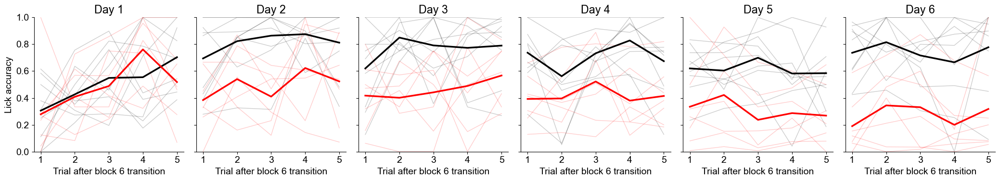

In [179]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# --- Prepare data ---
expanded = (
    all_data_df
    .explode('lick_acc')
    .reset_index(drop=True)
)

# Assign trial index within each block
expanded['trial_in_block'] = expanded.groupby(['mouse', 'day', 'block']).cumcount() + 1

# Filter for only the trials following block 6 transition
day_subset = expanded[expanded['block'] == 5]  # if block 6 is what you mean


# --- Plot setup ---
days = sorted(day_subset['day'].unique())
n_days = len(days)
fig, axes = plt.subplots(1, n_days, figsize=(3.5*n_days, 4), sharey=True)

# Make sure axes is iterable even if only one day
if n_days == 1:
    axes = [axes]

# --- Plot each day ---
for ax, day in zip(axes, days):
    df_day = day_subset[day_subset['day'] == day]

    # Group-average for each mouse across blocks (if multiple)
    mouse_avg = (
        df_day
        .groupby(['group', 'mouse', 'trial_in_block'])
        ['lick_acc']
        .mean()
        .reset_index()
    )

    # Plot individual mice
    for group, color in zip(['CTRL', 'KO'], ['black', 'red']):
        df_group = mouse_avg[mouse_avg['group'] == group]
        for mouse in df_group['mouse'].unique():
            df_mouse = df_group[df_group['mouse'] == mouse]
            ax.plot(df_mouse['trial_in_block'], df_mouse['lick_acc'],
                    color=color, alpha=0.2, linewidth=1)

    # Optionally overlay group mean line
    for group, color in zip(['CTRL', 'KO'], ['black', 'red']):
        mean_df = (
            mouse_avg[mouse_avg['group'] == group]
            .groupby('trial_in_block')['lick_acc']
            .mean()
            .reset_index()
        )
        ax.plot(mean_df['trial_in_block'], mean_df['lick_acc'],
                color=color, linewidth=2.5, label=group)

    ax.set_title(f'Day {day+1}')
    ax.set_xlabel('Trial after block 6 transition')
    ax.set_ylim(0, 1)

axes[0].set_ylabel('Lick accuracy')
# axes[-1].legend(frameon=False, loc='lower right')
sns.despine()
plt.tight_layout()
plt.show()


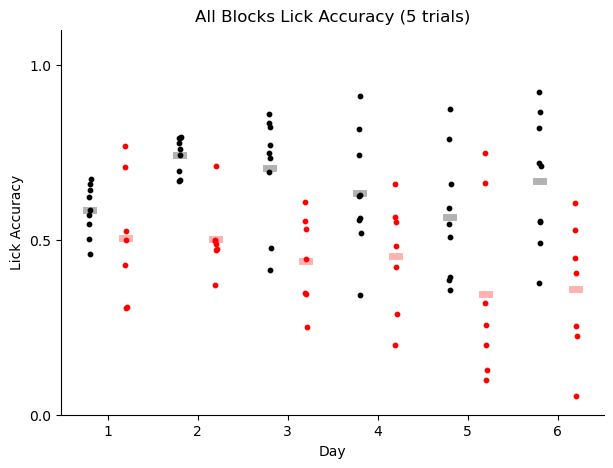

In [248]:
fig, ax = plt.subplots(1,1, figsize=[7,5])

lw = 5  
s = 10  # scatter size

days = sorted(all_data_df['day'].unique())

for group, color, offset in zip(['CTRL','KO'], ['black','red'], [-1, 1]):
    
    group_df = all_data_df[all_data_df['group'] == group]
    
    # Average per mouse per day across blocks
    mouse_day_means = group_df.groupby(['mouse','day'])['lick_acc_mean'].mean().reset_index()
    
    for day in days:
        day_data = mouse_day_means[mouse_day_means['day'] == day]
        vals = day_data['lick_acc_mean'].values
        
        # Scatter individual mice with horizontal jitter
        x_vals = 5*day + offset + np.linspace(-0.05, 0.05, num=vals.shape[0])
        ax.scatter(x_vals, vals, color=color, s=s)
        
        # Mean ± SEM across mice
        if len(vals) > 0:
            mean_val = np.mean(vals)
            ax.plot(5*day + offset + np.array([-0.2,0.2]), [mean_val, mean_val], color=color, linewidth=lw, alpha=0.3)


ax.set_xticks(np.arange(0,30,5))
ax.set_ylim(0,1.1)
ax.set_yticks([0,0.5,1])
ax.set_xticklabels([str(d+1) for d in days])
ax.set_xlabel('Day')
ax.set_ylabel('Lick Accuracy')
ax.set_title('All Blocks Lick Accuracy (5 trials)')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.show()
# fig.savefig(os.path.join(fig_dir, 'NOV_lick_acc.pdf'))


In [249]:
# stats test each bin
mouse_day_means = all_data_df.groupby(['mouse','day','group'])['lick_acc_mean'].mean().reset_index()

days = sorted(mouse_day_means['day'].unique())
raw_p = []
day_labels = []

# two sided T test
for day in days:
    day_df = mouse_day_means[mouse_day_means['day'] == day]
    ctrl_vals = day_df[day_df['group'] == 'CTRL']['lick_acc_mean'].values
    ko_vals   = day_df[day_df['group'] == 'KO']['lick_acc_mean'].values

    _, p = ttest_ind(ctrl_vals, ko_vals, nan_policy='omit')
    raw_p.append(p)
    day_labels.append(day)

# FDR correction for mult comparisons
reject, p_fdr = fdrcorrection(raw_p, alpha=0.05)

# summary 
print("\n=== Lick Accuracy Stats: CTRL vs KO, per day ===")
for i, day in enumerate(day_labels):
    print(f"Day {day+1}: raw p = {raw_p[i]:.4f}, FDR p = {p_fdr[i]:.4f}, significant = {reject[i]}")



=== Lick Accuracy Stats: CTRL vs KO, per day ===
Day 1: raw p = 0.2525, FDR p = 0.2525, significant = False
Day 2: raw p = 0.0000, FDR p = 0.0002, significant = True
Day 3: raw p = 0.0030, FDR p = 0.0089, significant = True
Day 4: raw p = 0.0491, FDR p = 0.0736, significant = False
Day 5: raw p = 0.0625, FDR p = 0.0750, significant = False
Day 6: raw p = 0.0059, FDR p = 0.0118, significant = True


In [250]:
import statsmodels.formula.api as smf
model = smf.mixedlm("lick_acc_mean ~ group + day", data=mouse_day_means, groups=mouse_day_means["mouse"])
result = model.fit()

print(result.summary())

           Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: lick_acc_mean
No. Observations: 96      Method:             REML         
No. Groups:       16      Scale:              0.0166       
Min. group size:  6       Log-Likelihood:     40.7427      
Max. group size:  6       Converged:          Yes          
Mean group size:  6.0                                      
------------------------------------------------------------
             Coef.   Std.Err.    z     P>|z|  [0.025  0.975]
------------------------------------------------------------
Intercept     0.695     0.043  15.994  0.000   0.609   0.780
group[T.KO]  -0.216     0.059  -3.670  0.000  -0.331  -0.101
day          -0.018     0.008  -2.320  0.020  -0.033  -0.003
Group Var     0.011     0.043                               



In [880]:
fig.savefig(os.path.join(figdir, 'lick_accuracy_allblocks_alldays.pdf'))

### Gross consummatory licks

In [378]:
# concat sess (4467331.2, 3) (4467332.2, 1) (mouse = '4467975.1', 0)
def get_concat_vr(mouse, day, ko):
    if ko=='CTRL':
        d = ctrl_sessions[mouse][day]
    else:
        d = ko_sessions[mouse][day]
    vr_data = []
    for i, sess_info in enumerate(d):
        date, scene, session, scan = sess_info['date'], sess_info['scene'], sess_info['session'], sess_info['scan']
        pkldir = os.path.join('C://Users/esay/data/Stx3/YMazeSessPkls/', mouse,  date, f'{scene}_{session}.pkl')
        sess = stx.session.YMazeSession.from_file(pkldir, verbose=False)
        
        data = sess.vr_data
        df = data.copy()

        vr_data.append(df)
    vr = pd.concat(vr_data, ignore_index = True)
    print(len(vr))
    frame_rate = sess.scan_info['frame_rate']
    
    return vr, frame_rate

def gross_consume(vr_data,framerate):
    window = (3*framerate)
    consume_licks = []

    vr_data['lick_corr'], _ = correct_lick_sensor_error(vr_data['lick'])
    rewards = vr_data['reward']

    reward_frames = vr_data.index[rewards==1]

    for r in reward_frames:
        end = min(r + window, len(vr_data))
        # print (r, end)
        lick_count = vr_data.loc[r:end, 'lick_corr'].sum()
        consume_licks.append(lick_count)
    return np.array(consume_licks)

def correct_lick_sensor_error(licks_, min_run = 10, thr=.2):

    licks = np.array(licks_, dtype=float)
    licks_clean = licks.copy()
    bad_segments = []

    high = licks > thr
    i = 0
    while i < len(high):
        if high[i]:
            # find run length
            start = i
            while i < len(high) and high[i]:
                i += 1
            end = i
            run_len = end - start
            if run_len >= min_run:
                licks_clean[start:end] = np.nan
                bad_segments.append((start, end))
        else:
            i += 1
    # print(bad_segments)

    return licks_clean, bad_segments

In [379]:
results = []

for group, mice in zip(['CTRL','KO'], [ctrl_mice, ko_mice]):
    for mouse in mice:
        for day in range(6):  
            sess = u.load_single_day(mouse, day)
            if isinstance(sess, stx.session.ConcatYMazeSession):
                # continue
                print('concat')
                vr_data, fr = get_concat_vr(mouse, day, ko = group)
                concat = True
            else:
                vr_data = sess.vr_data
                fr = sess.scan_info['frame_rate']

            gc = gross_consume(vr_data, fr)
                        
            results.append({
                'mouse': mouse,
                'group': group,
                'day': day,
                'gross_consume': gc
            })

df_consum = pd.DataFrame(results)


{'date': '29_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 0}
{'date': '30_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 7, 'novel_arm': -1, 'ravel_ind': 1}
{'date': '01_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': -1, 'ravel_ind': 2}
{'date': '02_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 3}
{'date': '03_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 8, 'novel_arm': -1, 'ravel_ind': 4}
{'date': '04_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': -1, 'ravel_ind': 5}
{'date': '29_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': 1, 'ravel_ind': 0}
{'date': '30_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': 1, 'ravel_ind': 1}
{'date': '01_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': 1, 'ravel_ind': 2}
({'date': '02_12_2020', 'scene': 'YMaze_LNovel', 

c:\users\esay\repos\twoputils\TwoPUtils\sess.py:100: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:232: UserWarning: Could not find sbxmat file at /media/mplitt/Backup Plus3/2P_Data/4467333.1/05_12_2020/YMaze_LNovel/YMaze_LNovel_001_002.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:241: UserWarning: Could not find sbx file at /media/mplitt/Backup Plus3/2P_Data/4467333.1/05_12_2020/YMaze_LNovel/YMaze_LNovel_001_002.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


{'date': '14_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 0}
{'date': '15_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 1}
{'date': '16_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': 1, 'ravel_ind': 2}
{'date': '17_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': 1, 'ravel_ind': 3}
{'date': '18_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 1, 'novel_arm': 1, 'ravel_ind': 4}
{'date': '19_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 5, 'novel_arm': 1, 'ravel_ind': 5}
{'date': '14_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': -1, 'ravel_ind': 0}
{'date': '15_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': -1, 'ravel_ind': 1}
{'date': '16_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 2}
{'date': '17_10_2021', 'scene': 'YMaze_LNovel', 'ses

c:\users\esay\repos\twoputils\TwoPUtils\sess.py:100: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:232: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.1/28_09_2020/YMaze_LNovel/YMaze_LNovel_001_003.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:241: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.1/28_09_2020/YMaze_LNovel/YMaze_LNovel_001_003.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


28_09_2020 YMaze_LNovel


c:\users\esay\repos\twoputils\TwoPUtils\sess.py:100: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:232: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.1/28_09_2020/YMaze_LNovel/YMaze_LNovel_006_014.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:241: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.1/28_09_2020/YMaze_LNovel/YMaze_LNovel_006_014.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


28_09_2020 YMaze_LNovel
concat


c:\users\esay\repos\twoputils\TwoPUtils\sess.py:100: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:232: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.1/28_09_2020/YMaze_LNovel/YMaze_LNovel_001_003.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:241: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.1/28_09_2020/YMaze_LNovel/YMaze_LNovel_001_003.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:100: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
c:\users\esay\repos\twoputils\TwoPUtils\sess.p

34199
{'date': '29_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 2}


c:\users\esay\repos\twoputils\TwoPUtils\sess.py:100: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:232: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.1/29_09_2020/YMaze_LNovel/YMaze_LNovel_001_003.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:241: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.1/29_09_2020/YMaze_LNovel/YMaze_LNovel_001_003.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


{'date': '30_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': -1, 'ravel_ind': 3}


c:\users\esay\repos\twoputils\TwoPUtils\sess.py:100: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:232: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.1/30_09_2020/YMaze_LNovel/YMaze_LNovel_001_004.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:241: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.1/30_09_2020/YMaze_LNovel/YMaze_LNovel_001_004.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


{'date': '01_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': -1, 'ravel_ind': 4}


c:\users\esay\repos\twoputils\TwoPUtils\sess.py:100: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:232: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.1/01_10_2020/YMaze_LNovel/YMaze_LNovel_001_002.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:241: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.1/01_10_2020/YMaze_LNovel/YMaze_LNovel_001_002.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


{'date': '02_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 5}


c:\users\esay\repos\twoputils\TwoPUtils\sess.py:100: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:232: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.1/02_10_2020/YMaze_LNovel/YMaze_LNovel_001_003.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:241: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.1/02_10_2020/YMaze_LNovel/YMaze_LNovel_001_003.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


{'date': '03_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 6}


c:\users\esay\repos\twoputils\TwoPUtils\sess.py:100: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:232: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.1/03_10_2020/YMaze_LNovel/YMaze_LNovel_001_003.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:241: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.1/03_10_2020/YMaze_LNovel/YMaze_LNovel_001_003.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


{'date': '28_09_2020', 'scene': 'YMaze_LNovel', 'session': 3, 'scan': 8, 'novel_arm': 1, 'ravel_ind': 0}


c:\users\esay\repos\twoputils\TwoPUtils\sess.py:100: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:232: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.2/28_09_2020/YMaze_LNovel/YMaze_LNovel_003_008.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:241: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.2/28_09_2020/YMaze_LNovel/YMaze_LNovel_003_008.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


{'date': '29_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 1}


c:\users\esay\repos\twoputils\TwoPUtils\sess.py:100: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:232: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.2/29_09_2020/YMaze_LNovel/YMaze_LNovel_001_003.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:241: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.2/29_09_2020/YMaze_LNovel/YMaze_LNovel_001_003.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


{'date': '30_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': 1, 'ravel_ind': 2}


c:\users\esay\repos\twoputils\TwoPUtils\sess.py:100: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:232: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.2/30_09_2020/YMaze_LNovel/YMaze_LNovel_001_004.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:241: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.2/30_09_2020/YMaze_LNovel/YMaze_LNovel_001_004.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


{'date': '01_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': 1, 'ravel_ind': 3}


c:\users\esay\repos\twoputils\TwoPUtils\sess.py:100: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:232: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.2/01_10_2020/YMaze_LNovel/YMaze_LNovel_001_004.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:241: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.2/01_10_2020/YMaze_LNovel/YMaze_LNovel_001_004.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


{'date': '02_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 9, 'novel_arm': 1, 'ravel_ind': 4}


c:\users\esay\repos\twoputils\TwoPUtils\sess.py:100: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:232: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.2/02_10_2020/YMaze_LNovel/YMaze_LNovel_001_009.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:241: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.2/02_10_2020/YMaze_LNovel/YMaze_LNovel_001_009.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


{'date': '03_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 8, 'novel_arm': 1, 'ravel_ind': 5}


c:\users\esay\repos\twoputils\TwoPUtils\sess.py:100: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:232: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.2/03_10_2020/YMaze_LNovel/YMaze_LNovel_001_008.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:241: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.2/03_10_2020/YMaze_LNovel/YMaze_LNovel_001_008.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


{'date': '28_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': -1, 'ravel_ind': 0}


c:\users\esay\repos\twoputils\TwoPUtils\sess.py:100: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:232: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.3/28_09_2020/YMaze_LNovel/YMaze_LNovel_001_004.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:241: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.3/28_09_2020/YMaze_LNovel/YMaze_LNovel_001_004.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


{'date': '29_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': -1, 'ravel_ind': 1}


c:\users\esay\repos\twoputils\TwoPUtils\sess.py:100: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:232: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.3/29_09_2020/YMaze_LNovel/YMaze_LNovel_001_004.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:241: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.3/29_09_2020/YMaze_LNovel/YMaze_LNovel_001_004.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


{'date': '30_09_2020', 'scene': 'YMaze_LNovel', 'session': 2, 'scan': 7, 'novel_arm': -1, 'ravel_ind': 2}


c:\users\esay\repos\twoputils\TwoPUtils\sess.py:100: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:232: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.3/30_09_2020/YMaze_LNovel/YMaze_LNovel_002_007.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:241: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.3/30_09_2020/YMaze_LNovel/YMaze_LNovel_002_007.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


{'date': '01_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 7, 'novel_arm': -1, 'ravel_ind': 3}


c:\users\esay\repos\twoputils\TwoPUtils\sess.py:100: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:232: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.3/01_10_2020/YMaze_LNovel/YMaze_LNovel_001_007.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:241: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.3/01_10_2020/YMaze_LNovel/YMaze_LNovel_001_007.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


{'date': '02_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 4}


c:\users\esay\repos\twoputils\TwoPUtils\sess.py:100: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:232: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.3/02_10_2020/YMaze_LNovel/YMaze_LNovel_001_003.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:241: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.3/02_10_2020/YMaze_LNovel/YMaze_LNovel_001_003.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


{'date': '03_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 6, 'novel_arm': -1, 'ravel_ind': 5}


c:\users\esay\repos\twoputils\TwoPUtils\sess.py:100: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:232: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.3/03_10_2020/YMaze_LNovel/YMaze_LNovel_001_006.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:241: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.3/03_10_2020/YMaze_LNovel/YMaze_LNovel_001_006.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


{'date': '28_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 5, 'novel_arm': 1, 'ravel_ind': 0}
{'date': '29_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 1}
{'date': '30_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 2}
{'date': '01_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': 1, 'ravel_ind': 3}
{'date': '02_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': 1, 'ravel_ind': 4}
{'date': '03_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': 1, 'ravel_ind': 5}
{'date': '28_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': -1, 'ravel_ind': 0}
{'date': '29_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 1}
{'date': '30_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 5, 'novel_arm': -1, 'ravel_ind': 2}
{'date': '01_10_2020', 'scene': 'YMaze_LNovel', 'ses

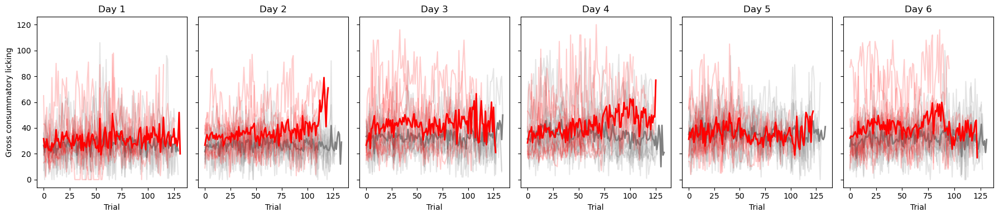

In [251]:
def plot_consum_compact(df_consum):
    days = sorted(df_consum['day'].unique())
    groups = df_consum['group'].unique()
    n_days = len(days)

    fig, axes = plt.subplots(1, n_days, figsize=(3*n_days, 4), sharey=True)

    if n_days == 1:
        axes = [axes]  

    for ax, day in zip(axes, days):
        ax.set_title(f"Day {day+1}")

        for group in groups:
            group_df = df_consum[(df_consum['day']==day) & (df_consum['group']==group)]
            all_trials = []

            for _, row in group_df.iterrows():
                gc = row['gross_consume']
                ax.plot(gc, 
                        color='grey' if group=='CTRL' else 'red', 
                        alpha=0.2)
                all_trials.append(gc)

            # mean
            max_len = max(len(x) for x in all_trials)
            arr = np.full((len(all_trials), max_len), np.nan)
            for i, x in enumerate(all_trials):
                arr[i, :len(x)] = x
            mean_gc = np.nanmean(arr, axis=0)

            # plot mean
            ax.plot(mean_gc, 
                    color='grey' if group=='CTRL' else 'red', 
                    linewidth=2, 
                    label=group)

        ax.set_xlabel("Trial")

    axes[0].set_ylabel("Gross consummatory licking")
    # axes[0].legend()
    fig.tight_layout()
    plt.show()
    fig.savefig(os.path.join(fig_dir, 'gross_lick_2sec.pdf'))
plot_consum_compact(df_consum)

In [380]:
def add_mean_gross_consume(df):
    df = df.copy()
    df['gross_consume_mean'] = df['gross_consume'].apply(
        lambda arr: np.nanmean(arr) if isinstance(arr, (list, np.ndarray)) else np.nan
    )
    return df
df = add_mean_gross_consume(df_consum)

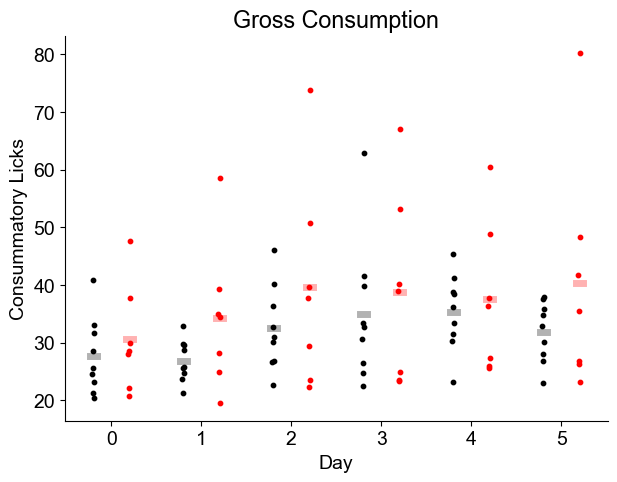

In [381]:
# df = df_consum

fig, ax = plt.subplots(1, 1, figsize=[7,5]) 

lw = 5   #
s = 10   
key = 'gross_consume_mean'  

for day in range(6):
    
    mask = (df['group']=='CTRL') & (df['day']==day)
    vals = df[key].loc[mask]._values
    ax.scatter(5*day - 1 + np.linspace(-0.05, 0.05, num=vals.shape[0]), vals, color='black', s=s)
    ax.plot(5*day - 1 + np.array([-0.2,0.2]), vals.mean()*np.ones([2,]), color='black', linewidth=lw, alpha=0.3)
    
    mask = (df['group']=='KO') & (df['day']==day)
    vals = df[key].loc[mask]._values
    ax.scatter(5*day + 1 + np.linspace(-0.05, 0.05, num=vals.shape[0]), vals, color='red', s=s)
    ax.plot(5*day + 1 + np.array([-0.2,0.2]), vals.mean()*np.ones([2,]), color='red', linewidth=lw, alpha=0.3)


ax.set_xticks(np.arange(0,6*5,5))
ax.set_xticklabels([x for x in range(0,6)])
ax.set_xlabel('Day')
ax.set_ylabel('Consummatory Licks')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_title('Gross Consumption')

plt.show()
fig.savefig(os.path.join(fig_dir, 'gross_consumm_summ.pdf'))

In [357]:
df

,mouse,group,day,gross_consume,gross_consume_mean
0,4467331.1,CTRL,0,"[29.0, 31.0, 32.0, 30.0, 36.0, 34.0, 20.0, 16....",24.553846
1,4467331.1,CTRL,1,"[12.0, 22.0, 21.0, 25.0, 25.0, 27.0, 29.0, 22....",23.679688
2,4467331.1,CTRL,2,"[24.0, 34.0, 23.0, 27.0, 30.0, 28.0, 30.0, 22....",26.635659
3,4467331.1,CTRL,3,"[23.0, 17.0, 8.0, 31.0, 36.0, 25.0, 10.0, 38.0...",30.578125
4,4467331.1,CTRL,4,"[37.0, 30.0, 41.0, 26.0, 12.0, 29.0, 42.0, 31....",30.392593
...,...,...,...,...,...
91,Cre9,KO,1,"[36.0, 47.0, 48.0, 52.0, 42.0, 58.0, 84.0, 86....",58.595041
92,Cre9,KO,2,"[21.0, 63.0, 69.0, 71.0, 24.0, 98.0, 57.0, 108...",73.843137
93,Cre9,KO,3,"[53.0, 52.0, 50.0, 47.0, 82.0, 25.0, 64.0, 33....",67.048077
94,Cre9,KO,4,"[54.0, 63.0, 62.0, 85.0, 60.0, 21.0, 43.0, 52....",48.854545


In [361]:
import pingouin as pg

In [382]:
df['lick_rank'] = df['gross_consume_mean'].rank()
aov = pg.mixed_anova(data=df, within='day', between='group', dv='lick_rank', subject='mouse')

In [383]:
aov

,Source,SS,DF1,DF2,MS,F,p-unc,np2,eps
0,group,1208.931217,1,14,1208.931217,0.396788,0.538898,0.027561,NaN
1,day,6768.625000,5,70,1353.725000,4.297872,0.001818,0.234884,0.555963
2,Interaction,1039.078704,5,70,207.815741,0.659783,0.655099,0.045006,NaN


### Slowing analysis for blocks 2-5

In [490]:
results = {}

speed_max_bin = 30

transitions = [1, 2, 3, 4, 5]  # block numbers

for cond, mice in zip(('ctrl', 'cre'), (ctrl_mice, ko_mice)):
    results[cond] = {}
    for day in range(6):
        results[cond][day] = {}
        for mouse in mice:

            d = {} 
            sess = u.load_vr_day(mouse, day)

            for t in transitions:
                try:
                    first_block_ind = np.argwhere(sess.trial_info['block_number'] == t)[0][0]
                except IndexError:
                    # skip if this block doesn't exist in session
                    continue

                baseline_trials = slice(first_block_ind-10, first_block_ind)
                this_block = sess.trial_info['block_number'] == t

                d[f'block{t}_lr'] = sess.trial_info['LR'][this_block]

                baseline_avg_speed = np.nanmean(
                    sess.trial_matrices['speed'][baseline_trials, :speed_max_bin], 
                    axis=0, 
                    keepdims=True
                ).mean()

                # normalize to baseline
                d[f'block{t}_baseline_speed'] = np.nanmean(
                    sess.trial_matrices['speed'][baseline_trials, :speed_max_bin] / baseline_avg_speed, 
                    axis=-1
                )
                d[f'block{t}_fam_speed'] = np.nanmean(
                    sess.trial_matrices['speed'][this_block, :speed_max_bin] / baseline_avg_speed, 
                    axis=-1
                )

            results[cond][day][mouse] = d


{'date': '29_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 0}
{'date': '29_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': 1, 'ravel_ind': 0}
{'date': '29_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 8, 'novel_arm': -1, 'ravel_ind': 0}
{'date': '29_11_2020', 'scene': 'YMaze_LNovel', 'session': 2, 'scan': 18, 'novel_arm': 1, 'ravel_ind': 1}
{'date': '29_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': -1, 'ravel_ind': 0}
{'date': '14_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 0}
{'date': '14_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': -1, 'ravel_ind': 0}
{'date': '14_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 0}
{'date': '15_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 0}
{'date': '30_11_2020', 'scene': 'YMaze_LNovel', 's

C:\Users\esay\AppData\Local\Temp\ipykernel_291044\1236476389.py:28: RuntimeWarning: Mean of empty slice
  baseline_avg_speed = np.nanmean(
C:\Users\esay\AppData\Local\Temp\ipykernel_291044\1236476389.py:39: RuntimeWarning: Mean of empty slice
  d[f'block{t}_fam_speed'] = np.nanmean(


{'date': '15_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': -1, 'ravel_ind': 1}
{'date': '15_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 1}
{'date': '16_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 1}
{'date': '01_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': -1, 'ravel_ind': 2}
{'date': '01_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': 1, 'ravel_ind': 2}
{'date': '01_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 5, 'novel_arm': -1, 'ravel_ind': 2}
{'date': '01_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': 1, 'ravel_ind': 4}
{'date': '01_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': -1, 'ravel_ind': 2}
{'date': '16_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': 1, 'ravel_ind': 2}
{'date': '16_10_2021', 'scene': 'YMaze_LNovel', 'se

C:\Users\esay\AppData\Local\Temp\ipykernel_291044\1236476389.py:28: RuntimeWarning: Mean of empty slice
  baseline_avg_speed = np.nanmean(
C:\Users\esay\AppData\Local\Temp\ipykernel_291044\1236476389.py:39: RuntimeWarning: Mean of empty slice
  d[f'block{t}_fam_speed'] = np.nanmean(
C:\Users\esay\AppData\Local\Temp\ipykernel_291044\1236476389.py:28: RuntimeWarning: Mean of empty slice
  baseline_avg_speed = np.nanmean(
C:\Users\esay\AppData\Local\Temp\ipykernel_291044\1236476389.py:39: RuntimeWarning: Mean of empty slice
  d[f'block{t}_fam_speed'] = np.nanmean(


{'date': '29_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 2}
{'date': '29_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 1}
{'date': '29_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': -1, 'ravel_ind': 1}
{'date': '29_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 1}
{'date': '29_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 1}
{'date': '19_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': -1, 'ravel_ind': 1}
{'date': '19_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': 1, 'ravel_ind': 1}
{'date': '30_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': -1, 'ravel_ind': 3}
{'date': '30_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': 1, 'ravel_ind': 2}
{'date': '30_09_2020', 'scene': 'YMaze_LNovel', 's

C:\Users\esay\AppData\Local\Temp\ipykernel_291044\1236476389.py:28: RuntimeWarning: Mean of empty slice
  baseline_avg_speed = np.nanmean(
C:\Users\esay\AppData\Local\Temp\ipykernel_291044\1236476389.py:39: RuntimeWarning: Mean of empty slice
  d[f'block{t}_fam_speed'] = np.nanmean(
C:\Users\esay\AppData\Local\Temp\ipykernel_291044\1236476389.py:28: RuntimeWarning: Mean of empty slice
  baseline_avg_speed = np.nanmean(
C:\Users\esay\AppData\Local\Temp\ipykernel_291044\1236476389.py:39: RuntimeWarning: Mean of empty slice
  d[f'block{t}_fam_speed'] = np.nanmean(
C:\Users\esay\AppData\Local\Temp\ipykernel_291044\1236476389.py:28: RuntimeWarning: Mean of empty slice
  baseline_avg_speed = np.nanmean(
C:\Users\esay\AppData\Local\Temp\ipykernel_291044\1236476389.py:39: RuntimeWarning: Mean of empty slice
  d[f'block{t}_fam_speed'] = np.nanmean(


In [491]:
results = {}

speed_max_bin = 30
transitions = [0,1,2,3,4,5]  # include block 6 if not already

for cond, mice in zip(('ctrl', 'cre'), (ctrl_mice, ko_mice)):
    results[cond] = {}
    for day in range(6):
        results[cond][day] = {}
        for mouse in mice:

            d = {} 
            sess = u.load_vr_day(mouse, day)

            for t in transitions:
                try:
                    first_block_ind = np.argwhere(sess.trial_info['block_number'] == t)[0][0]
                except IndexError:
                    continue  # skip if this block doesn't exist in session

                baseline_trials = slice(first_block_ind - 10, first_block_ind)
                this_block = sess.trial_info['block_number'] == t

                lr_vals = sess.trial_info['LR'][this_block].copy()

                # --- modified block 6 logic ---
                if t == 5:
                    # initialize array (same length as lr_vals)
                    lr_binary = np.zeros_like(lr_vals, dtype=int)

                    # mark novel trials as 1
                    if sess.novel_arm == -1:
                        lr_binary[lr_vals == -1] = 1
                    elif sess.novel_arm == 1:
                        lr_binary[lr_vals == 1] = 1

                    d[f'block{t}_lr'] = lr_binary  # 0 = familiar, 1 = novel
                else:
                    d[f'block{t}_lr'] = lr_vals

                # --- baseline and normalized speeds ---
                baseline_avg_speed = np.nanmean(
                    sess.trial_matrices['speed'][baseline_trials, :speed_max_bin], 
                    axis=0, 
                    keepdims=True
                ).mean()

                d[f'block{t}_baseline_speed'] = np.nanmean(
                    sess.trial_matrices['speed'][baseline_trials, :speed_max_bin] / baseline_avg_speed, 
                    axis=-1
                )

                d[f'block{t}_fam_speed'] = np.nanmean(
                    sess.trial_matrices['speed'][this_block, :speed_max_bin] / baseline_avg_speed, 
                    axis=-1
                )

            results[cond][day][mouse] = d


{'date': '29_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 0}
{'date': '29_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': 1, 'ravel_ind': 0}
{'date': '29_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 8, 'novel_arm': -1, 'ravel_ind': 0}
{'date': '29_11_2020', 'scene': 'YMaze_LNovel', 'session': 2, 'scan': 18, 'novel_arm': 1, 'ravel_ind': 1}
{'date': '29_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': -1, 'ravel_ind': 0}
{'date': '14_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 0}
{'date': '14_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': -1, 'ravel_ind': 0}
{'date': '14_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 0}
{'date': '15_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 0}
{'date': '30_11_2020', 'scene': 'YMaze_LNovel', 's

C:\Users\esay\AppData\Local\Temp\ipykernel_291044\3032602440.py:42: RuntimeWarning: Mean of empty slice
  baseline_avg_speed = np.nanmean(
C:\Users\esay\AppData\Local\Temp\ipykernel_291044\3032602440.py:53: RuntimeWarning: Mean of empty slice
  d[f'block{t}_fam_speed'] = np.nanmean(
C:\Users\esay\AppData\Local\Temp\ipykernel_291044\3032602440.py:42: RuntimeWarning: Mean of empty slice
  baseline_avg_speed = np.nanmean(
C:\Users\esay\AppData\Local\Temp\ipykernel_291044\3032602440.py:53: RuntimeWarning: Mean of empty slice
  d[f'block{t}_fam_speed'] = np.nanmean(
C:\Users\esay\AppData\Local\Temp\ipykernel_291044\3032602440.py:42: RuntimeWarning: Mean of empty slice
  baseline_avg_speed = np.nanmean(
C:\Users\esay\AppData\Local\Temp\ipykernel_291044\3032602440.py:53: RuntimeWarning: Mean of empty slice
  d[f'block{t}_fam_speed'] = np.nanmean(
C:\Users\esay\AppData\Local\Temp\ipykernel_291044\3032602440.py:42: RuntimeWarning: Mean of empty slice
  baseline_avg_speed = np.nanmean(
C:\Users\

{'date': '15_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 1}
{'date': '16_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 1}
{'date': '01_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': -1, 'ravel_ind': 2}
{'date': '01_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': 1, 'ravel_ind': 2}
{'date': '01_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 5, 'novel_arm': -1, 'ravel_ind': 2}
{'date': '01_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': 1, 'ravel_ind': 4}
{'date': '01_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': -1, 'ravel_ind': 2}
{'date': '16_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': 1, 'ravel_ind': 2}
{'date': '16_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 2}
{'date': '16_10_2021', 'scene': 'YMaze_LNovel', 'se

C:\Users\esay\AppData\Local\Temp\ipykernel_291044\3032602440.py:42: RuntimeWarning: Mean of empty slice
  baseline_avg_speed = np.nanmean(
C:\Users\esay\AppData\Local\Temp\ipykernel_291044\3032602440.py:53: RuntimeWarning: Mean of empty slice
  d[f'block{t}_fam_speed'] = np.nanmean(
C:\Users\esay\AppData\Local\Temp\ipykernel_291044\3032602440.py:42: RuntimeWarning: Mean of empty slice
  baseline_avg_speed = np.nanmean(
C:\Users\esay\AppData\Local\Temp\ipykernel_291044\3032602440.py:53: RuntimeWarning: Mean of empty slice
  d[f'block{t}_fam_speed'] = np.nanmean(
C:\Users\esay\AppData\Local\Temp\ipykernel_291044\3032602440.py:42: RuntimeWarning: Mean of empty slice
  baseline_avg_speed = np.nanmean(
C:\Users\esay\AppData\Local\Temp\ipykernel_291044\3032602440.py:53: RuntimeWarning: Mean of empty slice
  d[f'block{t}_fam_speed'] = np.nanmean(
C:\Users\esay\AppData\Local\Temp\ipykernel_291044\3032602440.py:42: RuntimeWarning: Mean of empty slice
  baseline_avg_speed = np.nanmean(
C:\Users\

{'date': '02_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': -1, 'ravel_ind': 3}
{'date': '17_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': 1, 'ravel_ind': 3}
{'date': '17_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': -1, 'ravel_ind': 3}
{'date': '17_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 3}
{'date': '19_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 3}
{'date': '03_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 8, 'novel_arm': -1, 'ravel_ind': 4}
{'date': '03_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 5}
{'date': '03_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 4}
{'date': '03_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 6}
{'date': '03_12_2020', 'scene': 'YMaze_LNovel', 'se

C:\Users\esay\AppData\Local\Temp\ipykernel_291044\3032602440.py:53: RuntimeWarning: Mean of empty slice
  d[f'block{t}_fam_speed'] = np.nanmean(
C:\Users\esay\AppData\Local\Temp\ipykernel_291044\3032602440.py:42: RuntimeWarning: Mean of empty slice
  baseline_avg_speed = np.nanmean(
C:\Users\esay\AppData\Local\Temp\ipykernel_291044\3032602440.py:53: RuntimeWarning: Mean of empty slice
  d[f'block{t}_fam_speed'] = np.nanmean(
C:\Users\esay\AppData\Local\Temp\ipykernel_291044\3032602440.py:42: RuntimeWarning: Mean of empty slice
  baseline_avg_speed = np.nanmean(
C:\Users\esay\AppData\Local\Temp\ipykernel_291044\3032602440.py:53: RuntimeWarning: Mean of empty slice
  d[f'block{t}_fam_speed'] = np.nanmean(
C:\Users\esay\AppData\Local\Temp\ipykernel_291044\3032602440.py:42: RuntimeWarning: Mean of empty slice
  baseline_avg_speed = np.nanmean(
C:\Users\esay\AppData\Local\Temp\ipykernel_291044\3032602440.py:53: RuntimeWarning: Mean of empty slice
  d[f'block{t}_fam_speed'] = np.nanmean(
C:\

{'date': '04_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': -1, 'ravel_ind': 5}
{'date': '04_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 6}
{'date': '04_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': -1, 'ravel_ind': 5}
{'date': '04_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 7}
{'date': '05_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': -1, 'ravel_ind': 5}
{'date': '19_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 5, 'novel_arm': 1, 'ravel_ind': 5}
{'date': '19_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': -1, 'ravel_ind': 5}
{'date': '20_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': 1, 'ravel_ind': 5}
{'date': '21_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': 1, 'ravel_ind': 5}
({'date': '28_09_2020', 'scene': 'YMaze_LNovel', 's

C:\Users\esay\AppData\Local\Temp\ipykernel_291044\3032602440.py:42: RuntimeWarning: Mean of empty slice
  baseline_avg_speed = np.nanmean(
C:\Users\esay\AppData\Local\Temp\ipykernel_291044\3032602440.py:53: RuntimeWarning: Mean of empty slice
  d[f'block{t}_fam_speed'] = np.nanmean(
C:\Users\esay\AppData\Local\Temp\ipykernel_291044\3032602440.py:42: RuntimeWarning: Mean of empty slice
  baseline_avg_speed = np.nanmean(
C:\Users\esay\AppData\Local\Temp\ipykernel_291044\3032602440.py:53: RuntimeWarning: Mean of empty slice
  d[f'block{t}_fam_speed'] = np.nanmean(
C:\Users\esay\AppData\Local\Temp\ipykernel_291044\3032602440.py:42: RuntimeWarning: Mean of empty slice
  baseline_avg_speed = np.nanmean(
C:\Users\esay\AppData\Local\Temp\ipykernel_291044\3032602440.py:53: RuntimeWarning: Mean of empty slice
  d[f'block{t}_fam_speed'] = np.nanmean(
C:\Users\esay\AppData\Local\Temp\ipykernel_291044\3032602440.py:42: RuntimeWarning: Mean of empty slice
  baseline_avg_speed = np.nanmean(
C:\Users\

{'date': '18_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': 1, 'ravel_ind': 0}
{'date': '29_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 2}
{'date': '29_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 1}
{'date': '29_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': -1, 'ravel_ind': 1}
{'date': '29_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 1}
{'date': '29_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 1}
{'date': '19_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': -1, 'ravel_ind': 1}
{'date': '19_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': 1, 'ravel_ind': 1}
{'date': '30_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': -1, 'ravel_ind': 3}
{'date': '30_09_2020', 'scene': 'YMaze_LNovel', 's

C:\Users\esay\AppData\Local\Temp\ipykernel_291044\3032602440.py:42: RuntimeWarning: Mean of empty slice
  baseline_avg_speed = np.nanmean(
C:\Users\esay\AppData\Local\Temp\ipykernel_291044\3032602440.py:53: RuntimeWarning: Mean of empty slice
  d[f'block{t}_fam_speed'] = np.nanmean(
C:\Users\esay\AppData\Local\Temp\ipykernel_291044\3032602440.py:42: RuntimeWarning: Mean of empty slice
  baseline_avg_speed = np.nanmean(
C:\Users\esay\AppData\Local\Temp\ipykernel_291044\3032602440.py:53: RuntimeWarning: Mean of empty slice
  d[f'block{t}_fam_speed'] = np.nanmean(
C:\Users\esay\AppData\Local\Temp\ipykernel_291044\3032602440.py:42: RuntimeWarning: Mean of empty slice
  baseline_avg_speed = np.nanmean(
C:\Users\esay\AppData\Local\Temp\ipykernel_291044\3032602440.py:53: RuntimeWarning: Mean of empty slice
  d[f'block{t}_fam_speed'] = np.nanmean(
C:\Users\esay\AppData\Local\Temp\ipykernel_291044\3032602440.py:42: RuntimeWarning: Mean of empty slice
  baseline_avg_speed = np.nanmean(
C:\Users\

{'date': '01_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': -1, 'ravel_ind': 4}
{'date': '01_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': 1, 'ravel_ind': 3}
{'date': '01_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 7, 'novel_arm': -1, 'ravel_ind': 3}
{'date': '01_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': 1, 'ravel_ind': 3}
{'date': '01_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 7, 'novel_arm': -1, 'ravel_ind': 3}
{'date': '21_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': -1, 'ravel_ind': 3}
{'date': '21_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': 1, 'ravel_ind': 3}
{'date': '02_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 5}
{'date': '02_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 9, 'novel_arm': 1, 'ravel_ind': 4}
{'date': '02_10_2020', 'scene': 'YMaze_LNovel', 's

C:\Users\esay\AppData\Local\Temp\ipykernel_291044\3032602440.py:42: RuntimeWarning: Mean of empty slice
  baseline_avg_speed = np.nanmean(
C:\Users\esay\AppData\Local\Temp\ipykernel_291044\3032602440.py:53: RuntimeWarning: Mean of empty slice
  d[f'block{t}_fam_speed'] = np.nanmean(
C:\Users\esay\AppData\Local\Temp\ipykernel_291044\3032602440.py:42: RuntimeWarning: Mean of empty slice
  baseline_avg_speed = np.nanmean(
C:\Users\esay\AppData\Local\Temp\ipykernel_291044\3032602440.py:53: RuntimeWarning: Mean of empty slice
  d[f'block{t}_fam_speed'] = np.nanmean(
C:\Users\esay\AppData\Local\Temp\ipykernel_291044\3032602440.py:42: RuntimeWarning: Mean of empty slice
  baseline_avg_speed = np.nanmean(
C:\Users\esay\AppData\Local\Temp\ipykernel_291044\3032602440.py:53: RuntimeWarning: Mean of empty slice
  d[f'block{t}_fam_speed'] = np.nanmean(
C:\Users\esay\AppData\Local\Temp\ipykernel_291044\3032602440.py:42: RuntimeWarning: Mean of empty slice
  baseline_avg_speed = np.nanmean(
C:\Users\

In [140]:
results


{'ctrl': {0: {'4467331.1': {'block0_lr': array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
           1., 1., 1.]),
    'block0_baseline_speed': array([], dtype=float64),
    'block0_fam_speed': array([nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
           nan, nan, nan, nan, nan, nan, nan]),
    'block1_lr': array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
           1., 1., 1.]),
    'block1_baseline_speed': array([0.9100333 , 0.93185584, 1.01918611, 1.05602935, 1.0204382 ,
           0.96412183, 0.97915714, 1.09693473, 1.07523556, 0.94700795]),
    'block1_fam_speed': array([0.83851947, 0.92832232, 0.50092243, 0.74340616, 0.81579763,
           0.8935848 , 0.81779282, 0.8696853 , 0.66190972, 0.93388606,
           0.95001983, 0.9081373 , 0.99824664, 0.93412204, 0.70407488,
           1.02811449, 0.94628341, 1.09673602, 1.0082365 , 0.69866735]),
    'block2_lr': array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 

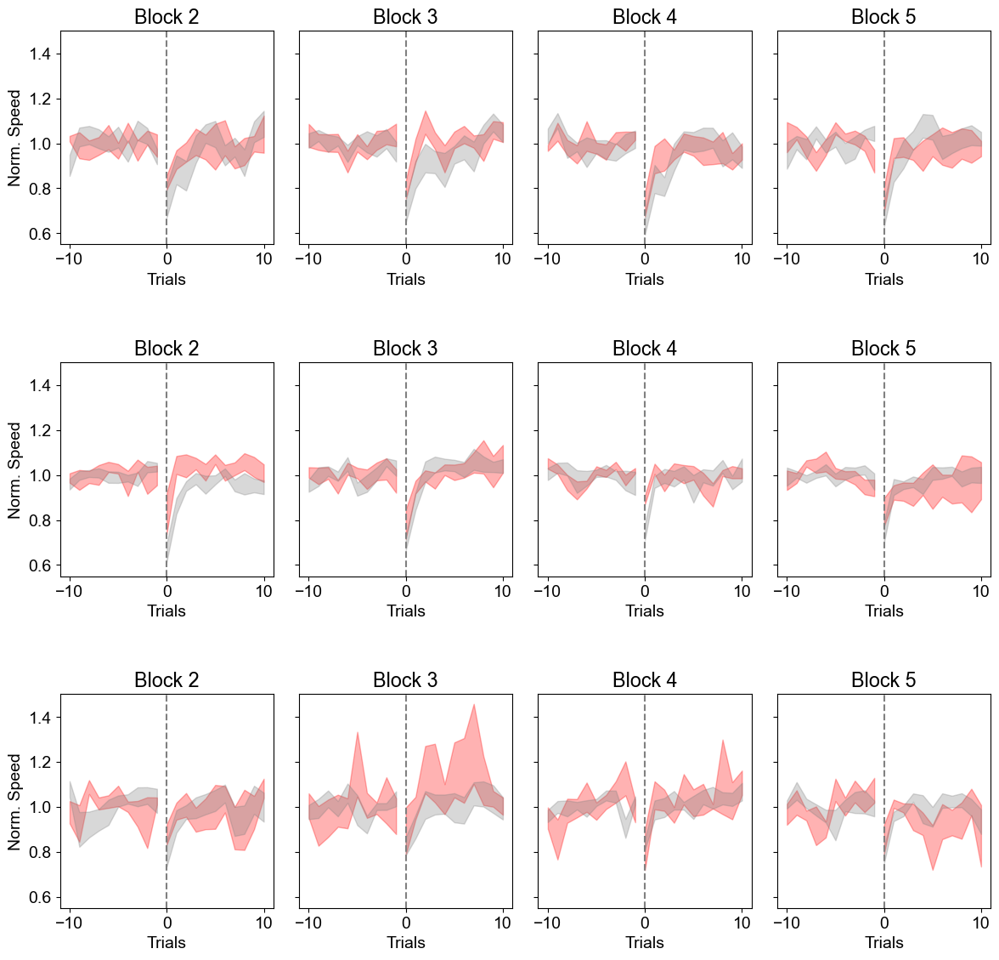

In [493]:
# import numpy as np
# import matplotlib.pyplot as plt
# import scipy as sp

days = [0,2,4]  
blocks = [1,2,3,4] # transitions
ko_mice = list(results['cre'][0].keys())
ctrl_mice = list(results['ctrl'][0].keys())

fig, axes = plt.subplots(len(days), len(blocks), figsize=(12, 12), sharey=True)
for ax in axes.ravel():
    ax.set_box_aspect(1)

for i, day in enumerate(days):
    for j, t in enumerate(blocks):
        ax = axes[i, j] if len(days) > 1 else axes[j]

        # cre
        ko_fam = np.full((len(ko_mice), 11), np.nan)
        ko_base = np.full((len(ko_mice), 10), np.nan)

        for m, mouse in enumerate(ko_mice):
            d = results['cre'][day][mouse]
            if f'block{t}_fam_speed' not in d or f'block{t}_baseline_speed' not in d:
                continue

            base_vals = d[f'block{t}_baseline_speed'][-10:]
            fam_vals = d[f'block{t}_fam_speed'][:11]

            if base_vals.size == 10:
                ko_base[m, :] = (base_vals)

            if fam_vals.size > 0:
                _vals = (fam_vals)
                ko_fam[m, :_vals.shape[0]] = _vals

        # plot CRE if valid
        if not np.all(np.isnan(ko_base)):
            x_base = np.arange(-10, 0)
            mu_b = np.nanmean(ko_base, axis=0)
            sem_b = sp.stats.sem(ko_base, axis=0, nan_policy='omit')
            ax.fill_between(x_base, mu_b-sem_b, mu_b+sem_b, color='red', alpha=.3)

        if not np.all(np.isnan(ko_fam)):
            x_fam = np.arange(11)
            mu_s = np.nanmean(ko_fam, axis=0)
            sem_s = sp.stats.sem(ko_fam, axis=0, nan_policy='omit')
            ax.fill_between(x_fam, mu_s-sem_s, mu_s+sem_s, color='red', alpha=.3)

        # ctrl
        ctrl_fam = np.full((len(ctrl_mice), 11), np.nan)
        ctrl_base = np.full((len(ctrl_mice), 10), np.nan)

        for m, mouse in enumerate(ctrl_mice):
            d = results['ctrl'][day][mouse]
            if f'block{t}_fam_speed' not in d or f'block{t}_baseline_speed' not in d:
                continue

            base_vals = d[f'block{t}_baseline_speed'][-10:]
            fam_vals = d[f'block{t}_fam_speed'][:11]

            if base_vals.size == 10:
                ctrl_base[m, :] = (base_vals)

            if fam_vals.size > 0:
                _vals = (fam_vals)
                ctrl_fam[m, :_vals.shape[0]] = _vals

        if not np.all(np.isnan(ctrl_base)):
            x_base = np.arange(-10, 0)
            mu_b = np.nanmean(ctrl_base, axis=0)
            sem_b = sp.stats.sem(ctrl_base, axis=0, nan_policy='omit')
            ax.fill_between(x_base, mu_b-sem_b, mu_b+sem_b, color='grey', alpha=.3)

        if not np.all(np.isnan(ctrl_fam)):
            x_fam = np.arange(11)
            mu_s = np.nanmean(ctrl_fam, axis=0)
            sem_s = sp.stats.sem(ctrl_fam, axis=0, nan_policy='omit')
            ax.fill_between(x_fam, mu_s-sem_s, mu_s+sem_s, color='grey', alpha=.3)

        ax.axvline(0, color='grey', linestyle='--')  # dotted line separation
        ax.set_title(f"Block {t+1}")
        ax.set_xlabel("Trials")
        if j == 0:
            ax.set_ylabel("Norm. Speed")

plt.tight_layout()
plt.show()

fig.savefig(os.path.join(fig_dir, 'all_blocks_day0_1_4.pdf'))

### Overall running speed differences in block 6 transition
ie. do not normalize

In [495]:
results = {}

speed_max_bin = 30

for cond, mice in zip(('ctrl', 'cre'),(ctrl_mice, ko_mice)):
    results[cond] = {}
    for day in range(6):
        results[cond][day] = {}
        for mouse in mice:
            
            d = {} 
            sess = u.load_vr_day(mouse, day)

            
            last_block_ind = np.argwhere(sess.trial_info['block_number']==5)[0][0]

            baseline_trials = slice(last_block_ind-10, last_block_ind)

            last_block = sess.trial_info['block_number']==5
            fam_last_block = (sess.trial_info['block_number']==5)*(sess.trial_info['LR']==-1*sess.novel_arm)
            nov_last_block = (sess.trial_info['block_number']==5)*(sess.trial_info['LR']==sess.novel_arm)
            
            d['last_block_lr'] = sess.trial_info['LR'][last_block]
            
            baseline_avg_speed = np.nanmean(sess.trial_matrices['speed'][baseline_trials,:speed_max_bin], axis=0, keepdims=True).mean()
            
            d['baseline_speed'] = np.nanmean(sess.trial_matrices['speed'][baseline_trials,:speed_max_bin], axis=-1)
            d['last_block_speed'] = np.nanmean(sess.trial_matrices['speed'][last_block,:speed_max_bin], axis=-1)
            d['fam_speed'] = np.nanmean(sess.trial_matrices['speed'][fam_last_block,:speed_max_bin], axis=-1)
            d['nov_speed'] = np.nanmean(sess.trial_matrices['speed'][nov_last_block,:speed_max_bin], axis=-1)
            
            results[cond][day][mouse] = d


{'date': '29_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 0}
{'date': '29_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': 1, 'ravel_ind': 0}
{'date': '29_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 8, 'novel_arm': -1, 'ravel_ind': 0}
{'date': '29_11_2020', 'scene': 'YMaze_LNovel', 'session': 2, 'scan': 18, 'novel_arm': 1, 'ravel_ind': 1}
{'date': '29_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': -1, 'ravel_ind': 0}
{'date': '14_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 0}
{'date': '14_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': -1, 'ravel_ind': 0}
{'date': '14_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 0}
{'date': '15_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 0}
{'date': '30_11_2020', 'scene': 'YMaze_LNovel', 's

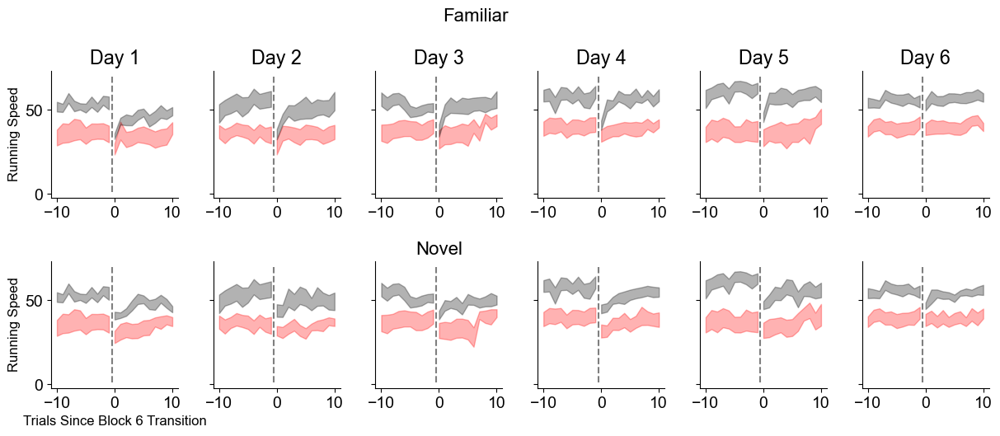

In [477]:
fig,ax = plt.subplots(2,6, figsize = [15, 5],sharey=True)
# ax[0,0].set_ylim([.5,1.2])
plt.rcParams['font.family'] = 'Arial'
for a in ax.ravel():
    a.set_box_aspect(1)

n_trials_anova = 5
df = {
      'mouse': [],
      'cond': [],
      'day': [],
      'fam_speed':[],
      'nov_speed': [],
     }

for day in range(6):
    
    
#      familiar
    ko_base = np.zeros((len(ko_mice), 10))*np.nan
    ko_fam_speed = np.zeros((len(ko_mice), 11))*np.nan
    ko_nov_speed = np.zeros((len(ko_mice), 11))*np.nan
    for m, mouse in enumerate(ko_mice):
        d = results['cre'][day][mouse]
        ko_base[m,:] = (d['baseline_speed'][-10:])
        
        _speed = (d['fam_speed'][:11])
        ko_fam_speed[m,:_speed.shape[0]] = _speed[:11]
        
        _speed = (d['nov_speed'][:11])
        ko_nov_speed[m,:_speed.shape[0]] = _speed[:11]
        
        df['mouse'].append(mouse)
        df['cond'].append('cre')
        df['day'].append(day)
        df['fam_speed'].append((np.nanmean(d['fam_speed'][:n_trials_anova])))
        df['nov_speed'].append((np.nanmean(d['nov_speed'][:n_trials_anova])))
        # df['fam_speed'].append(np.log10(np.nanmean(d['fam_speed'][:n_trials_anova])))
        # df['nov_speed'].append(np.log10(np.nanmean(d['nov_speed'][:n_trials_anova])))
        
        


    x_base = np.arange(-10,0)
    x_speed = np.arange(0, 11)
    mu_b, sem_b = np.nanmean(ko_base, axis=0), sp.stats.sem(ko_base, axis=0, nan_policy='omit')
    ax[0, day].fill_between(x_base, mu_b-sem_b, mu_b+sem_b, color='red', alpha=.3)
    ax[1, day].fill_between(x_base, mu_b-sem_b, mu_b+sem_b, color='red', alpha=.3)

    mu_s, sem_s = np.nanmean(ko_fam_speed, axis=0), sp.stats.sem(ko_fam_speed, axis=0, nan_policy='omit')
    ax[0, day].fill_between(x_speed, mu_s-sem_s, mu_s+sem_s, color='red', alpha=.3)
    
    mu_s, sem_s = np.nanmean(ko_nov_speed, axis=0), sp.stats.sem(ko_nov_speed, axis=0, nan_policy='omit')
    ax[1, day].fill_between(x_speed, mu_s-sem_s, mu_s+sem_s, color='red', alpha=.3)
    
    
    
 


    ctrl_base = np.zeros((len(ctrl_mice), 10))*np.nan
    ctrl_fam_speed = np.zeros((len(ctrl_mice), 11))*np.nan
    ctrl_nov_speed = np.zeros((len(ctrl_mice), 11))*np.nan
    for m, mouse in enumerate(ctrl_mice):
        d = results['ctrl'][day][mouse]
        
        ctrl_base[m,:] = (d['baseline_speed'][-10:])
        
        _speed = (d['fam_speed'][:11])
        ctrl_fam_speed[m,:_speed.shape[0]] = _speed[:11]
        
        _speed = (d['nov_speed'][:11])
        ctrl_nov_speed[m,:_speed.shape[0]] = _speed[:11]
        
        df['mouse'].append(mouse)
        df['cond'].append('ctrl')
        df['day'].append(day)
        df['fam_speed'].append((np.nanmean(d['fam_speed'][:n_trials_anova])))
        df['nov_speed'].append((np.nanmean(d['nov_speed'][:n_trials_anova])))        

    mu_b, sem_b = ctrl_base.mean(axis=0), sp.stats.sem(ctrl_base, axis=0)
    ax[0, day].fill_between(x_base, mu_b-sem_b, mu_b+sem_b, color='black', alpha=.3)
    ax[1, day].fill_between(x_base, mu_b-sem_b, mu_b+sem_b, color='black', alpha=.3)

    mu_s, sem_s = ctrl_fam_speed.mean(axis=0), sp.stats.sem(ctrl_fam_speed, axis=0)
    ax[0, day].fill_between(x_speed, mu_s-sem_s, mu_s+sem_s, color='black', alpha=.3)
    
    mu_s, sem_s = ctrl_nov_speed.mean(axis=0), sp.stats.sem(ctrl_nov_speed, axis=0)
    ax[1, day].fill_between(x_speed, mu_s-sem_s, mu_s+sem_s, color='black', alpha=.3)
    
    

    
    ax[0,day].plot([-.5, -.5],[1.25,70],'k--', alpha = .5)
    ax[1,day].plot([-.5, -.5],[1.25,70],'k--', alpha = .5)
    
    # ax[0,day].set_xticks([-5, 0, 5, 10])
    # ax[1,day].set_xticks([-5, 0, 5, 10])
    
    
    ax[0,day].spines['top'].set_visible(False)
    ax[1,day].spines['top'].set_visible(False)
    ax[0,day].set_title(f"Day {day+1}")
    # ax[1,day].set_title(f"Day {day+1}")
    
    ax[0,day].spines['right'].set_visible(False)
    ax[1,day].spines['right'].set_visible(False)
    
ax[0,0].set_ylabel('Running Speed', fontsize=12)
# ax[0,0].set_xlabel('Trials Since Block 6 Transition')

ax[1,0].set_ylabel('Running Speed',fontsize=12)
ax[1,0].set_xlabel('Trials Since Block 6 Transition', fontsize=12)
fig.text(.45,1,"Familiar",fontsize=16)
ax[1,2].set_title("Novel",fontsize=16)

plt.subplots_adjust(hspace=0.5,wspace=0.1)
df = pd.DataFrame(df)

# figdir = 'C:/Users/esay/data/Stx3/YMazeResults/behavior'
fig.savefig(os.path.join(fig_dir,"relative_speed_all_days.pdf"),format='pdf')

In [478]:
df

,mouse,cond,day,fam_speed,nov_speed
0,4467975.1,cre,0,41.713576,38.038667
1,4467975.2,cre,0,39.603261,34.150983
2,4467975.3,cre,0,21.645641,23.131250
3,4467975.4,cre,0,36.756232,27.460431
4,4467975.5,cre,0,13.799061,12.704509
...,...,...,...,...,...
91,4467333.1,ctrl,5,51.046780,53.336744
92,mCherry6,ctrl,5,56.113237,58.796830
93,mCherry7,ctrl,5,52.045809,51.087167
94,mCherry8,ctrl,5,49.039853,48.697936


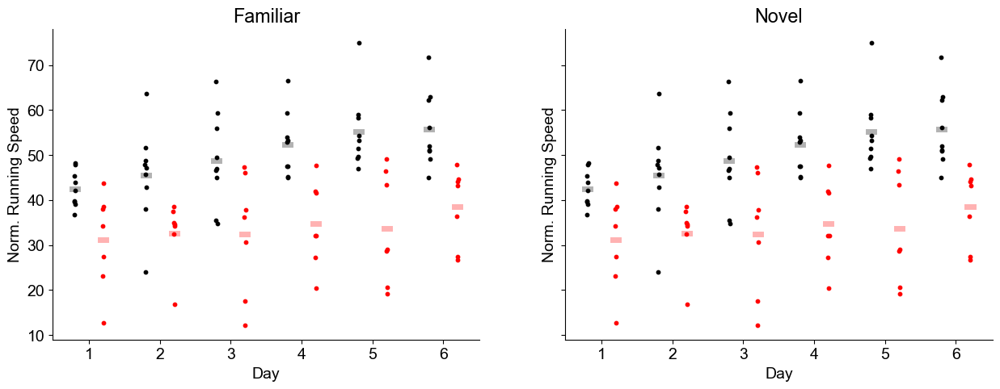

In [479]:
fig, ax = plt.subplots(1,2, figsize=[15,5], sharey=True)

lw = 5
s = 10
fam_key = 'fam_speed'
nov_key = 'nov_speed'
for day in range(6):
    
    mask = (df['cond']=='ctrl') & (df['day']==day)# & (df['nov']==False)
    lr = df[fam_key].loc[mask]._values
    ax[0].scatter(5*day -1 + np.linspace(-0.05, 0.05, num=lr.shape[0]), lr, color='black', s=s)
    ax[0].plot(5*day -1 + np.array([-0.2, .2]), lr.mean()*np.ones([2,]), color='black', linewidth=lw,alpha = .3)
    
    mask = (df['cond']=='ctrl') & (df['day']==day)# & (df['nov']==True)
    lr = df[fam_key].loc[mask]._values
    ax[1].scatter(5*day -1 + np.linspace(-0.05, 0.05, num=lr.shape[0]), lr, color='black', s=s, alpha = 1)
    ax[1].plot(5*day -1 + np.array([-0.2, .2]), lr.mean()*np.ones([2,]), color='black', linewidth=lw,alpha = .3)
    
    mask = (df['cond']=='cre') & (df['day']==day)# & (df['nov']==False)
    lr = df[nov_key].loc[mask]._values
    ax[0].scatter(5*day +1 + np.linspace(-0.05, 0.05, num=lr.shape[0]), lr, color='red', s=s)
    ax[0].plot(5*day + 1 + np.array([-0.2, .2]), lr.mean()*np.ones([2,]), color='red', linewidth=lw,alpha = .3)
    
    mask = (df['cond']=='cre') & (df['day']==day)#& (df['nov']==True)
    lr = df[nov_key].loc[mask]._values
    ax[1].scatter(5*day +1 + np.linspace(-0.05, 0.05, num=lr.shape[0]), lr, color='red', s=s, alpha=1)
    ax[1].plot(5*day + 1 + np.array([-0.2, .2]), lr.mean()*np.ones([2,]), color='red', linewidth=lw,alpha = .3)
    
ax[0].set_title('Familiar')
ax[1].set_title('Novel')
    
for a in range(2):

    ax[a].set_xticks(np.arange(0,6*5,5))
    ax[a].set_xticklabels([x for x in range(1,7)])

    ax[a].spines['top'].set_visible(False)
    ax[a].spines['right'].set_visible(False)

    ax[a].set_ylabel('Norm. Running Speed')
    ax[a].set_xlabel('Day')

fig.savefig(os.path.join(fig_dir, 'norm_running_speed.pdf'))

In [481]:
# familiar
df['fam_rank'] = df['fam_speed'].rank()
aov_fam = pg.mixed_anova(data=df, within='day', between='cond', dv='fam_rank', subject='mouse')
print(aov_fam)

#nov
df['nov_rank'] = df['nov_speed'].rank()
aov_nov = pg.mixed_anova(data=df, within='day', between='cond', dv='nov_rank', subject='mouse')
print(aov_nov)

        Source            SS  DF1  DF2            MS          F     p-unc  \
0         cond  26752.380952    1   14  26752.380952  19.049926  0.000647   
1          day   9293.375000    5   70   1858.675000   8.033161  0.000005   
2  Interaction   1817.355159    5   70    363.471032   1.570916  0.179632   

        np2       eps  
0  0.576398       NaN  
1  0.364594  0.770478  
2  0.100888       NaN  
        Source            SS  DF1  DF2            MS          F     p-unc  \
0         cond  29582.899471    1   14  29582.899471  19.066909  0.000645   
1          day   3753.625000    5   70    750.725000   2.885593  0.019964   
2  Interaction    450.618386    5   70     90.123677   0.346412  0.882892   

        np2       eps  
0  0.576616       NaN  
1  0.170891  0.736225  
2  0.024146       NaN  


### baseline normalized running speed

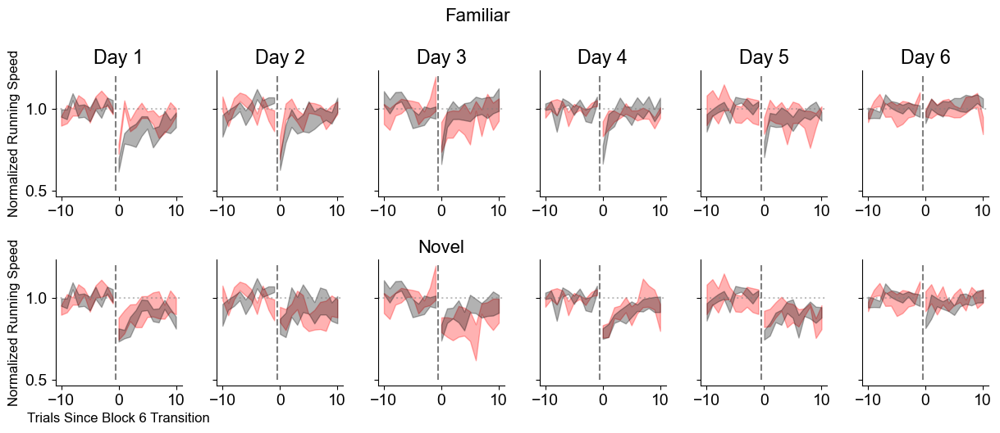

In [496]:
fig, ax = plt.subplots(2, 6, figsize=[15, 5], sharey=True)
plt.rcParams['font.family'] = 'Arial'
for a in ax.ravel():
    a.set_box_aspect(1)

n_trials_anova = 5
df = {
      'mouse': [],
      'cond': [],
      'day': [],
      'fam_speed': [],
      'nov_speed': [],
     }

for day in range(6):
    
    # KO mice
    ko_base = np.zeros((len(ko_mice), 10)) * np.nan
    ko_fam_speed = np.zeros((len(ko_mice), 11)) * np.nan
    ko_nov_speed = np.zeros((len(ko_mice), 11)) * np.nan
    
    for m, mouse in enumerate(ko_mice):
        d = results['cre'][day][mouse]
        
        # Calculate baseline mean for normalization
        baseline_mean = np.nanmean(d['baseline_speed'][-10:])
        
        ko_base[m, :] = d['baseline_speed'][-10:] / baseline_mean
        
        _speed = d['fam_speed'][:11] / baseline_mean
        ko_fam_speed[m, :_speed.shape[0]] = _speed[:11]
        
        _speed = d['nov_speed'][:11] / baseline_mean
        ko_nov_speed[m, :_speed.shape[0]] = _speed[:11]
        
        df['mouse'].append(mouse)
        df['cond'].append('cre')
        df['day'].append(day)
        df['fam_speed'].append(np.nanmean(d['fam_speed'][:n_trials_anova] / baseline_mean))
        df['nov_speed'].append(np.nanmean(d['nov_speed'][:n_trials_anova] / baseline_mean))

    x_base = np.arange(-10, 0)
    x_speed = np.arange(0, 11)
    
    mu_b, sem_b = np.nanmean(ko_base, axis=0), sp.stats.sem(ko_base, axis=0, nan_policy='omit')
    ax[0, day].fill_between(x_base, mu_b - sem_b, mu_b + sem_b, color='red', alpha=.3)
    ax[1, day].fill_between(x_base, mu_b - sem_b, mu_b + sem_b, color='red', alpha=.3)

    mu_s, sem_s = np.nanmean(ko_fam_speed, axis=0), sp.stats.sem(ko_fam_speed, axis=0, nan_policy='omit')
    ax[0, day].fill_between(x_speed, mu_s - sem_s, mu_s + sem_s, color='red', alpha=.3)
    
    mu_s, sem_s = np.nanmean(ko_nov_speed, axis=0), sp.stats.sem(ko_nov_speed, axis=0, nan_policy='omit')
    ax[1, day].fill_between(x_speed, mu_s - sem_s, mu_s + sem_s, color='red', alpha=.3)

    # Control mice
    ctrl_base = np.zeros((len(ctrl_mice), 10)) * np.nan
    ctrl_fam_speed = np.zeros((len(ctrl_mice), 11)) * np.nan
    ctrl_nov_speed = np.zeros((len(ctrl_mice), 11)) * np.nan
    
    for m, mouse in enumerate(ctrl_mice):
        d = results['ctrl'][day][mouse]
        
        # Calculate baseline mean for normalization
        baseline_mean = np.nanmean(d['baseline_speed'][-10:])
        
        ctrl_base[m, :] = d['baseline_speed'][-10:] / baseline_mean
        
        _speed = d['fam_speed'][:11] / baseline_mean
        ctrl_fam_speed[m, :_speed.shape[0]] = _speed[:11]
        
        _speed = d['nov_speed'][:11] / baseline_mean
        ctrl_nov_speed[m, :_speed.shape[0]] = _speed[:11]
        
        df['mouse'].append(mouse)
        df['cond'].append('ctrl')
        df['day'].append(day)
        df['fam_speed'].append(np.nanmean(d['fam_speed'][:n_trials_anova] / baseline_mean))
        df['nov_speed'].append(np.nanmean(d['nov_speed'][:n_trials_anova] / baseline_mean))

    mu_b, sem_b = ctrl_base.mean(axis=0), sp.stats.sem(ctrl_base, axis=0)
    ax[0, day].fill_between(x_base, mu_b - sem_b, mu_b + sem_b, color='black', alpha=.3)
    ax[1, day].fill_between(x_base, mu_b - sem_b, mu_b + sem_b, color='black', alpha=.3)

    mu_s, sem_s = ctrl_fam_speed.mean(axis=0), sp.stats.sem(ctrl_fam_speed, axis=0)
    ax[0, day].fill_between(x_speed, mu_s - sem_s, mu_s + sem_s, color='black', alpha=.3)
    
    mu_s, sem_s = ctrl_nov_speed.mean(axis=0), sp.stats.sem(ctrl_nov_speed, axis=0)
    ax[1, day].fill_between(x_speed, mu_s - sem_s, mu_s + sem_s, color='black', alpha=.3)

    ax[0, day].plot([-.5, -.5], [.5, 1.2], 'k--', alpha=.5)
    ax[1, day].plot([-.5, -.5], [.5, 1.2], 'k--', alpha=.5)
    ax[0, day].axhline(y=1, color='gray', linestyle=':', alpha=0.5)
    ax[1, day].axhline(y=1, color='gray', linestyle=':', alpha=0.5)
    
    ax[0, day].spines['top'].set_visible(False)
    ax[1, day].spines['top'].set_visible(False)
    ax[0, day].set_title(f"Day {day+1}")
    
    ax[0, day].spines['right'].set_visible(False)
    ax[1, day].spines['right'].set_visible(False)
    
ax[0, 0].set_ylabel('Normalized Running Speed', fontsize=12)
ax[1, 0].set_ylabel('Normalized Running Speed', fontsize=12)
ax[1, 0].set_xlabel('Trials Since Block 6 Transition', fontsize=12)
fig.text(.45, 1, "Familiar", fontsize=16)
ax[1, 2].set_title("Novel", fontsize=16)

plt.subplots_adjust(hspace=0.5, wspace=0.1)
df = pd.DataFrame(df)

fig.savefig(os.path.join(fig_dir, "relative_speed_normalized_all_days.pdf"), format='pdf')

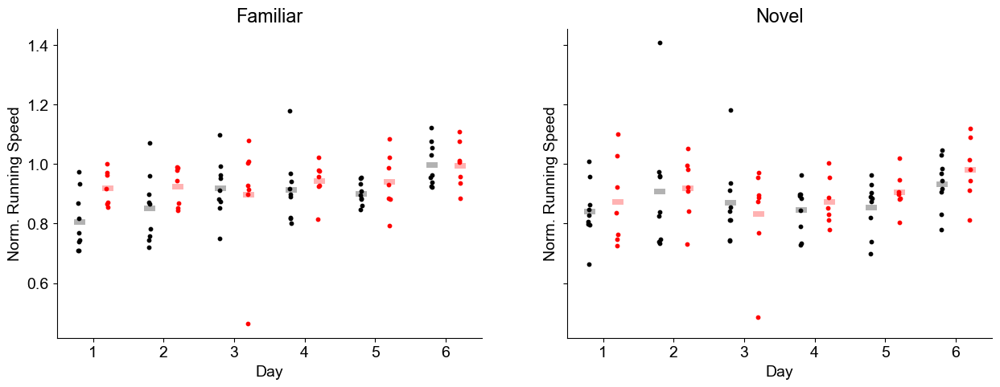

In [497]:
fig, ax = plt.subplots(1,2, figsize=[15,5], sharey=True)

lw = 5
s = 10
fam_key = 'fam_speed'
nov_key = 'nov_speed'
for day in range(6):
    
    mask = (df['cond']=='ctrl') & (df['day']==day)# & (df['nov']==False)
    lr = df[fam_key].loc[mask]._values
    ax[0].scatter(5*day -1 + np.linspace(-0.05, 0.05, num=lr.shape[0]), lr, color='black', s=s)
    ax[0].plot(5*day -1 + np.array([-0.2, .2]), lr.mean()*np.ones([2,]), color='black', linewidth=lw,alpha = .3)
    
    mask = (df['cond']=='ctrl') & (df['day']==day)# & (df['nov']==True)
    lr = df[nov_key].loc[mask]._values
    ax[1].scatter(5*day -1 + np.linspace(-0.05, 0.05, num=lr.shape[0]), lr, color='black', s=s, alpha = 1)
    ax[1].plot(5*day -1 + np.array([-0.2, .2]), lr.mean()*np.ones([2,]), color='black', linewidth=lw,alpha = .3)
    
    mask = (df['cond']=='cre') & (df['day']==day)# & (df['nov']==False)
    lr = df[fam_key].loc[mask]._values
    ax[0].scatter(5*day +1 + np.linspace(-0.05, 0.05, num=lr.shape[0]), lr, color='red', s=s)
    ax[0].plot(5*day + 1 + np.array([-0.2, .2]), lr.mean()*np.ones([2,]), color='red', linewidth=lw,alpha = .3)
    
    mask = (df['cond']=='cre') & (df['day']==day)#& (df['nov']==True)
    lr = df[nov_key].loc[mask]._values
    ax[1].scatter(5*day +1 + np.linspace(-0.05, 0.05, num=lr.shape[0]), lr, color='red', s=s, alpha=1)
    ax[1].plot(5*day + 1 + np.array([-0.2, .2]), lr.mean()*np.ones([2,]), color='red', linewidth=lw,alpha = .3)
    
ax[0].set_title('Familiar')
ax[1].set_title('Novel')
    
for a in range(2):

    ax[a].set_xticks(np.arange(0,6*5,5))
    ax[a].set_xticklabels([x for x in range(1,7)])

    ax[a].spines['top'].set_visible(False)
    ax[a].spines['right'].set_visible(False)

    ax[a].set_ylabel('Norm. Running Speed')
    ax[a].set_xlabel('Day')

fig.savefig(os.path.join(fig_dir, 'baseline_norm_running_speed.pdf'))

In [498]:
# familiar
df['fam_rank'] = df['fam_speed'].rank()
aov_fam = pg.mixed_anova(data=df, within='day', between='cond', dv='fam_rank', subject='mouse')
print(aov_fam)

#nov
df['nov_rank'] = df['nov_speed'].rank()
aov_nov = pg.mixed_anova(data=df, within='day', between='cond', dv='nov_rank', subject='mouse')
print(aov_nov)

        Source            SS  DF1  DF2           MS         F     p-unc  \
0         cond   4609.523810    1   14  4609.523810  5.766293  0.030792   
1          day  13649.000000    5   70  2729.800000  4.474708  0.001352   
2  Interaction   1566.428571    5   70   313.285714  0.513540  0.765135   

        np2       eps  
0  0.291724       NaN  
1  0.242207  0.770775  
2  0.035384       NaN  
        Source           SS  DF1  DF2           MS         F     p-unc  \
0         cond  1710.095238    1   14  1710.095238  1.193809  0.293008   
1          day  8370.875000    5   70  1674.175000  2.709618  0.026951   
2  Interaction   333.982143    5   70    66.796429  0.108109  0.990182   

        np2       eps  
0  0.078572       NaN  
1  0.162159  0.758614  
2  0.007663       NaN  


In [503]:
# Create familiar dataframe
df_fam = df[['mouse', 'cond', 'day', 'fam_rank']].copy()
df_fam['trial_type'] = 'fam'
df_fam['rank'] = df_fam['fam_rank']
df_fam = df_fam.drop('fam_rank', axis=1)

# Create novel dataframe
df_nov = df[['mouse', 'cond', 'day', 'nov_rank']].copy()
df_nov['trial_type'] = 'nov'
df_nov['rank'] = df_nov['nov_rank']
df_nov = df_nov.drop('nov_rank', axis=1)

# Combine them
df_long = pd.concat([df_fam, df_nov], ignore_index=True)

print(df_long.head())


       mouse cond  day trial_type  rank
0  4467975.1  cre    0        fam  46.0
1  4467975.2  cre    0        fam  24.0
2  4467975.3  cre    0        fam  66.0
3  4467975.4  cre    0        fam  70.0
4  4467975.5  cre    0        fam  79.0


In [509]:
smf.mixedlm('rank ~ C(cond) * C(trial_type) + C(day)', df_long, groups=df_long['mouse'])

result = model.fit()

# Print the summary of the results
print(result.summary())

           Mixed Linear Model Regression Results
Model:               MixedLM  Dependent Variable:  nov_rank 
No. Observations:    96       Method:              REML     
No. Groups:          16       Scale:               581.1261 
Min. group size:     6        Log-Likelihood:      -425.7408
Max. group size:     6        Converged:           Yes      
Mean group size:     6.0                                    
------------------------------------------------------------
                 Coef.  Std.Err.   z    P>|z|  [0.025 0.975]
------------------------------------------------------------
Intercept        44.973    8.023  5.605 0.000  29.248 60.699
C(cond)[T.ctrl]  -8.508    7.787 -1.093 0.275 -23.770  6.754
C(day)[T.1]      11.937    8.523  1.401 0.161  -4.767 28.642
C(day)[T.2]       2.500    8.523  0.293 0.769 -14.205 19.205
C(day)[T.3]       1.312    8.523  0.154 0.878 -15.392 18.017
C(day)[T.4]       6.937    8.523  0.814 0.416  -9.767 23.642
C(day)[T.5]      27.187    8.523  3.

### Speed CV over whole track

In [393]:
sess.trial_info['LR'].shape

(64,)

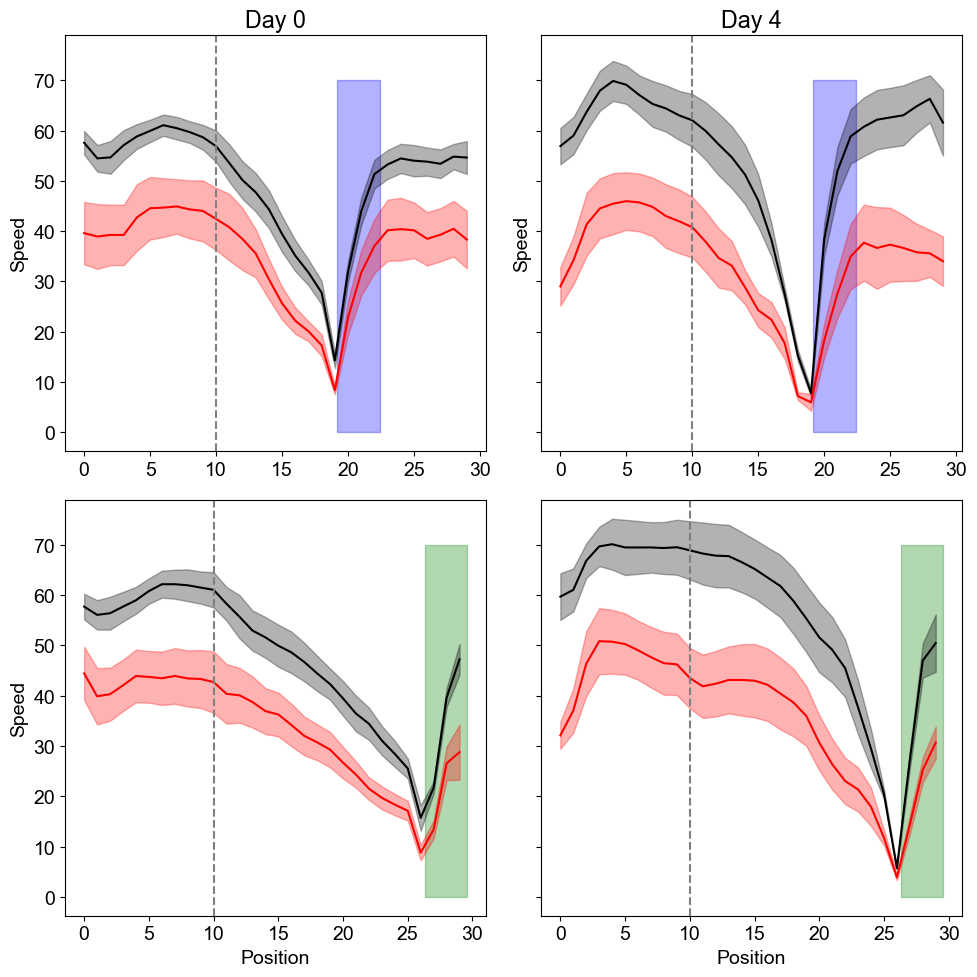

In [409]:
fig, ax = plt.subplots(2,2,figsize=[10,10], sharey=True)
plt.rcParams['font.family'] = 'Arial'

ko_lr = {}
ctrl_lr = {}
days = [0,4]
for d_idx, day in enumerate(days):
    
    ctrl_lr[day] = {'left': [], 'right': []}
    ko_lr[day] = {'left': [], 'right': []}
    
    left_traces_ctrl = []
    right_traces_ctrl = []
    left_traces_ko = []
    right_traces_ko = []

    for i, mouse in enumerate(ctrl_mice):
        sess = u.load_vr_day(mouse, day, trial_mat_keys=('licks','nonconsum_licks','speed'), verbose=False)
        
        bin_centers = sess.trial_matrices['bin_centers'] - 13.5  # shift so start=0
        left_trace =  sess.trial_matrices['speed'][sess.trial_info['LR'] == -1, :].mean(axis=0)
        right_trace =  sess.trial_matrices['speed'][sess.trial_info['LR'] == 1, :].mean(axis=0)
        
        left_traces_ctrl.append(left_trace)
        right_traces_ctrl.append(right_trace)

        if i == 0:
            ax[1, d_idx].fill_betweenx([0, 70], sess.rzone_late['tfront']-13.5, sess.rzone_late['tback']-13.5,
                                       zorder=0, color='green', alpha=.3)
            ax[0, d_idx].fill_betweenx([0, 70], sess.rzone_early['tfront']-13.5, sess.rzone_early['tback']-13.5,
                                       zorder=0, color='blue', alpha=.3)
            
            t_bins = sess.trial_matrices['bin_edges'][1:]
            rzone_early = (t_bins >= sess.rzone_early['tfront'] - 3) & (t_bins <= sess.rzone_early['tfront'])
            rzone_late  = (t_bins >= sess.rzone_late['tfront'] - 3) & (t_bins <= sess.rzone_late['tfront'])

        ctrl_lr[day]['left'].append( np.nanmean(sess.trial_matrices['speed'][sess.trial_info['LR'] == -1, :][:, rzone_early]))
        ctrl_lr[day]['right'].append( np.nanmean(sess.trial_matrices['speed'][sess.trial_info['LR'] == 1, :][:, rzone_late]))
    
    for i, mouse in enumerate(ko_mice):
        try:
            sess = u.load_vr_day(mouse, day, verbose=False)
            bin_centers = sess.trial_matrices['bin_centers'] - 13.5
            trial_mask = sess.trial_info['LR'] == -1
            if day == 0 and i == 3:
                trial_mask[35:66] = False

            left_trace =  sess.trial_matrices['speed'][trial_mask, :].mean(axis=0)
            right_trace =  sess.trial_matrices['speed'][sess.trial_info['LR'] == 1, :].mean(axis=0)
            
            left_traces_ko.append(left_trace)
            right_traces_ko.append(right_trace)

            ko_lr[day]['left'].append(np.nanmean(sess.trial_matrices['speed'][trial_mask, :][:, rzone_early]))
            ko_lr[day]['right'].append( np.nanmean(sess.trial_matrices['speed'][sess.trial_info['LR'] == 1, :][:, rzone_late]))
        except:
            pass

    def mean_sem(traces):
        traces = np.array(traces)
        mu = np.nanmean(traces, axis=0)
        sem = sp.stats.sem(traces, axis=0, nan_policy='omit')
        return mu, sem
    
    # Control
    ctrl_left_mean, ctrl_left_sem = mean_sem(left_traces_ctrl)
    ctrl_right_mean, ctrl_right_sem = mean_sem(right_traces_ctrl)
    
    ax[0, d_idx].plot(bin_centers, ctrl_left_mean, color='black')
    ax[0, d_idx].fill_between(bin_centers, ctrl_left_mean - ctrl_left_sem, ctrl_left_mean + ctrl_left_sem,
                              color='black', alpha=0.3)
    ax[1, d_idx].plot(bin_centers, ctrl_right_mean, color='black')
    ax[1, d_idx].fill_between(bin_centers, ctrl_right_mean - ctrl_right_sem, ctrl_right_mean + ctrl_right_sem,
                              color='black', alpha=0.3)

    # KO
    ko_left_mean, ko_left_sem = mean_sem(left_traces_ko)
    ko_right_mean, ko_right_sem = mean_sem(right_traces_ko)
    
    ax[0, d_idx].plot(bin_centers, ko_left_mean, color='red')
    ax[0, d_idx].fill_between(bin_centers, ko_left_mean - ko_left_sem, ko_left_mean + ko_left_sem,
                              color='red', alpha=0.3)
    ax[1, d_idx].plot(bin_centers, ko_right_mean, color='red')
    ax[1, d_idx].fill_between(bin_centers, ko_right_mean - ko_right_sem, ko_right_mean + ko_right_sem,
                              color='red', alpha=0.3)
    
    # Add dashed vertical line
    ax[0, d_idx].axvline(10, color='gray', linestyle='--')
    ax[1, d_idx].axvline(10, color='gray', linestyle='--')
    
    # Titles
    ax[0, d_idx].set_title(f'Day {day}')
    ax[1, d_idx].set_xlabel('Position')
    ax[0, d_idx].set_ylabel('Speed')
    ax[1, 0].set_ylabel('Speed')

    # ax[0,d_idx].set_ylim(0,3)
    

plt.tight_layout()
plt.show()
fig.savefig(os.path.join(fig_dir, 'speed_day1_day5.pdf'))


{'date': '29_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 0}
{'date': '29_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': 1, 'ravel_ind': 0}
{'date': '29_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 8, 'novel_arm': -1, 'ravel_ind': 0}
{'date': '29_11_2020', 'scene': 'YMaze_LNovel', 'session': 2, 'scan': 18, 'novel_arm': 1, 'ravel_ind': 1}
{'date': '29_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': -1, 'ravel_ind': 0}
{'date': '14_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 0}
{'date': '14_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': -1, 'ravel_ind': 0}
{'date': '14_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 0}
{'date': '15_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 0}
({'date': '28_09_2020', 'scene': 'YMaze_LNovel', '

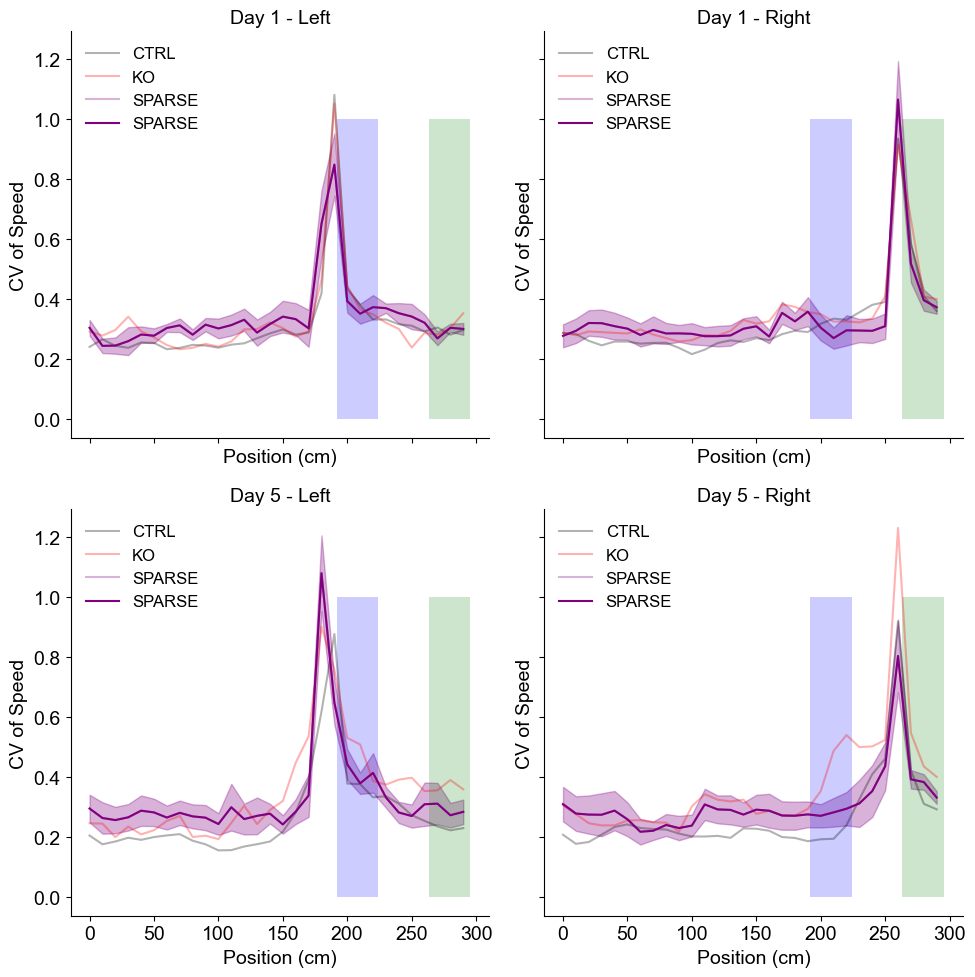

In [408]:
import scipy as sp

fig, axes = plt.subplots(2, 2, figsize=(10, 10), sharex=True, sharey=True)
days = [0, 4]
colors = {'CTRL': 'black', 'KO': 'red', 'SPARSE': 'purple'}
plt.rcParams['font.family'] = 'Arial'


for d_ind, day in enumerate(days):
    for lr_ind, lr in enumerate([-1, 1]):
        ax = axes[d_ind, lr_ind]

        for group, mice, color in zip(['CTRL', 'KO', 'SPARSE'], [ctrl_mice, ko_mice, sparse_mice], colors.values()):
            group_cv = []

            for mouse in mice:
                try:
                    sess = u.load_vr_day(mouse, day=day)
                    n_bins = sess.trial_matrices['speed'].shape[1]
                    trial_mask = sess.trial_info['LR'] == lr
                    trial_speeds = sess.trial_matrices['speed'][trial_mask, :]

                    if trial_speeds.size == 0:
                        cv = np.full(n_bins, np.nan)
                    else:
                        mean_per_bin = np.nanmean(trial_speeds, axis=0)
                        std_per_bin = np.nanstd(trial_speeds, axis=0)
                        with np.errstate(divide='ignore', invalid='ignore'):
                            cv = std_per_bin / mean_per_bin
                        cv = np.where(mean_per_bin == 0, np.nan, cv)

                    group_cv.append(cv)
                except Exception:
                    pass

            if len(group_cv) > 0:
                arr = np.array(group_cv)
                mu = np.nanmean(arr, axis=0)
                sem = sp.stats.sem(arr, axis=0, nan_policy='omit')
                x = (sess.trial_matrices['bin_centers']-13.5) * 10

                ax.plot(x, mu, color=color, label=group, alpha=0.3)
                if mice == sparse_mice:
                    ax.plot(x, mu, color=color, label=group)
                    ax.fill_between(x, mu - sem, mu + sem, color=color, alpha=0.3)

        ax.fill_betweenx(
            [0, 1],
            (sess.rzone_early['tfront']-13.5) * 10,
            (sess.rzone_early['tback']-13.5) * 10,
            color="blue", alpha=0.2, linewidth=0
        )
        ax.fill_betweenx(
            [0, 1],
            (sess.rzone_late['tfront']-13.5) * 10,
            (sess.rzone_late['tback']-13.5) * 10,
            color="green", alpha=0.2, linewidth=0
        )

        ax.set_title(f'Day {day+1} - {"Left" if lr==-1 else "Right"}', fontsize=14)
        ax.set_xlabel('Position (cm)', fontsize=14)
        ax.set_ylabel('CV of Speed', fontsize=14)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.legend(frameon=False, fontsize=12)

# Consistent layout
plt.tight_layout()
plt.show()
fig.savefig(os.path.join(fig_dir, 'CV_wholetrack_day1_day5_sparse.pdf'))


{'date': '29_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': -1, 'ravel_ind': 0}
{'date': '29_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': 1, 'ravel_ind': 0}
{'date': '29_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 8, 'novel_arm': -1, 'ravel_ind': 0}
{'date': '29_11_2020', 'scene': 'YMaze_LNovel', 'session': 2, 'scan': 18, 'novel_arm': 1, 'ravel_ind': 1}
{'date': '29_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel_arm': -1, 'ravel_ind': 0}
{'date': '14_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 0}
{'date': '14_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': -1, 'ravel_ind': 0}
{'date': '14_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 0}
{'date': '15_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 0}
({'date': '28_09_2020', 'scene': 'YMaze_LNovel', '

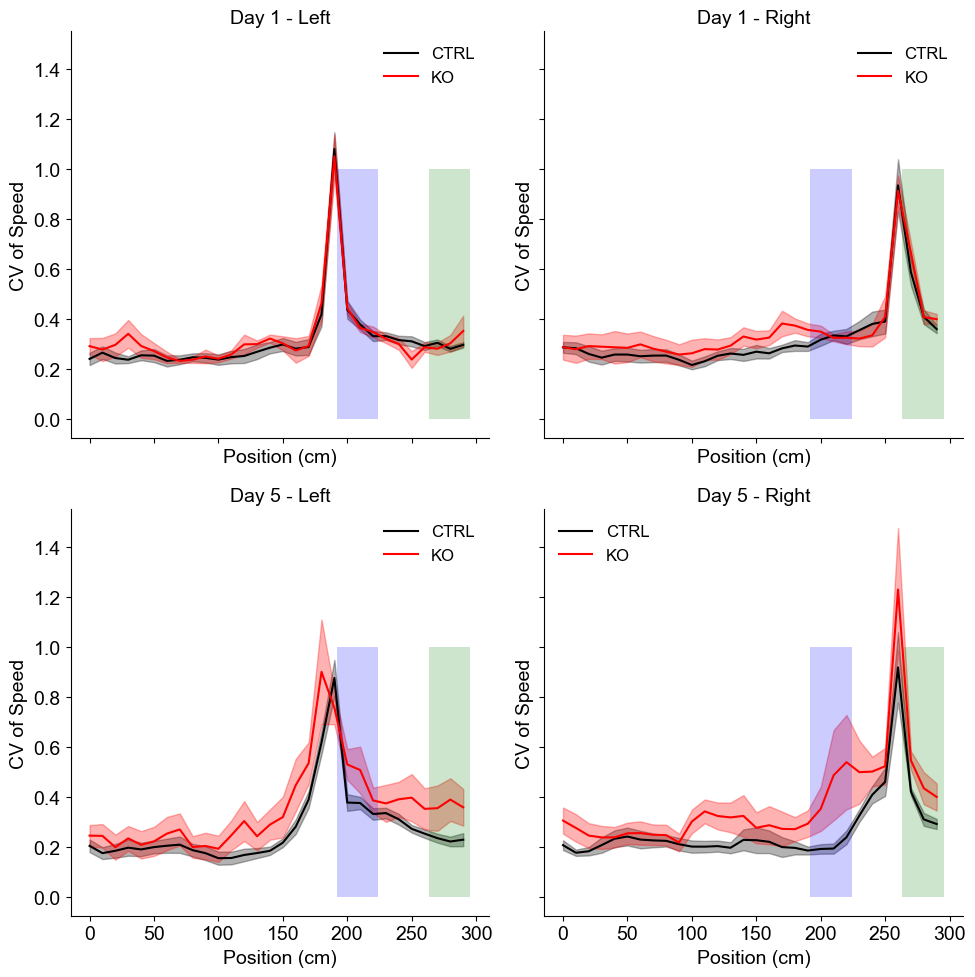

In [405]:
import scipy as sp

fig, axes = plt.subplots(2, 2, figsize=(10, 10), sharex=True, sharey=True)
days = [0, 4]
colors = {'CTRL': 'black', 'KO': 'red'}
plt.rcParams['font.family'] = 'Arial'


for d_ind, day in enumerate(days):
    for lr_ind, lr in enumerate([-1, 1]):
        ax = axes[d_ind, lr_ind]

        for group, mice, color in zip(['CTRL', 'KO'], [ctrl_mice, ko_mice], colors.values()):
            group_cv = []

            for mouse in mice:
                try:
                    sess = u.load_vr_day(mouse, day=day)
                    n_bins = sess.trial_matrices['speed'].shape[1]
                    trial_mask = sess.trial_info['LR'] == lr
                    trial_speeds = sess.trial_matrices['speed'][trial_mask, :]

                    if trial_speeds.size == 0:
                        cv = np.full(n_bins, np.nan)
                    else:
                        mean_per_bin = np.nanmean(trial_speeds, axis=0)
                        std_per_bin = np.nanstd(trial_speeds, axis=0)
                        with np.errstate(divide='ignore', invalid='ignore'):
                            cv = std_per_bin / mean_per_bin
                        cv = np.where(mean_per_bin == 0, np.nan, cv)

                    group_cv.append(cv)
                except Exception:
                    pass

            if len(group_cv) > 0:
                arr = np.array(group_cv)
                mu = np.nanmean(arr, axis=0)
                sem = sp.stats.sem(arr, axis=0, nan_policy='omit')
                x = (sess.trial_matrices['bin_centers']-13.5) * 10

                ax.plot(x, mu, color=color, label=group)
                ax.fill_between(x, mu - sem, mu + sem, color=color, alpha=0.3)

        ax.fill_betweenx(
            [0, 1],
            (sess.rzone_early['tfront']-13.5) * 10,
            (sess.rzone_early['tback']-13.5) * 10,
            color="blue", alpha=0.2, linewidth=0
        )
        ax.fill_betweenx(
            [0, 1],
            (sess.rzone_late['tfront']-13.5) * 10,
            (sess.rzone_late['tback']-13.5) * 10,
            color="green", alpha=0.2, linewidth=0
        )

        ax.set_title(f'Day {day+1} - {"Left" if lr==-1 else "Right"}', fontsize=14)
        ax.set_xlabel('Position (cm)', fontsize=14)
        ax.set_ylabel('CV of Speed', fontsize=14)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.legend(frameon=False, fontsize=12)

# Consistent layout
plt.tight_layout()
plt.show()
fig.savefig(os.path.join(fig_dir, 'CV_wholetrack_day1_day5.pdf'))


In [402]:
sess.vr_data

,time,trialnum,t,posx,posz,dz,lick,reward,tstart,teleport,scanning,manrewards,LR,cmd
0,0.000000,0,-1000.000000,0.0000,-5.000000,0.000000,0,0,0.0,0.0,0,0,-1,0
1,0.020000,0,6.708204,0.0000,-25.000000,0.874493,0,0,0.0,0.0,0,0,-1,0
2,0.353333,0,6.708204,0.0000,-25.000000,0.972152,0,0,0.0,0.0,0,0,-1,0
3,0.385454,0,6.708204,0.0000,-25.000000,0.097659,0,0,0.0,0.0,0,0,-1,0
4,0.398656,0,6.708204,0.0000,-25.000000,0.039951,0,0,0.0,0.0,0,0,-1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
196843,2583.750000,63,42.116010,-101.8368,251.128800,0.044391,0,0,0.0,0.0,1,0,-1,2
196844,2583.763000,63,42.164840,-102.2396,251.507400,0.048830,0,0,0.0,0.0,1,0,-1,2
196845,2583.775000,63,42.209230,-102.6050,251.851500,0.044391,0,0,0.0,1.0,1,0,-1,2
196846,2583.788000,64,11.229170,0.0000,-4.857502,0.048830,0,0,0.0,0.0,1,0,-1,2


In [181]:
def compute_cv(sess):
    """
    Coefficient of variation (CV = std / mean) of speed across trials

    """
    n_bins = sess.trial_matrices['speed'].shape[1]
    cv_dict = {}

    for lr in [-1, 1]:  # LEeft -1 Right 1
        trial_mask = sess.trial_info['LR'] == lr
        trial_speeds = sess.trial_matrices['speed'][trial_mask, :]

        if trial_speeds.size == 0 or trial_speeds.shape[0] == 0:
            cv = np.full(n_bins, np.nan)

        else:
            mean_per_bin = np.nanmean(trial_speeds, axis=0)
            std_per_bin = np.nanstd(trial_speeds, axis=0)

            # CV calculation 
            with np.errstate(divide='ignore', invalid='ignore'):
                cv = std_per_bin / mean_per_bin
            cv = np.where(mean_per_bin == 0, np.nan, cv)

        cv_dict[lr] = cv

    return cv_dict


### sparse lick rate as function of position

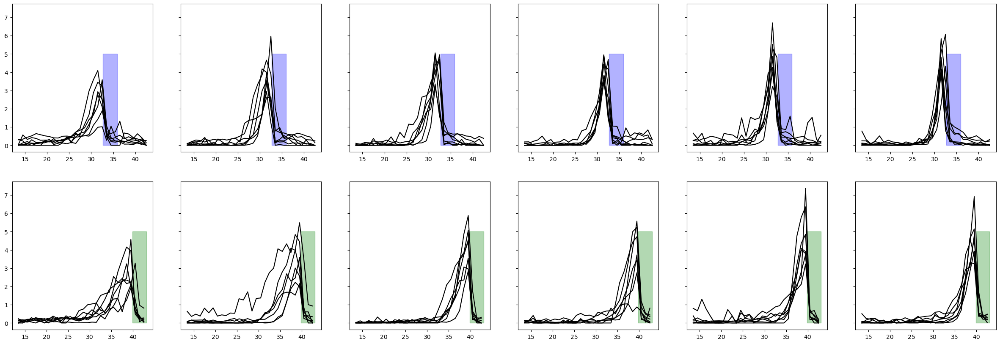

In [268]:
fig, ax = plt.subplots(2,6,figsize=[30,10], sharey=True)

sparse_lr = {}
for day in range(6):
    
    sparse_lr[day]={'left':[],'right':[]}
    for i, mouse in enumerate(sparse_mice):
        sess = u.load_vr_day(mouse,day, trial_mat_keys = ('licks','nonconsum_licks','speed'),verbose = False)
        
        ax[0,day].plot(sess.trial_matrices['bin_centers'], dt*sess.trial_matrices['licks'][sess.trial_info['LR']==-1,:].mean(axis=0),color='black')
        ax[1,day].plot(sess.trial_matrices['bin_centers'], dt*sess.trial_matrices['licks'][sess.trial_info['LR']==1,:].mean(axis=0),color='black')
        
        if i == 0:
            ax[1,day].fill_betweenx([0,5], sess.rzone_late['tfront'], sess.rzone_late['tback'],zorder=0, color='green',alpha=.3)
            ax[0,day].fill_betweenx([0,5],sess.rzone_early['tfront'], sess.rzone_early['tback'],zorder=0, color='blue',alpha=.3)
            
            t_bins = sess.trial_matrices['bin_edges'][1:]
            rzone_early = (t_bins>=sess.rzone_early['tfront']-3)*(t_bins<=sess.rzone_early['tfront'])
            rzone_late = (t_bins>=sess.rzone_late['tfront']-3)*(t_bins<=sess.rzone_late['tfront'])
            
        sparse_lr[day]['left'].append(dt*np.nanmean(sess.trial_matrices['licks'][sess.trial_info['LR']==-1,:][:,rzone_early]))
        sparse_lr[day]['right'].append(dt*np.nanmean(sess.trial_matrices['licks'][sess.trial_info['LR']==1,:][:,rzone_late]))
        
   

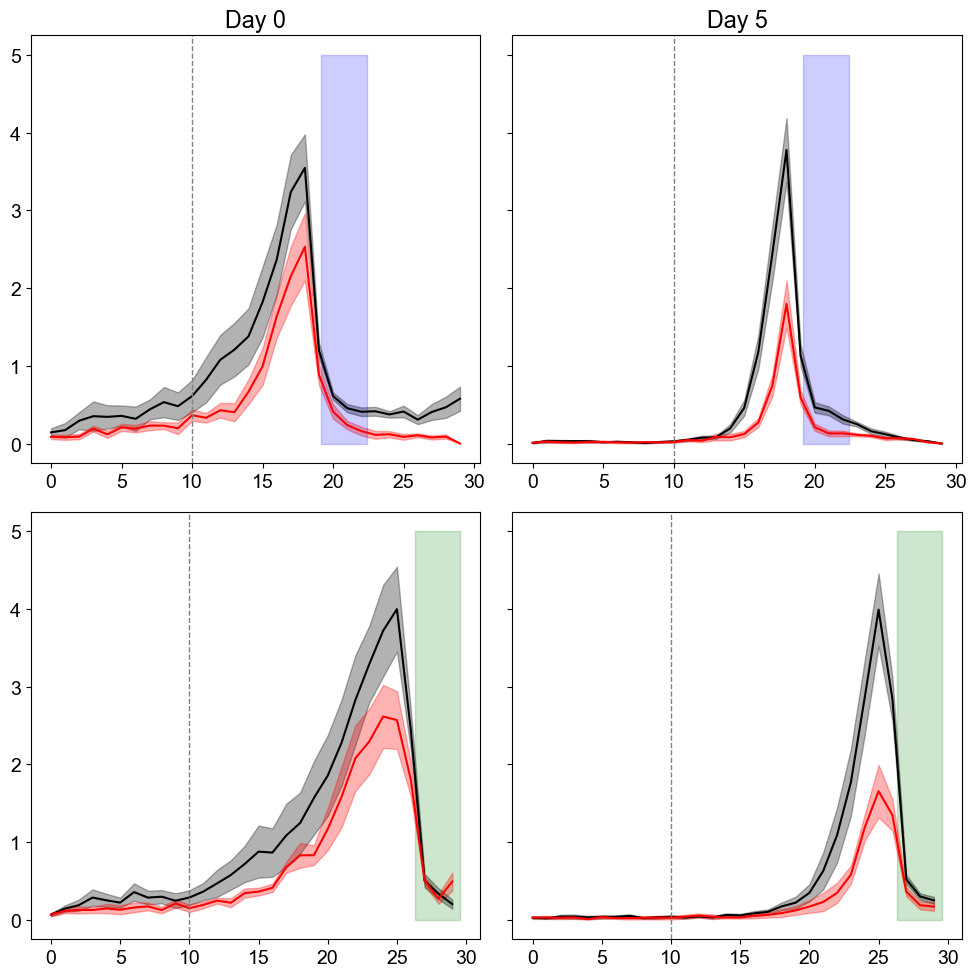

In [321]:
fig, ax = plt.subplots(2, 2, figsize=[10, 10], sharey=True)
days = [0, 5]

for d, day in enumerate(days):
    ctrl_left, ctrl_right = [], []
    ko_left, ko_right = [], []

    rzone_early = rzone_late = None

    for i, mouse in enumerate(ctrl_mice):
        sess = u.load_vr_day(mouse, day, trial_mat_keys=('licks','nonconsum_licks','speed'), verbose=False)

        left_trace = dt * sess.trial_matrices['nonconsum_licks'][sess.trial_info['LR']==-1, :].mean(axis=0)
        right_trace = dt * sess.trial_matrices['nonconsum_licks'][sess.trial_info['LR']==1, :].mean(axis=0)

        ctrl_left.append(left_trace)
        ctrl_right.append(right_trace)

        if i == 0:
            ax[0, 0].fill_betweenx([0,5], sess.rzone_early['tfront']-13.5, sess.rzone_early['tback']-13.5, color='blue', alpha=0.1)
            ax[0, 1].fill_betweenx([0,5], sess.rzone_early['tfront']-13.5, sess.rzone_early['tback']-13.5, color='blue', alpha=0.1)
            ax[1, 1].fill_betweenx([0,5], sess.rzone_late['tfront']-13.5, sess.rzone_late['tback']-13.5, color='green', alpha=0.1)
            ax[1, 0].fill_betweenx([0,5], sess.rzone_late['tfront']-13.5, sess.rzone_late['tback']-13.5, color='green', alpha=0.1)

            t_bins = sess.trial_matrices['bin_edges'][1:]
            rzone_early = (t_bins >= sess.rzone_early['tfront'] - 3) & (t_bins <= sess.rzone_early['tfront'])
            rzone_late  = (t_bins >= sess.rzone_late['tfront'] - 3) & (t_bins <= sess.rzone_late['tfront'])

    for i, mouse in enumerate(ko_mice):
        try:
            sess = u.load_vr_day(mouse, day, verbose=False)
            trial_mask = sess.trial_info['LR'] == -1

            if day == 0 and i == 3:
                trial_mask[35:66] = False  

            left_trace = dt * sess.trial_matrices['nonconsum_licks'][trial_mask,:].mean(axis=0)
            right_trace = dt * sess.trial_matrices['nonconsum_licks'][sess.trial_info['LR']==1,:].mean(axis=0)

            ko_left.append(left_trace)
            ko_right.append(right_trace)
        except:
            pass

    bin_centers = sess.trial_matrices['bin_centers'] -13.5

    def mean_sem(arr):
        arr = np.vstack(arr)
        mean = np.nanmean(arr, axis=0)
        sem = np.nanstd(arr, axis=0) / np.sqrt(arr.shape[0])
        return mean, sem

    ctrl_left_mean, ctrl_left_sem = mean_sem(ctrl_left)
    ctrl_right_mean, ctrl_right_sem = mean_sem(ctrl_right)
    ko_left_mean, ko_left_sem = mean_sem(ko_left)
    ko_right_mean, ko_right_sem = mean_sem(ko_right)

    right_ax = ax[0,d]
    left_ax = ax[1,d]

    ax[0, d].plot(bin_centers, ctrl_left_mean, color='black')
    ax[0, d].fill_between(bin_centers, ctrl_left_mean-ctrl_left_sem, ctrl_left_mean+ctrl_left_sem, color='black', alpha=0.3)

    ax[0, d].plot(bin_centers, ko_left_mean, color='red')
    ax[0, d].fill_between(bin_centers, ko_left_mean-ko_left_sem, ko_left_mean+ko_left_sem, color='red', alpha=0.3)

    ax[1, d].plot(bin_centers, ctrl_right_mean, color='black')
    ax[1, d].fill_between(bin_centers, ctrl_right_mean-ctrl_right_sem, ctrl_right_mean+ctrl_right_sem, color='black', alpha=0.3)

    ax[1, d].plot(bin_centers, ko_right_mean, color='red')
    ax[1, d].fill_between(bin_centers, ko_right_mean-ko_right_sem, ko_right_mean+ko_right_sem, color='red', alpha=0.3)

    ax[0, d].set_title(f"Day {day}")

    right_ax.axvline(x=10, linestyle='--', linewidth=1, color = 'grey')
    left_ax.axvline(x=10, linestyle='--', linewidth=1, color = 'grey')

fig.tight_layout()
fig.savefig(os.path.join(fig_dir, 'day0_day6_lickrate.pdf'))

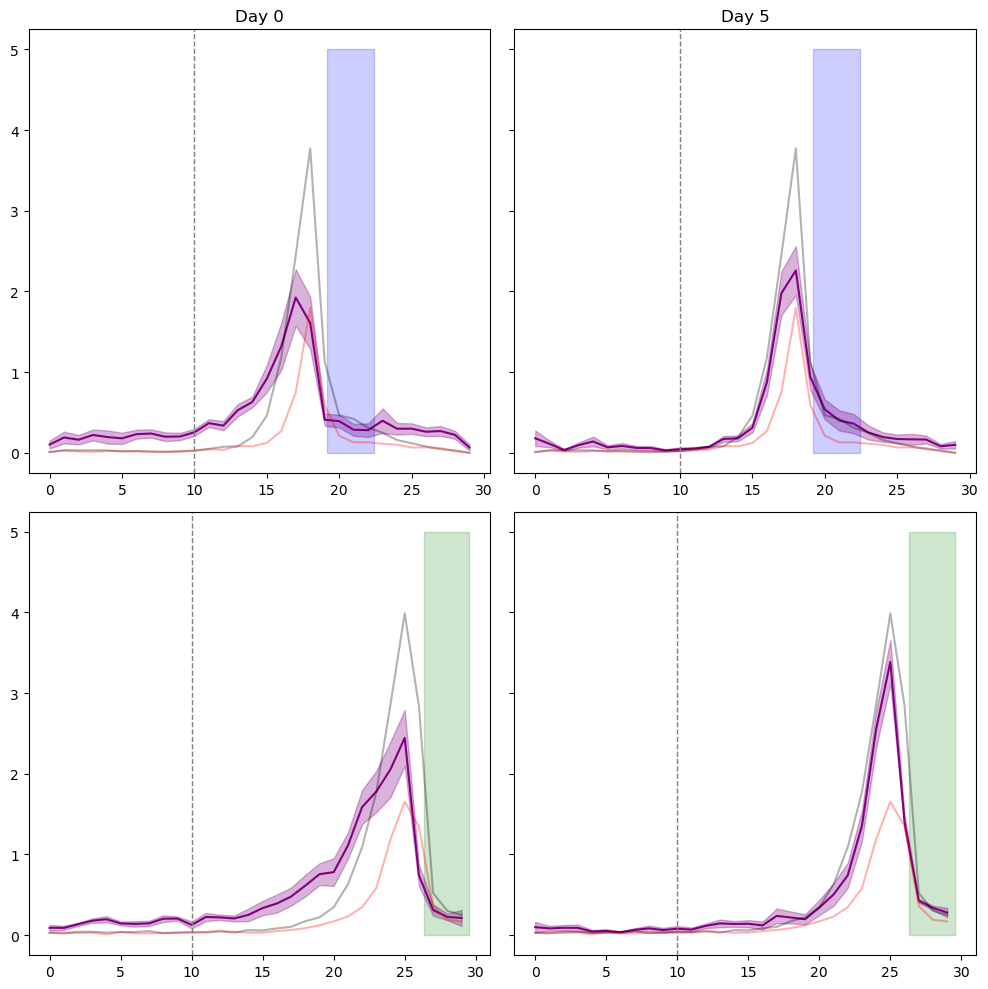

In [66]:
fig, ax = plt.subplots(2, 2, figsize=[10, 10], sharey=True)
days = [0, 5]

for d, day in enumerate(days):
    sparse_left, sparse_right = [], []

    rzone_early = rzone_late = None

    for i, mouse in enumerate(sparse_mice):
        sess = u.load_vr_day(mouse, day, trial_mat_keys=('licks','nonconsum_licks','speed'), verbose=False)

        left_trace = dt * sess.trial_matrices['nonconsum_licks'][sess.trial_info['LR']==-1, :].mean(axis=0)
        right_trace = dt * sess.trial_matrices['nonconsum_licks'][sess.trial_info['LR']==1, :].mean(axis=0)

        sparse_left.append(left_trace)
        sparse_right.append(right_trace)

        if i == 0:
            ax[0, 0].fill_betweenx([0,5], sess.rzone_early['tfront']-13.5, sess.rzone_early['tback']-13.5, color='blue', alpha=0.1)
            ax[0, 1].fill_betweenx([0,5], sess.rzone_early['tfront']-13.5, sess.rzone_early['tback']-13.5, color='blue', alpha=0.1)
            ax[1, 1].fill_betweenx([0,5], sess.rzone_late['tfront']-13.5, sess.rzone_late['tback']-13.5, color='green', alpha=0.1)
            ax[1, 0].fill_betweenx([0,5], sess.rzone_late['tfront']-13.5, sess.rzone_late['tback']-13.5, color='green', alpha=0.1)

            t_bins = sess.trial_matrices['bin_edges'][1:]
            rzone_early = (t_bins >= sess.rzone_early['tfront'] - 3) & (t_bins <= sess.rzone_early['tfront'])
            rzone_late  = (t_bins >= sess.rzone_late['tfront'] - 3) & (t_bins <= sess.rzone_late['tfront'])

    bin_centers = sess.trial_matrices['bin_centers'] -13.5

    def mean_sem(arr):
        arr = np.vstack(arr)
        mean = np.nanmean(arr, axis=0)
        sem = np.nanstd(arr, axis=0) / np.sqrt(arr.shape[0])
        return mean, sem

    sparse_left_mean, sparse_left_sem = mean_sem(sparse_left)
    sparse_right_mean, sparse_right_sem = mean_sem(sparse_right)

    right_ax = ax[0,d]
    left_ax = ax[1,d]

    ax[0, d].plot(bin_centers, sparse_left_mean, color='purple')
    ax[0, d].fill_between(bin_centers, sparse_left_mean-sparse_left_sem, sparse_left_mean+sparse_left_sem, color='purple', alpha=0.3)

    ax[1, d].plot(bin_centers, sparse_right_mean, color='purple')
    ax[1, d].fill_between(bin_centers, sparse_right_mean-sparse_right_sem, sparse_right_mean+sparse_right_sem, color='purple', alpha=0.3)

    ax[0, d].plot(bin_centers, ctrl_left_mean, color='black',alpha=0.3)
    ax[0, d].plot(bin_centers, ko_left_mean, color='red',alpha=0.3)
    ax[1, d].plot(bin_centers, ctrl_right_mean, color='black',alpha=0.3)
    ax[1, d].plot(bin_centers, ko_right_mean, color='red',alpha=0.3)

    ax[0, d].set_title(f"Day {day}")

    right_ax.axvline(x=10, linestyle='--', linewidth=1, color = 'grey')
    left_ax.axvline(x=10, linestyle='--', linewidth=1, color = 'grey')

fig.tight_layout()
fig.savefig(os.path.join(fig_dir, 'sparse_lickrate.pdf'))

### total licks

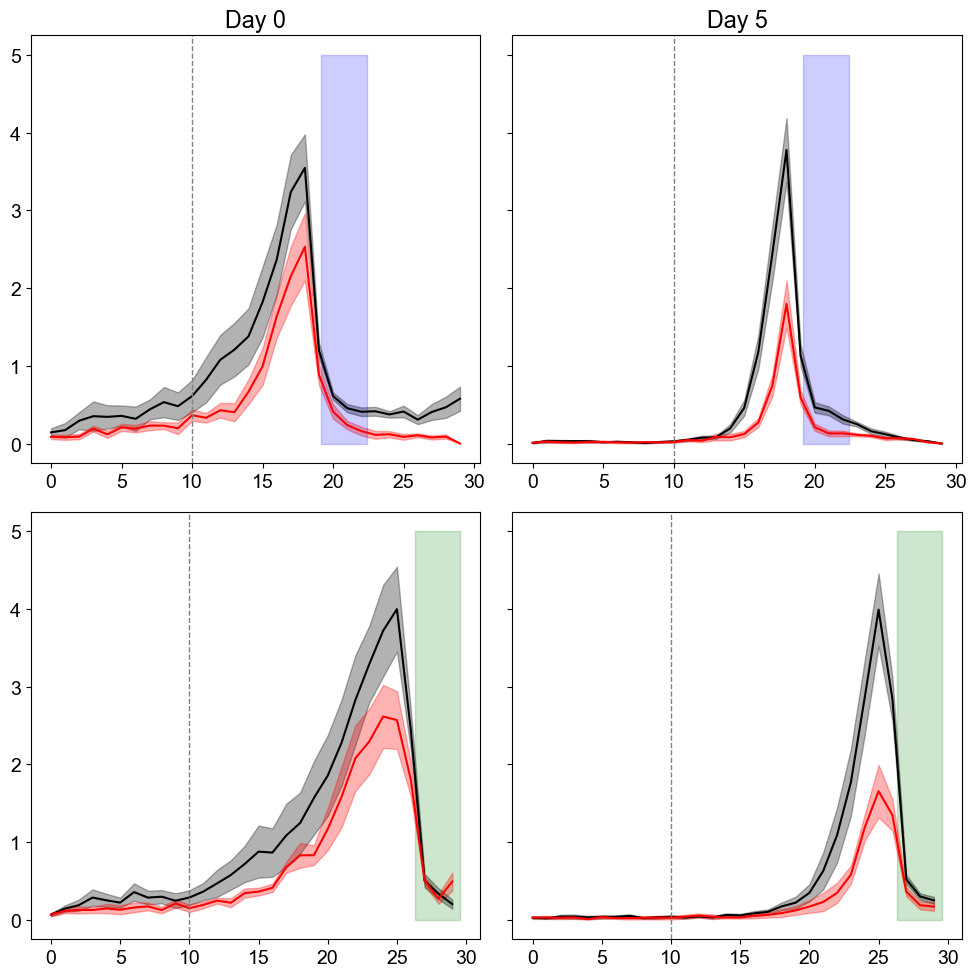

In [300]:
fig, ax = plt.subplots(2, 2, figsize=[10, 10], sharey=True)
days = [0, 5]

for d, day in enumerate(days):
    ctrl_left, ctrl_right = [], []
    ko_left, ko_right = [], []

    rzone_early = rzone_late = None

    for i, mouse in enumerate(ctrl_mice):
        sess = u.load_vr_day(mouse, day, trial_mat_keys=('licks','nonconsum_licks','speed'), verbose=False)

        left_trace = dt * sess.trial_matrices['nonconsum_licks'][sess.trial_info['LR']==-1, :].mean(axis=0)
        right_trace = dt * sess.trial_matrices['nonconsum_licks'][sess.trial_info['LR']==1, :].mean(axis=0)

        ctrl_left.append(left_trace)
        ctrl_right.append(right_trace)

        if i == 0:
            ax[0, 0].fill_betweenx([0,5], sess.rzone_early['tfront']-13.5, sess.rzone_early['tback']-13.5, color='blue', alpha=0.1)
            ax[0, 1].fill_betweenx([0,5], sess.rzone_early['tfront']-13.5, sess.rzone_early['tback']-13.5, color='blue', alpha=0.1)
            ax[1, 1].fill_betweenx([0,5], sess.rzone_late['tfront']-13.5, sess.rzone_late['tback']-13.5, color='green', alpha=0.1)
            ax[1, 0].fill_betweenx([0,5], sess.rzone_late['tfront']-13.5, sess.rzone_late['tback']-13.5, color='green', alpha=0.1)

            t_bins = sess.trial_matrices['bin_edges'][1:]
            rzone_early = (t_bins >= sess.rzone_early['tfront'] - 3) & (t_bins <= sess.rzone_early['tfront'])
            rzone_late  = (t_bins >= sess.rzone_late['tfront'] - 3) & (t_bins <= sess.rzone_late['tfront'])

    for i, mouse in enumerate(ko_mice):
        try:
            sess = u.load_vr_day(mouse, day, verbose=False)
            trial_mask = sess.trial_info['LR'] == -1

            if day == 0 and i == 3:
                trial_mask[35:66] = False  

            left_trace = dt * sess.trial_matrices['nonconsum_licks'][trial_mask,:].mean(axis=0)
            right_trace = dt * sess.trial_matrices['nonconsum_licks'][sess.trial_info['LR']==1,:].mean(axis=0)

            ko_left.append(left_trace)
            ko_right.append(right_trace)
        except:
            pass

    bin_centers = sess.trial_matrices['bin_centers'] -13.5

    def mean_sem(arr):
        arr = np.vstack(arr)
        mean = np.nanmean(arr, axis=0)
        sem = np.nanstd(arr, axis=0) / np.sqrt(arr.shape[0])
        return mean, sem

    ctrl_left_mean, ctrl_left_sem = mean_sem(ctrl_left)
    ctrl_right_mean, ctrl_right_sem = mean_sem(ctrl_right)
    ko_left_mean, ko_left_sem = mean_sem(ko_left)
    ko_right_mean, ko_right_sem = mean_sem(ko_right)

    right_ax = ax[0,d]
    left_ax = ax[1,d]

    ax[0, d].plot(bin_centers, ctrl_left_mean, color='black')
    ax[0, d].fill_between(bin_centers, ctrl_left_mean-ctrl_left_sem, ctrl_left_mean+ctrl_left_sem, color='black', alpha=0.3)

    ax[0, d].plot(bin_centers, ko_left_mean, color='red')
    ax[0, d].fill_between(bin_centers, ko_left_mean-ko_left_sem, ko_left_mean+ko_left_sem, color='red', alpha=0.3)

    ax[1, d].plot(bin_centers, ctrl_right_mean, color='black')
    ax[1, d].fill_between(bin_centers, ctrl_right_mean-ctrl_right_sem, ctrl_right_mean+ctrl_right_sem, color='black', alpha=0.3)

    ax[1, d].plot(bin_centers, ko_right_mean, color='red')
    ax[1, d].fill_between(bin_centers, ko_right_mean-ko_right_sem, ko_right_mean+ko_right_sem, color='red', alpha=0.3)

    ax[0, d].set_title(f"Day {day}")

    right_ax.axvline(x=10, linestyle='--', linewidth=1, color = 'grey')
    left_ax.axvline(x=10, linestyle='--', linewidth=1, color = 'grey')

fig.tight_layout()
fig.savefig(os.path.join(fig_dir, 'day0_day6_lickrate.pdf'))

### total licks in each bin

In [385]:
def correct_lick_sensor_error(licks_, trial_starts, trial_ends, correction_thr=0.5):
    """
    Find samples where lick detector was putatively stuck at 1, and set to NaN

    :param licks_:
    :type licks_:
    :param trial_starts:
    :type trial_starts:
    :param trial_ends:
    :type trial_ends:
    :param correction_thr:
    :type correction_thr:
    :return:
    :rtype:
    """
    licks = np.copy(licks_)
    error_count = 0
    for t_start, t_end in zip(trial_starts, trial_ends):
        # if >50% of samples have a cumulative lick count of >2
        # print(licks[t_start:t_end])
        if sum(licks[t_start:t_end] > 0)/len(licks[t_start:t_end]) > correction_thr:
            licks[t_start:t_end] = 0
            # print(f'setting trial {np.where(trial_starts==t_start)[0]} to NaN')
            error_count += 1

    return licks, error_count

In [386]:
def get_concat_total_licks(mouse, day, ko):
    if ko=='CTRL':
        d = ctrl_sessions[mouse][day]
    else:
        d = ko_sessions[mouse][day]
    sess_list = []
    vr_data = []
    for i, sess_info in enumerate(d):
        date, scene, sess_no, scan = sess_info['date'], sess_info['scene'], sess_info['session'], sess_info['scan']
        pkldir = os.path.join('C://Users/esay/data/Stx3/YMazeSessPkls/', mouse,  date, f'{scene}_{sess_no}.pkl')
        
        _sess = stx.session.YMazeSession.from_file(pkldir, verbose=False)
        err_lick, err = correct_lick_sensor_error(_sess.vr_data['lick'],_sess.trial_start_inds, _sess.teleport_inds, correction_thr=0.5) #correct for broken sensor
        _sess.add_timeseries(licks_rate = err_lick)
        _sess.add_pos_binned_trial_matrix('licks_rate')# ,speed_thr=.01, speed = sess.timeseries['speed_raw'].ravel())
        _sess.add_timeseries(licks=err_lick)
        _sess.timeseries['licks'][_sess.timeseries['licks']>1]=1
        _sess.add_pos_binned_trial_matrix('licks')

        licks = np.copy(_sess.timeseries['licks'])
        licks[licks>1]=1
        time = _sess.vr_data['time']

        reward_inds = np.argwhere(_sess.vr_data['reward']._values==1).ravel()
        for r in reward_inds:
            licks[0,((time-time[r])>=0)&((time-time[r])<2)] = 0
    
        _sess.add_timeseries(nonconsum_licks = licks)
        _sess.add_pos_binned_trial_matrix('nonconsum_licks')
        
        _sess.timeseries['total_licks'] = np.copy(_sess.timeseries['nonconsum_licks'])
        _sess.add_pos_binned_trial_matrix('total_licks',use_sum=True)

        sess_list.append(_sess)
        print(sess_list)
        
        data = _sess.vr_data
        df = data.copy()

        vr_data.append(df)
    vr = pd.concat(vr_data, ignore_index = True)
    sess = stx.session.ConcatYMazeSession(sess_list, None, day_inds=[0 for i in range(len(d))], trial_info_keys = ['LR', 'block_number'],
                                          trial_mat_keys=('speed','total_licks'),
                                          timeseries_keys=('licks', 'speed','total_licks'),
                                          run_place_cells=False)
    sess.vr_data = vr
    print(len(sess.vr_data))
    
    return sess

In [40]:
sess = get_concat_total_licks('4467332.2',1, ko='CTRL')

[<STX3KO_analyses.session.YMazeSession object at 0x00000224BA214880>, <STX3KO_analyses.session.YMazeSession object at 0x00000224B9E378E0>]
33190


c:\users\esay\repos\twoputils\TwoPUtils\sess.py:100: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:232: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.1/28_09_2020/YMaze_LNovel/YMaze_LNovel_001_003.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:241: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.1/28_09_2020/YMaze_LNovel/YMaze_LNovel_001_003.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


c:\users\esay\repos\twoputils\TwoPUtils\sess.py:100: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:232: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.1/28_09_2020/YMaze_LNovel/YMaze_LNovel_006_014.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:241: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.1/28_09_2020/YMaze_LNovel/YMaze_LNovel_006_014.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


[<STX3KO_analyses.session.YMazeSession object at 0x0000022484EFCFA0>, <STX3KO_analyses.session.YMazeSession object at 0x00000224977FADA0>]
34199
[<STX3KO_analyses.session.YMazeSession object at 0x0000022497828250>, <STX3KO_analyses.session.YMazeSession object at 0x0000022484C30040>]
33190
[<STX3KO_analyses.session.YMazeSession object at 0x0000022484C400A0>, <STX3KO_analyses.session.YMazeSession object at 0x0000022484C48100>]
27495


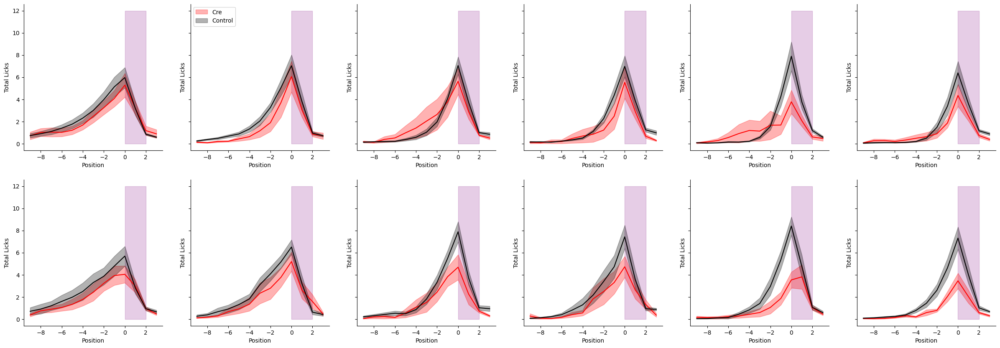

In [49]:
''' 
plotting ALL DAYS

'''

fig,ax = plt.subplots(2,2, figsize = [10, 10],sharey=True)


df = {'mouse':[],
      'ko':[],
      'day':[],
      'nov':[],
      'total_licks': [],
      }

key = 'total_licks'
if key in ('licks', 'nonconsum_licks'):
    alpha = dt
elif key in ('speed'):
    alpha = dt*10
else:
    alpha = 1.
ko_lr, ctrl_lr = {}, {}
for day in range(6):
    ko_lr[day] = {'fam':[],'nov':[]}
    
    x = np.arange(-10,3)
    for mouse in ko_mice:

        sess = u.load_vr_day(mouse,day, trial_mat_keys = ('licks','nonconsum_licks','licks_sum','speed'),verbose = False)
        if isinstance(sess, stx.session.ConcatYMazeSession):
            sess = get_concat_total_licks(mouse, day, ko='KO')
        else:
            sess.timeseries['total_licks'] = np.copy(sess.timeseries['nonconsum_licks'])
            sess.add_pos_binned_trial_matrix('total_licks',use_sum=True)
        
        bin_edges = sess.trial_matrices['bin_edges']
        for ax_ind, lr in enumerate([-1, 1]):
            trial_mask = sess.trial_info['LR']== lr

            
            mu = alpha*np.nanmean(sess.trial_matrices[key][trial_mask,:], axis=0)

            if sess.novel_arm ==-1:
                fam_rzone_front = np.argwhere((sess.rzone_late['tfront']<=bin_edges[1:])*(sess.rzone_late['tfront']>=bin_edges[:-1]))[0][0]
                nov_rzone_front = np.argwhere((sess.rzone_early['tfront']<=bin_edges[1:])*(sess.rzone_early['tfront']>=bin_edges[:-1]))[0][0]

            elif sess.novel_arm == 1:
                fam_rzone_front = np.argwhere((sess.rzone_early['tfront']<=bin_edges[1:])*(sess.rzone_early['tfront']>=bin_edges[:-1]))[0][0]
                nov_rzone_front = np.argwhere((sess.rzone_late['tfront']<=bin_edges[1:])*(sess.rzone_late['tfront']>=bin_edges[:-1]))[0][0]
            if lr == sess.novel_arm:
                ko_lr[day]['nov'].append(mu[nov_rzone_front-10:nov_rzone_front+3])
#                 ko_mu[day]['nov'].append(np.nanmean(mu[nov_rzone_front-3:nov_rzone_front]))
                
                _nov = np.nanmean(mu[nov_rzone_front-3:nov_rzone_front+1])
                df['mouse'].append(mouse)
                df['ko'].append('ko')
                df['day'].append(day)
                df['nov'].append('nov')
                df['total_licks'].append(_nov)


            else:
                ko_lr[day]['fam'].append(mu[fam_rzone_front-10:fam_rzone_front+3])
                _fam = np.nanmean(mu[fam_rzone_front-3:fam_rzone_front+1])
                df['mouse'].append(mouse)
                df['ko'].append('ko')
                df['day'].append(day)
                df['nov'].append('fam')
                df['total_licks'].append(_fam)



    ctrl_lr[day] = {'fam':[],'nov':[]}
    x = np.arange(-9,4)
    for mouse in ctrl_mice:
        sess = u.load_vr_day(mouse,day, trial_mat_keys = ('licks','nonconsum_licks','licks_sum','speed'),verbose = False)
        if isinstance(sess, stx.session.ConcatYMazeSession):
            sess = get_concat_total_licks(mouse, day, ko='CTRL')
        else:
            sess.timeseries['total_licks'] = np.copy(sess.timeseries['nonconsum_licks'])
            sess.add_pos_binned_trial_matrix('total_licks',use_sum=True)
            
        bin_edges = sess.trial_matrices['bin_edges']
        for ax_ind, lr in enumerate([-1, 1]):
            trial_mask = sess.trial_info['LR']== lr

            mu = alpha*np.nanmean(sess.trial_matrices[key][trial_mask,:], axis=0)

            if sess.novel_arm ==-1:

                fam_rzone_front = np.argwhere((sess.rzone_late['tfront']<=bin_edges[1:])*(sess.rzone_late['tfront']>=bin_edges[:-1]))[0][0]
                nov_rzone_front = np.argwhere((sess.rzone_early['tfront']<=bin_edges[1:])*(sess.rzone_early['tfront']>=bin_edges[:-1]))[0][0]

            elif sess.novel_arm == 1:
                fam_rzone_front = np.argwhere((sess.rzone_early['tfront']<=bin_edges[1:])*(sess.rzone_early['tfront']>=bin_edges[:-1]))[0][0]
                nov_rzone_front = np.argwhere((sess.rzone_late['tfront']<=bin_edges[1:])*(sess.rzone_late['tfront']>=bin_edges[:-1]))[0][0]

            if lr == sess.novel_arm:
                ctrl_lr[day]['nov'].append(mu[nov_rzone_front-10:nov_rzone_front+3])
#                 ctrl_mu[day]['nov'].append(np.nanmean(mu[nov_rzone_front-3:nov_rzone_front]))
                _nov = np.nanmean(mu[nov_rzone_front-3:nov_rzone_front+1])
                df['mouse'].append(mouse)
                df['ko'].append('ctrl')
                df['day'].append(day)
                df['nov'].append('nov')
                df['total_licks'].append(_nov)

                

            else:
                ctrl_lr[day]['fam'].append(mu[fam_rzone_front-10:fam_rzone_front+3])
#                 ctrl_mu[day]['fam'].append(np.nanmean(mu[fam_rzone_front-3:fam_rzone_front]))
                _fam = np.nanmean(mu[fam_rzone_front-3:fam_rzone_front+1])
                df['mouse'].append(mouse)
                df['ko'].append('ctrl')
                df['day'].append(day)
                df['nov'].append('fam')
                df['total_licks'].append(_fam)

        
    

for day in range(6):
    for ax_ind, lr in enumerate(['fam', 'nov']):
        arr = np.array(ko_lr[day][lr])
        mu, sem = np.nanmean(arr,axis=0), sp.stats.sem(arr, axis=0, nan_policy='omit')
        ax[ax_ind,day].fill_between(x, mu- sem, mu+sem,color='red', alpha = .3, label='Cre')
        ax[ax_ind,day].plot(x, mu,color='red', alpha = 1)

        arr = np.array(ctrl_lr[day][lr])
        mu, sem = np.nanmean(arr,axis=0), sp.stats.sem(arr, axis=0, nan_policy='omit')
        ax[ax_ind, day].fill_between(x, mu- sem, mu+sem,color='black', alpha = .3, label='Control')
    #     ax[ax_ind].plot(x, np.array(ko_mu[lr]).T,color='red', alpha = .3)
        ax[ax_ind,day].plot(x, mu,color='black', alpha = 1)

    
        ax[ax_ind, day].fill_betweenx([0,12], 0, 2, zorder=-1, color='purple',alpha=.1)
        ax[ax_ind, day].fill_betweenx([0,12], 0, 2, zorder=-1, color='purple',alpha=.1)

        ax[ax_ind, day].set_xlabel('Position')
        ax[ax_ind, day].set_xlabel('Position')
        ax[ax_ind, day].set_ylabel('Total Licks')
        ax[ax_ind, day].spines['top'].set_visible(False)
        ax[ax_ind, day].spines['top'].set_visible(False)
        ax[ax_ind, day].spines['right'].set_visible(False)
        ax[ax_ind, day].spines['right'].set_visible(False)
        # ax[ax_ind, day].set_ylim([0,5.5])
ax[0,1].legend(loc = 'upper left')

fig.savefig(os.path.join(fig_dir, 'famnov_total_alldays.pdf'))

In [50]:
dataframe = pd.DataFrame(df)

In [51]:
aov = mixed_anova(data=dataframe[dataframe['nov']=='nov'], dv='total_licks', between='ko', within='day', subject='mouse')
print(aov)
print(aov['p-unc'].iloc[1])

posthoc = pairwise_ttests(data=dataframe[dataframe['nov']=='nov'], dv='total_licks', between='ko', within='day', subject='mouse', padjust = 'holm')
print(posthoc)

        Source         SS  DF1  DF2         MS         F     p-unc       np2  \
0           ko  72.959233    1   14  72.959233  5.821870  0.030118  0.293709   
1          day   6.602913    5   70   1.320583  0.762474  0.579923  0.051649   
2  Interaction  12.526202    5   70   2.505240  1.446468  0.218589  0.093644   

        eps  
0       NaN  
1  0.654601  
2       NaN  
0.5799229483661457
    Contrast day     A   B Paired  Parametric         T        dof  \
0        day   -     0   1   True        True -0.690172  15.000000   
1        day   -     0   2   True        True -0.932455  15.000000   
2        day   -     0   3   True        True -0.262272  15.000000   
3        day   -     0   4   True        True -0.314763  15.000000   
4        day   -     0   5   True        True  1.008866  15.000000   
5        day   -     1   2   True        True -0.275474  15.000000   
6        day   -     1   3   True        True  0.246911  15.000000   
7        day   -     1   4   True        Tru

C:\Users\esay\.conda\envs\s2p_analysis\lib\site-packages\pingouin\pairwise.py:28: UserWarning: pairwise_ttests is deprecated, use pairwise_tests instead.
  warnings.warn("pairwise_ttests is deprecated, use pairwise_tests instead.", UserWarning)


In [52]:
aov = mixed_anova(data=dataframe[dataframe['nov']=='fam'], dv='total_licks', between='ko', within='day', subject='mouse')
print(aov)
print(aov['p-unc'].iloc[1])

posthoc = pairwise_ttests(data=dataframe[dataframe['nov']=='fam'], dv='total_licks', between='ko', within='day', subject='mouse', padjust = 'holm')
print(posthoc)

        Source         SS  DF1  DF2         MS         F     p-unc  p-GG-corr  \
0           ko  31.324448    1   14  31.324448  2.204835  0.159744        NaN   
1          day  17.431405    5   70   3.486281  2.044836  0.082835   0.114987   
2  Interaction   6.521108    5   70   1.304222  0.764976  0.578138        NaN   

        np2      eps sphericity  W-spher   p-spher  
0  0.136060      NaN        NaN      NaN       NaN  
1  0.127445  0.61324      False  0.13109  0.023431  
2  0.051810      NaN        NaN      NaN       NaN  
0.0828353098477996
    Contrast day     A   B Paired  Parametric         T        dof  \
0        day   -     0   1   True        True -0.012895  15.000000   
1        day   -     0   2   True        True  0.629790  15.000000   
2        day   -     0   3   True        True  0.948148  15.000000   
3        day   -     0   4   True        True  1.464661  15.000000   
4        day   -     0   5   True        True  2.280552  15.000000   
5        day   -     1  

C:\Users\esay\.conda\envs\s2p_analysis\lib\site-packages\pingouin\parametric.py:1572: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  aov = pd.concat([aov_betw.drop(1), aov_with.drop(1)], axis=0, sort=False, ignore_index=True)
C:\Users\esay\.conda\envs\s2p_analysis\lib\site-packages\pingouin\pairwise.py:28: UserWarning: pairwise_ttests is deprecated, use pairwise_tests instead.
  warnings.warn("pairwise_ttests is deprecated, use pairwise_tests instead.", UserWarning)


c:\users\esay\repos\twoputils\TwoPUtils\sess.py:100: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:232: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.1/28_09_2020/YMaze_LNovel/YMaze_LNovel_001_003.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:241: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.1/28_09_2020/YMaze_LNovel/YMaze_LNovel_001_003.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


c:\users\esay\repos\twoputils\TwoPUtils\sess.py:100: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:232: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.1/28_09_2020/YMaze_LNovel/YMaze_LNovel_006_014.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:241: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.1/28_09_2020/YMaze_LNovel/YMaze_LNovel_006_014.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


[<STX3KO_analyses.session.YMazeSession object at 0x0000022484D2F550>, <STX3KO_analyses.session.YMazeSession object at 0x00000224853B52A0>]
34199


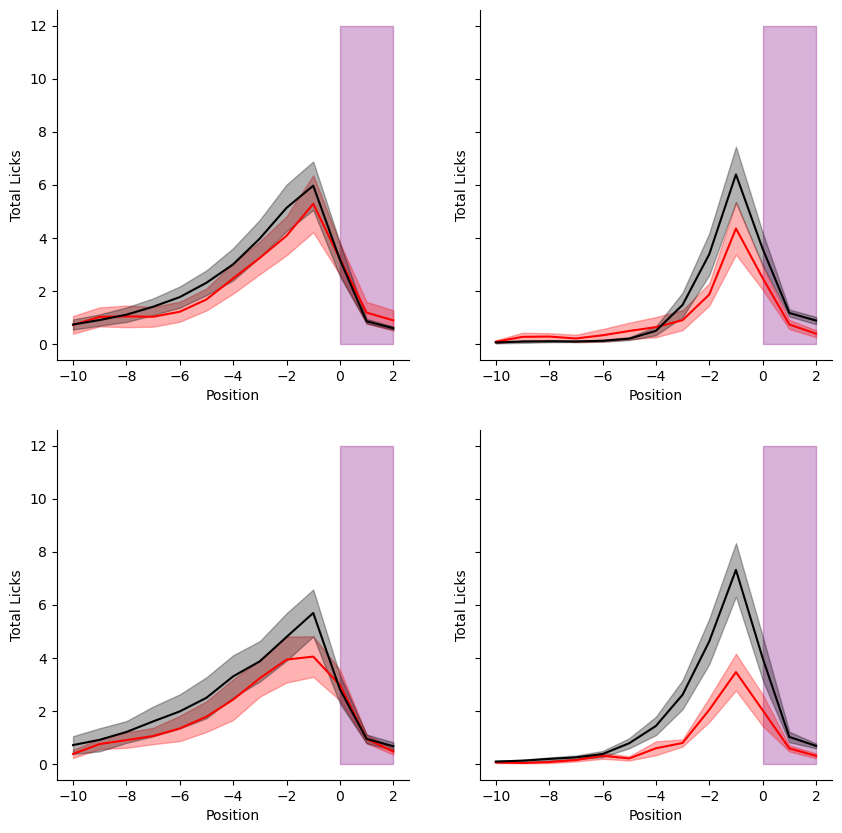

In [56]:
fig, ax = plt.subplots(2, 2, figsize=[10, 10], sharey=True)

df = {'mouse': [], 'ko': [], 'day': [], 'nov': [], 'total_licks': []}

key = 'total_licks'
if key in ('licks', 'nonconsum_licks'):
    alpha = dt
elif key in ('speed'):
    alpha = dt * 10
else:
    alpha = 1.

ko_lr, ctrl_lr = {}, {}
days = [0, 5]  # <--- only days 0 and 6

for d_ind, day in enumerate(days):
    ko_lr[day] = {'fam': [], 'nov': []}
    x = np.arange(-10, 3)

    # --- KO MICE ---
    for mouse in ko_mice:
        sess = u.load_vr_day(mouse, day, trial_mat_keys=('licks','nonconsum_licks','licks_sum','speed'), verbose=False)
        if isinstance(sess, stx.session.ConcatYMazeSession):
            sess = get_concat_total_licks(mouse, day, ko='KO')
        else:
            sess.timeseries['total_licks'] = np.copy(sess.timeseries['nonconsum_licks'])
            sess.add_pos_binned_trial_matrix('total_licks', use_sum=True)

        bin_edges = sess.trial_matrices['bin_edges']
        for ax_ind, lr in enumerate([-1, 1]):
            trial_mask = sess.trial_info['LR'] == lr
            mu = alpha * np.nanmean(sess.trial_matrices[key][trial_mask, :], axis=0)

            # Determine reward zone front positions
            if sess.novel_arm == -1:
                fam_rzone_front = np.argwhere(
                    (sess.rzone_late['tfront'] <= bin_edges[1:]) *
                    (sess.rzone_late['tfront'] >= bin_edges[:-1])
                )[0][0]
                nov_rzone_front = np.argwhere(
                    (sess.rzone_early['tfront'] <= bin_edges[1:]) *
                    (sess.rzone_early['tfront'] >= bin_edges[:-1])
                )[0][0]
            elif sess.novel_arm == 1:
                fam_rzone_front = np.argwhere(
                    (sess.rzone_early['tfront'] <= bin_edges[1:]) *
                    (sess.rzone_early['tfront'] >= bin_edges[:-1])
                )[0][0]
                nov_rzone_front = np.argwhere(
                    (sess.rzone_late['tfront'] <= bin_edges[1:]) *
                    (sess.rzone_late['tfront'] >= bin_edges[:-1])
                )[0][0]

            # Append trial means
            if lr == sess.novel_arm:
                ko_lr[day]['nov'].append(mu[nov_rzone_front - 10:nov_rzone_front + 3])
                _nov = np.nanmean(mu[nov_rzone_front - 3:nov_rzone_front + 1])

            else:
                ko_lr[day]['fam'].append(mu[fam_rzone_front - 10:fam_rzone_front + 3])
                _fam = np.nanmean(mu[fam_rzone_front - 3:fam_rzone_front + 1])


    # --- CONTROL MICE ---
    ctrl_lr[day] = {'fam': [], 'nov': []}
    for mouse in ctrl_mice:
        sess = u.load_vr_day(mouse, day, trial_mat_keys=('licks','nonconsum_licks','licks_sum','speed'), verbose=False)
        if isinstance(sess, stx.session.ConcatYMazeSession):
            sess = get_concat_total_licks(mouse, day, ko='CTRL')
        else:
            sess.timeseries['total_licks'] = np.copy(sess.timeseries['nonconsum_licks'])
            sess.add_pos_binned_trial_matrix('total_licks', use_sum=True)

        bin_edges = sess.trial_matrices['bin_edges']
        for ax_ind, lr in enumerate([-1, 1]):
            trial_mask = sess.trial_info['LR'] == lr
            mu = alpha * np.nanmean(sess.trial_matrices[key][trial_mask, :], axis=0)

            if sess.novel_arm == -1:
                fam_rzone_front = np.argwhere(
                    (sess.rzone_late['tfront'] <= bin_edges[1:]) *
                    (sess.rzone_late['tfront'] >= bin_edges[:-1])
                )[0][0]
                nov_rzone_front = np.argwhere(
                    (sess.rzone_early['tfront'] <= bin_edges[1:]) *
                    (sess.rzone_early['tfront'] >= bin_edges[:-1])
                )[0][0]
            elif sess.novel_arm == 1:
                fam_rzone_front = np.argwhere(
                    (sess.rzone_early['tfront'] <= bin_edges[1:]) *
                    (sess.rzone_early['tfront'] >= bin_edges[:-1])
                )[0][0]
                nov_rzone_front = np.argwhere(
                    (sess.rzone_late['tfront'] <= bin_edges[1:]) *
                    (sess.rzone_late['tfront'] >= bin_edges[:-1])
                )[0][0]

            if lr == sess.novel_arm:
                ctrl_lr[day]['nov'].append(mu[nov_rzone_front - 10:nov_rzone_front + 3])
                _nov = np.nanmean(mu[nov_rzone_front - 3:nov_rzone_front + 1])

            else:
                ctrl_lr[day]['fam'].append(mu[fam_rzone_front - 10:fam_rzone_front + 3])
                _fam = np.nanmean(mu[fam_rzone_front - 3:fam_rzone_front + 1])


    # --- PLOTTING ---
    for ax_ind, lr in enumerate(['fam', 'nov']):
        arr = np.array(ko_lr[day][lr])
        mu, sem = np.nanmean(arr, axis=0), sp.stats.sem(arr, axis=0, nan_policy='omit')
        ax[ax_ind, d_ind].fill_between(x, mu - sem, mu + sem, color='red', alpha=.3, label='Cre')
        ax[ax_ind, d_ind].plot(x, mu, color='red', alpha=1)

        arr = np.array(ctrl_lr[day][lr])
        mu, sem = np.nanmean(arr, axis=0), sp.stats.sem(arr, axis=0, nan_policy='omit')
        ax[ax_ind, d_ind].fill_between(x, mu - sem, mu + sem, color='black', alpha=.3, label='Control')
        ax[ax_ind, d_ind].plot(x, mu, color='black', alpha=1)

        ax[ax_ind, d_ind].fill_betweenx([0, 12], 0, 2, zorder=-1, color='purple', alpha=.3)
        ax[ax_ind, d_ind].set_xlabel('Position')
        ax[ax_ind, d_ind].set_ylabel('Total Licks')
        ax[ax_ind, d_ind].spines['top'].set_visible(False)
        ax[ax_ind, d_ind].spines['right'].set_visible(False)

# Legend & save
# ax[0, 1].legend(loc='upper left')
# fig.suptitle('Familiar vs. Novel Lick Rate – Days 0 and 6', fontsize=14)
fig.savefig(os.path.join(fig_dir, 'famnov_total_day0_day6.pdf'))


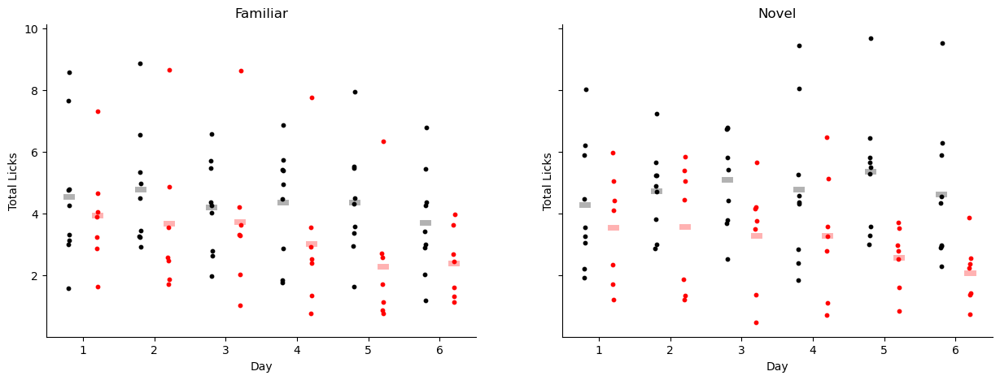

In [59]:
fig, ax = plt.subplots(1,2, figsize=[15,5], sharey=True)

lw = 5
s = 10
key = 'total_licks'
for day in range(6):
    
    mask = (dataframe['ko']=='ctrl') & (dataframe['day']==day) & (dataframe['nov']=='fam')
    lr = dataframe[key].loc[mask]._values
    ax[0].scatter(5*day -1 + np.linspace(-0.05, 0.05, num=lr.shape[0]), lr, color='black', s=s)
    ax[0].plot(5*day -1 + np.array([-0.2, .2]), lr.mean()*np.ones([2,]), color='black', linewidth=lw,alpha = .3)
    
    mask = (dataframe['ko']=='ctrl') & (dataframe['day']==day) & (dataframe['nov']=='nov')
    lr = dataframe[key].loc[mask]._values
    ax[1].scatter(5*day -1 + np.linspace(-0.05, 0.05, num=lr.shape[0]), lr, color='black', s=s, alpha = 1)
    ax[1].plot(5*day -1 + np.array([-0.2, .2]), lr.mean()*np.ones([2,]), color='black', linewidth=lw,alpha = .3)
    
    mask = (dataframe['ko']=='ko') & (dataframe['day']==day) & (dataframe['nov']=='fam')
    lr = dataframe[key].loc[mask]._values
    ax[0].scatter(5*day +1 + np.linspace(-0.05, 0.05, num=lr.shape[0]), lr, color='red', s=s)
    ax[0].plot(5*day + 1 + np.array([-0.2, .2]), lr.mean()*np.ones([2,]), color='red', linewidth=lw,alpha = .3)
    
    mask = (dataframe['ko']=='ko') & (dataframe['day']==day)& (dataframe['nov']=='nov')
    lr = dataframe[key].loc[mask]._values
    ax[1].scatter(5*day +1 + np.linspace(-0.05, 0.05, num=lr.shape[0]), lr, color='red', s=s, alpha=1)
    ax[1].plot(5*day + 1 + np.array([-0.2, .2]), lr.mean()*np.ones([2,]), color='red', linewidth=lw,alpha = .3)
    
ax[0].set_title('Familiar')
ax[1].set_title('Novel')
    
for a in range(2):

    ax[a].set_xticks(np.arange(0,6*5,5))
    ax[a].set_xticklabels([x for x in range(1,7)])

    ax[a].spines['top'].set_visible(False)
    ax[a].spines['right'].set_visible(False)

    ax[a].set_ylabel('Total Licks')
    ax[a].set_xlabel('Day')

fig.savefig(os.path.join(fig_dir, 'total_licks_summary.pdf'))

c:\users\esay\repos\twoputils\TwoPUtils\sess.py:100: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:232: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.1/28_09_2020/YMaze_LNovel/YMaze_LNovel_001_003.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:241: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.1/28_09_2020/YMaze_LNovel/YMaze_LNovel_001_003.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


c:\users\esay\repos\twoputils\TwoPUtils\sess.py:100: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:232: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.1/28_09_2020/YMaze_LNovel/YMaze_LNovel_006_014.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:241: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.1/28_09_2020/YMaze_LNovel/YMaze_LNovel_006_014.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


[<STX3KO_analyses.session.YMazeSession object at 0x00000224AD0F20E0>, <STX3KO_analyses.session.YMazeSession object at 0x000002249DAFF310>]
34199
[<STX3KO_analyses.session.YMazeSession object at 0x00000224AD0F20E0>, <STX3KO_analyses.session.YMazeSession object at 0x000002248D2A6E60>]
33190
[<STX3KO_analyses.session.YMazeSession object at 0x0000022491B7D660>, <STX3KO_analyses.session.YMazeSession object at 0x00000224AA6859F0>]
27495


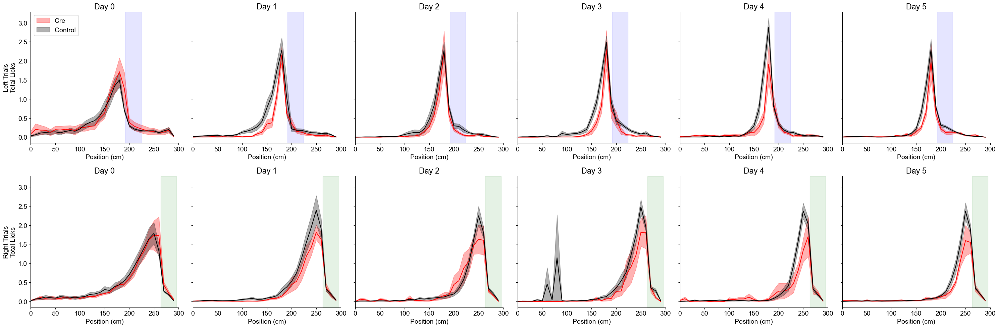

In [387]:
''' 
plotting ALL DAYS - Left and Right trials separately with full track position

'''

fig, ax = plt.subplots(2, 6, figsize=[30, 10], sharey=True)

df = {'mouse': [],
      'ko': [],
      'day': [],
      'trial_type': [],  # 'left' or 'right'
      'total_licks': [],
      }

key = 'total_licks'
alpha = 1  # No multiplication for total licks

ko_left, ko_right = {}, {}
ctrl_left, ctrl_right = {}, {}

for day in range(6):
    ko_left[day] = []
    ko_right[day] = []
    ctrl_left[day] = []
    ctrl_right[day] = []
    
    # Process KO mice
    for mouse in ko_mice:
        sess = u.load_vr_day(mouse, day, trial_mat_keys=('licks', 'nonconsum_licks', 'licks_sum', 'speed'), verbose=False)
        if isinstance(sess, stx.session.ConcatYMazeSession):
            sess = get_concat_total_licks(mouse, day, ko='KO')
        else:
            sess.timeseries['total_licks'] = np.copy(sess.timeseries['nonconsum_licks'])
            sess.add_pos_binned_trial_matrix('total_licks', use_sum=True)
        
        x = sess.trial_matrices['bin_centers']
        
        # Left trials
        left_mask = sess.trial_info['LR'] == -1
        mu_left = alpha * np.nanmean(sess.trial_matrices[key][left_mask, :], axis=0)
        ko_left[day].append(mu_left)
        
        # Calculate summary metric in reward zone
        bin_edges = sess.trial_matrices['bin_edges']
        left_rzone_mask = (bin_edges[:-1] >= sess.rzone_early['tfront'] - 3) & (bin_edges[:-1] <= sess.rzone_early['tfront'])
        _left = np.nanmean(mu_left[left_rzone_mask])
        df['mouse'].append(mouse)
        df['ko'].append('ko')
        df['day'].append(day)
        df['trial_type'].append('left')
        df['total_licks'].append(_left)
        
        # Right trials
        right_mask = sess.trial_info['LR'] == 1
        mu_right = alpha * np.nanmean(sess.trial_matrices[key][right_mask, :], axis=0)
        ko_right[day].append(mu_right)
        
        # Calculate summary metric in reward zone
        right_rzone_mask = (bin_edges[:-1] >= sess.rzone_late['tfront'] - 3) & (bin_edges[:-1] <= sess.rzone_late['tfront'])
        _right = np.nanmean(mu_right[right_rzone_mask])
        df['mouse'].append(mouse)
        df['ko'].append('ko')
        df['day'].append(day)
        df['trial_type'].append('right')
        df['total_licks'].append(_right)
    
    # Process Control mice
    for mouse in ctrl_mice:
        sess = u.load_vr_day(mouse, day, trial_mat_keys=('licks', 'nonconsum_licks', 'licks_sum', 'speed'), verbose=False)
        if isinstance(sess, stx.session.ConcatYMazeSession):
            sess = get_concat_total_licks(mouse, day, ko='CTRL')
        else:
            sess.timeseries['total_licks'] = np.copy(sess.timeseries['nonconsum_licks'])
            sess.add_pos_binned_trial_matrix('total_licks', use_sum=True)
        
        x = sess.trial_matrices['bin_centers']
        
        # Left trials
        left_mask = sess.trial_info['LR'] == -1
        mu_left = alpha * np.nanmean(sess.trial_matrices[key][left_mask, :], axis=0)
        ctrl_left[day].append(mu_left)
        
        # Calculate summary metric in reward zone
        bin_edges = sess.trial_matrices['bin_edges']
        left_rzone_mask = (bin_edges[:-1] >= sess.rzone_early['tfront'] - 3) & (bin_edges[:-1] <= sess.rzone_early['tfront'])
        _left = np.nanmean(mu_left[left_rzone_mask])
        df['mouse'].append(mouse)
        df['ko'].append('ctrl')
        df['day'].append(day)
        df['trial_type'].append('left')
        df['total_licks'].append(_left)
        
        # Right trials
        right_mask = sess.trial_info['LR'] == 1
        mu_right = alpha * np.nanmean(sess.trial_matrices[key][right_mask, :], axis=0)
        ctrl_right[day].append(mu_right)
        
        # Calculate summary metric in reward zone
        right_rzone_mask = (bin_edges[:-1] >= sess.rzone_late['tfront'] - 3) & (bin_edges[:-1] <= sess.rzone_late['tfront'])
        _right = np.nanmean(mu_right[right_rzone_mask])
        df['mouse'].append(mouse)
        df['ko'].append('ctrl')
        df['day'].append(day)
        df['trial_type'].append('right')
        df['total_licks'].append(_right)

df = pd.DataFrame(df)

# Get the last session to extract x-axis and reward zones for plotting
sess = u.load_vr_day(ctrl_mice[0], 0, trial_mat_keys=('licks', 'nonconsum_licks'), verbose=False)
x = sess.trial_matrices['bin_centers']

# Plotting
for day in range(6):
    # Left trials (top row)
    arr = np.array(ko_left[day])
    mu, sem = np.nanmean(arr, axis=0), sp.stats.sem(arr, axis=0, nan_policy='omit')
    ax[0, day].fill_between(10*(x-13.5), mu - sem, mu + sem, color='red', alpha=0.3, label='Cre')
    ax[0, day].plot(10*(x-13.5), mu, color='red', alpha=1, linewidth=1.5)
    
    arr = np.array(ctrl_left[day])
    mu, sem = np.nanmean(arr, axis=0), sp.stats.sem(arr, axis=0, nan_policy='omit')
    ax[0, day].fill_between(10*(x-13.5), mu - sem, mu + sem, color='black', alpha=0.3, label='Control')
    ax[0, day].plot(10*(x-13.5), mu, color='black', alpha=1, linewidth=1.5)
    
    # Add left reward zone
    ax[0, day].axvspan(10*(sess.rzone_early['tfront']-13.5), 10*(sess.rzone_early['tback']-13.5), 
                       color='blue', alpha=0.1, zorder=-1)
    
    # Right trials (bottom row)
    arr = np.array(ko_right[day])
    mu, sem = np.nanmean(arr, axis=0), sp.stats.sem(arr, axis=0, nan_policy='omit')
    ax[1, day].fill_between(10*(x-13.5), mu - sem, mu + sem, color='red', alpha=0.3, label='Cre')
    ax[1, day].plot(10*(x-13.5), mu, color='red', alpha=1, linewidth=1.5)
    
    arr = np.array(ctrl_right[day])
    mu, sem = np.nanmean(arr, axis=0), sp.stats.sem(arr, axis=0, nan_policy='omit')
    ax[1, day].fill_between(10*(x-13.5), mu - sem, mu + sem, color='black', alpha=0.3, label='Control')
    ax[1, day].plot(10*(x-13.5), mu, color='black', alpha=1, linewidth=1.5)
    
    # Add right reward zone
    ax[1, day].axvspan(10*(sess.rzone_late['tfront']-13.5), 10*(sess.rzone_late['tback']-13.5), 
                       color='green', alpha=0.1, zorder=-1)
    
    # Formatting for both rows
    for ax_ind in [0, 1]:
        ax[ax_ind, day].set_xlabel('Position (cm)')
        ax[ax_ind, day].spines['top'].set_visible(False)
        ax[ax_ind, day].spines['right'].set_visible(False)
        ax[ax_ind, day].set_title(f'Day {day}')
        ax[ax_ind, day].set_xlim([0, 300])

# Add row labels
ax[0, 0].set_ylabel('Left Trials\nTotal Licks')
ax[1, 0].set_ylabel('Right Trials\nTotal Licks')

ax[0, 0].legend(loc='upper left')

fig.tight_layout()
fig.savefig(os.path.join(fig_dir, 'left_right_total_licks_alldays.pdf'))

In [342]:
sparse_mice

('SparseKO_02',
 'SparseKO_06',
 'SparseKO_08',
 'SparseKO_10',
 'SparseKO_11',
 'SparseKO_13',
 'SparseKO_09')

c:\users\esay\repos\twoputils\TwoPUtils\sess.py:100: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:232: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.1/28_09_2020/YMaze_LNovel/YMaze_LNovel_001_003.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:241: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.1/28_09_2020/YMaze_LNovel/YMaze_LNovel_001_003.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


c:\users\esay\repos\twoputils\TwoPUtils\sess.py:100: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:232: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.1/28_09_2020/YMaze_LNovel/YMaze_LNovel_006_014.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
c:\users\esay\repos\twoputils\TwoPUtils\sess.py:241: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.1/28_09_2020/YMaze_LNovel/YMaze_LNovel_006_014.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


[<STX3KO_analyses.session.YMazeSession object at 0x00000224A5D03160>, <STX3KO_analyses.session.YMazeSession object at 0x00000224A5F5AE30>]
34199
[<STX3KO_analyses.session.YMazeSession object at 0x00000225736FCBE0>, <STX3KO_analyses.session.YMazeSession object at 0x00000224AA684F40>]
33190
[<STX3KO_analyses.session.YMazeSession object at 0x00000224A0577940>, <STX3KO_analyses.session.YMazeSession object at 0x00000224983A5BA0>]
27495


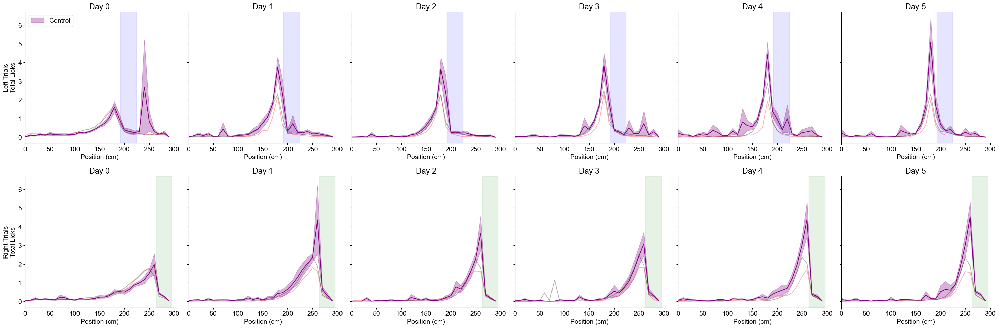

In [388]:
''' 
plotting ALL DAYS - Left and Right trials separately with full track position

'''

fig, ax = plt.subplots(2, 6, figsize=[30, 10], sharey=True)

df = {'mouse': [],
      'ko': [],
      'day': [],
      'trial_type': [],  # 'left' or 'right'
      'total_licks': [],
      }

key = 'total_licks'
alpha = 1  # No multiplication for total licks

ko_left, ko_right = {}, {}
ctrl_left, ctrl_right = {}, {}
sparse_left, sparse_right = {}, {}

for day in range(6):
    ko_left[day] = []
    ko_right[day] = []
    ctrl_left[day] = []
    ctrl_right[day] = []
    sparse_left[day] = []
    sparse_right[day] = []
    
    # Process KO mice
    for mouse in ko_mice:
        sess = u.load_vr_day(mouse, day, trial_mat_keys=('licks', 'nonconsum_licks', 'licks_sum', 'speed'), verbose=False)
        if isinstance(sess, stx.session.ConcatYMazeSession):
            sess = get_concat_total_licks(mouse, day, ko='KO')
        else:
            sess.timeseries['total_licks'] = np.copy(sess.timeseries['nonconsum_licks'])
            sess.add_pos_binned_trial_matrix('total_licks', use_sum=True)
        
        x = sess.trial_matrices['bin_centers']
        
        # Left trials
        left_mask = sess.trial_info['LR'] == -1
        mu_left = alpha * np.nanmean(sess.trial_matrices[key][left_mask, :], axis=0)
        ko_left[day].append(mu_left)
        
        # Calculate summary metric in reward zone
        bin_edges = sess.trial_matrices['bin_edges']
        left_rzone_mask = (bin_edges[:-1] >= sess.rzone_early['tfront'] - 3) & (bin_edges[:-1] <= sess.rzone_early['tfront'])
        _left = np.nanmean(mu_left[left_rzone_mask])
        df['mouse'].append(mouse)
        df['ko'].append('ko')
        df['day'].append(day)
        df['trial_type'].append('left')
        df['total_licks'].append(_left)
        
        # Right trials
        right_mask = sess.trial_info['LR'] == 1
        mu_right = alpha * np.nanmean(sess.trial_matrices[key][right_mask, :], axis=0)
        ko_right[day].append(mu_right)
        
        # Calculate summary metric in reward zone
        right_rzone_mask = (bin_edges[:-1] >= sess.rzone_late['tfront'] - 3) & (bin_edges[:-1] <= sess.rzone_late['tfront'])
        _right = np.nanmean(mu_right[right_rzone_mask])
        df['mouse'].append(mouse)
        df['ko'].append('ko')
        df['day'].append(day)
        df['trial_type'].append('right')
        df['total_licks'].append(_right)
    
    # Process Control mice
    for mouse in ctrl_mice:
        sess = u.load_vr_day(mouse, day, trial_mat_keys=('licks', 'nonconsum_licks', 'licks_sum', 'speed'), verbose=False)
        if isinstance(sess, stx.session.ConcatYMazeSession):
            sess = get_concat_total_licks(mouse, day, ko='CTRL')
        else:
            sess.timeseries['total_licks'] = np.copy(sess.timeseries['nonconsum_licks'])
            sess.add_pos_binned_trial_matrix('total_licks', use_sum=True)
        
        x = sess.trial_matrices['bin_centers']
        
        # Left trials
        left_mask = sess.trial_info['LR'] == -1
        mu_left = alpha * np.nanmean(sess.trial_matrices[key][left_mask, :], axis=0)
        ctrl_left[day].append(mu_left)
        
        # Calculate summary metric in reward zone
        bin_edges = sess.trial_matrices['bin_edges']
        left_rzone_mask = (bin_edges[:-1] >= sess.rzone_early['tfront'] - 3) & (bin_edges[:-1] <= sess.rzone_early['tfront'])
        _left = np.nanmean(mu_left[left_rzone_mask])
        df['mouse'].append(mouse)
        df['ko'].append('ctrl')
        df['day'].append(day)
        df['trial_type'].append('left')
        df['total_licks'].append(_left)
        
        # Right trials
        right_mask = sess.trial_info['LR'] == 1
        mu_right = alpha * np.nanmean(sess.trial_matrices[key][right_mask, :], axis=0)
        ctrl_right[day].append(mu_right)
        
        # Calculate summary metric in reward zone
        right_rzone_mask = (bin_edges[:-1] >= sess.rzone_late['tfront'] - 3) & (bin_edges[:-1] <= sess.rzone_late['tfront'])
        _right = np.nanmean(mu_right[right_rzone_mask])
        df['mouse'].append(mouse)
        df['ko'].append('ctrl')
        df['day'].append(day)
        df['trial_type'].append('right')
        df['total_licks'].append(_right)

    for mouse in sparse_mice:
        sess = u.load_vr_day(mouse, day, trial_mat_keys=('licks', 'nonconsum_licks', 'licks_sum', 'speed'), verbose=False)
 
        sess.timeseries['total_licks'] = np.copy(sess.timeseries['nonconsum_licks'])
        sess.add_pos_binned_trial_matrix('total_licks', use_sum=True)
        
        x = sess.trial_matrices['bin_centers']
        
        # Left trials
        left_mask = sess.trial_info['LR'] == -1
        mu_left = alpha * np.nanmean(sess.trial_matrices[key][left_mask, :], axis=0)
        sparse_left[day].append(mu_left)
        
        # Calculate summary metric in reward zone
        bin_edges = sess.trial_matrices['bin_edges']
        left_rzone_mask = (bin_edges[:-1] >= sess.rzone_early['tfront'] - 3) & (bin_edges[:-1] <= sess.rzone_early['tfront'])
        _left = np.nanmean(mu_left[left_rzone_mask])
        df['mouse'].append(mouse)
        df['ko'].append('sparse')
        df['day'].append(day)
        df['trial_type'].append('left')
        df['total_licks'].append(_left)
        
        # Right trials
        right_mask = sess.trial_info['LR'] == 1
        mu_right = alpha * np.nanmean(sess.trial_matrices[key][right_mask, :], axis=0)
        sparse_right[day].append(mu_right)
        
        # Calculate summary metric in reward zone
        right_rzone_mask = (bin_edges[:-1] >= sess.rzone_late['tfront'] - 3) & (bin_edges[:-1] <= sess.rzone_late['tfront'])
        _right = np.nanmean(mu_right[right_rzone_mask])
        df['mouse'].append(mouse)
        df['ko'].append('sparse')
        df['day'].append(day)
        df['trial_type'].append('right')
        df['total_licks'].append(_right)

df = pd.DataFrame(df)

# Get the last session to extract x-axis and reward zones for plotting
sess = u.load_vr_day(ctrl_mice[0], 0, trial_mat_keys=('licks', 'nonconsum_licks'), verbose=False)
x = sess.trial_matrices['bin_centers']

# Plotting
for day in range(6):
    # Left trials (top row)
    arr = np.array(ko_left[day])
    mu, sem = np.nanmean(arr, axis=0), sp.stats.sem(arr, axis=0, nan_policy='omit')
    # ax[0, day].fill_between(10*(x-13.5), mu - sem, mu + sem, color='red', alpha=0.3, label='Cre')
    ax[0, day].plot(10*(x-13.5), mu, color='red', alpha=0.3, linewidth=1.5)
    
    arr = np.array(ctrl_left[day])
    mu, sem = np.nanmean(arr, axis=0), sp.stats.sem(arr, axis=0, nan_policy='omit')
    # ax[0, day].fill_between(10*(x-13.5), mu - sem, mu + sem, color='black', alpha=0.3, label='Control')
    ax[0, day].plot(10*(x-13.5), mu, color='black', alpha=0.3, linewidth=1.5)

    arr = np.array(sparse_left[day])
    mu, sem = np.nanmean(arr, axis=0), sp.stats.sem(arr, axis=0, nan_policy='omit')
    ax[0, day].fill_between(10*(x-13.5), mu - sem, mu + sem, color='purple', alpha=0.3, label='Control')
    ax[0, day].plot(10*(x-13.5), mu, color='purple', alpha=1, linewidth=1.5)
    
    # Add left reward zone
    ax[0, day].axvspan(10*(sess.rzone_early['tfront']-13.5), 10*(sess.rzone_early['tback']-13.5), 
                       color='blue', alpha=0.1, zorder=-1)
    
    # Right trials (bottom row)
    arr = np.array(ko_right[day])
    mu, sem = np.nanmean(arr, axis=0), sp.stats.sem(arr, axis=0, nan_policy='omit')
    # ax[1, day].fill_between(10*(x-13.5), mu - sem, mu + sem, color='red', alpha=0.3, label='Cre')
    ax[1, day].plot(10*(x-13.5), mu, color='red', alpha=0.3, linewidth=1.5)
    
    arr = np.array(ctrl_right[day])
    mu, sem = np.nanmean(arr, axis=0), sp.stats.sem(arr, axis=0, nan_policy='omit')
    # ax[1, day].fill_between(10*(x-13.5), mu - sem, mu + sem, color='black', alpha=0.3, label='Control')
    ax[1, day].plot(10*(x-13.5), mu, color='black', alpha=0.3, linewidth=1.5)

    arr = np.array(sparse_right[day])
    mu, sem = np.nanmean(arr, axis=0), sp.stats.sem(arr, axis=0, nan_policy='omit')
    ax[1, day].fill_between(10*(x-13.5), mu - sem, mu + sem, color='purple', alpha=0.3)
    ax[1, day].plot(10*(x-13.5), mu, color='purple', alpha=1, linewidth=1.5)
    
    # Add right reward zone
    ax[1, day].axvspan(10*(sess.rzone_late['tfront']-13.5), 10*(sess.rzone_late['tback']-13.5), 
                       color='green', alpha=0.1, zorder=-1)
    
    # Formatting for both rows
    for ax_ind in [0, 1]:
        ax[ax_ind, day].set_xlabel('Position (cm)')
        ax[ax_ind, day].spines['top'].set_visible(False)
        ax[ax_ind, day].spines['right'].set_visible(False)
        ax[ax_ind, day].set_title(f'Day {day}')
        ax[ax_ind, day].set_xlim([0, 300])

# Add row labels
ax[0, 0].set_ylabel('Left Trials\nTotal Licks')
ax[1, 0].set_ylabel('Right Trials\nTotal Licks')

ax[0, 0].legend(loc='upper left')

fig.tight_layout()
fig.savefig(os.path.join(fig_dir, 'left_right_total_licks_alldays_sparse.pdf'))